# Projet P9 - Produisez une étude de marché avec R ou Python

*OPENCLASSROOMS - Parcours Data Analyst V2 - Adeline Le Ray - Avril 2023*
<hr>

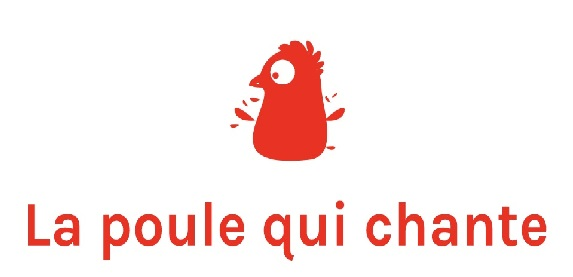

## <font color='blue'>Sommaire</font>

#### Notebook 1 - Préparation - Nettoyage - Analyse Exploratoire
**[Présentation du projet](#Presentation_projet)**
* [1. Rappel du contexte](#0_1)
* [2. Données sources](#0_2)
* [3. Objectifs de la mission](#0_3)
* [4. Démarche](#0_4)

**[Partie 1 - Importation et Inspection des fichiers de données](#partie1)**
* [1. Importation des librairies](#1_1)
* [2. Définition des fonctions](#1_2)
* [3. Importation et inspection des fichiers de données](#1_3)
* [4. Nettoyage des données brutes](#1_4)
    * [4.1. Types de variables et valeurs manquantes](#1_4_1)
    * [4.2. Doublons](#1_4_2)
    * [4.3. Valeurs aberrantes](#1_4_3)
    
**[Partie 2 - Préparation et Nettoyage des données](#partie2)**
* [1. Préparation des données](#2_1)
    * [1.1. Pivot des df et choix des variables pertinentes](#2_1_1)
    * [1.2. Jointure des df](#2_1_2)
* [2. Nettoyage des données](#2_2)
    * [2.1. Valeurs manquantes et type de variables](#2_2_1)
    * [2.2. Doublons](#2_2_2)
    * [2.3. Ajout de variables pour l'analyse](#2_2_3)
    * [2.4. Valeurs aberrantes](#2_2_4)
    
**[Partie 3 - Analyse exploratoire (hors ACP)](#partie3)**
* [1. Localisation des pays retenus pour l'étude](#3_1)
* [2. Analyse univariée](#3_2)
* [3. Corrélations entre les variables](#3_3)
* [4. Analyse bi-variée](#3_4)
* [5. Top et flop](#3_5)

**[Partie 4 - Analyse en composantes principales (ACP)](#partie4)**
* [1. Différents cas testés](#4_1)
* [2. ACP sur le cas retenu](#4_2)


#### *Notebook 2 - Clustering - Visualisation*

* *Partie 5 - Clustering*

# <font color='blue'>Présentation du projet<a class="anchor" id="Presentation_projet"></a></font>

## 1. Rappel du contexte<a class="anchor" id="0_1"></a>

La Poule qui chante est une entreprise française d'agroalimentaire qui souhaite se développer à l'international.

Mon rôle : Data Analyst chez La Poule qui chante


## 2. Données sources<a class="anchor" id="0_2"></a>
Les fichiers source utilisés sont les suivants:
- DisponibiliteAlimentaire_2017.csv : indicateurs de la disponibilité alimentaire par pays
- Population_2000_2018.csv : population en milliers d'habitants par pays

Données supplémentaires ajoutées suivant les critères de l'analyse PESTEL :
- Stabilite_politique_2017.csv : indice de stabilité politique par pays 
    - *perceptions de la probabilité que le gouvernement soit déstabilisé ou renversé par des moyens inconstitutionnels ou violents, y compris la violence et le terrorisme motivés politiquement.*
- PIB_2017.csv : PIB par habitant par pays
- Croissance_PIB_2017.csv : Croissance PIB par pays
- Emission_CO2_2017.csv : Emissions de CO2 par pays
- Abordabilité_nourriture_2017 : Abordabilité de la nourriture, pourcentage de la population n'ayant pas les moyens de s'offrir une alimentation saine
- Groupe_FAO.csv : groupes de pays

Source : [FAO](https://www.fao.org/faostat/fr/#data)

##### Analyse PESTEL :
L’analyse PESTEL est un outil d’analyse stratégique qui permet à l’entreprise d’identifier et de mesurer les éléments susceptibles d’impacter son activité et son développement. Le modèle PESTEL s’articule autour de ces 6 composants :

- **P pour Politique** : ensemble des décisions prises par les gouvernements (politique fiscale, commerce extérieur…) ;
- **E pour Économique** : ensemble des facteurs qui impactent le pouvoir d’achat et le comportement des consommateurs (revenu disponible, chômage, taux d’intérêt…) ;
- **S pour Sociologique** : ensemble des caractéristiques sociales influençant le pouvoir d’achat (démographie, niveau d’éducation, répartition des revenus, attitude de loisir et de travail, mobilité sociale…) ;
- **T pour Technologique** : ensemble des nouveautés technologiques susceptibles de perturber le marché (dépenses publiques de recherche et développement, nouveaux brevets, découvertes…) ;
- **E pour Environnemental** : ensemble des facteurs liés à l’environnement influençant la manière d’exercer l’activité (traitement des déchets, émission de pollution…) ;
- **L pour Légal** : ensemble des lois et des règlements impactant le cadre légal dans lequel évolue l’entreprise.

Pour compléter les données initiales avec des axes d'analyse PESTEL, les variables ci-dessous ont été retenues :
| Composant       | Variable (s) choisie(s)              |
| :--------------:|:------------------------------------:|
| Politique       | Indice de stabilité politique        |
| Economique      | PIB par habitant ($), croissance PIB |
| Sociologique    | Abordabilité de l'alimentation saine |
| Technologique   | *pas variable*                       |
| Environnemental | Emissions de CO2                     |
| Légal           | *pas variable*                       |

## 3. Objectifs de la mission<a class="anchor" id="0_3"></a>

Objectif : Proposer une première analyse des groupements de pays pouvant être ciblés pour l'export des poulets. L'étude de marché sera approfondie par la suite.

Pour la classification des pays (Clustering), 2 méthodes sont à tester : 
    - Méthode 1 : Classification ascendante hiérarchique (CAH), avec un dendrogramme comme visualisation
    - Méthode 2 : Méthode des k-means
Les résultats des 2 méthodes seront analysés et comparés.

Une analyse en Composantes principales est à réaliser pour visualiser les résultats des classifications, comprendre les groupes, les liens entre les variables, les liens entre les individus...

    
## 4. Démarche<a class="anchor" id="0_4"></a> 

La démarche utilisée pour réaliser le projet se découpe en 5 parties :

1. Importation et inspection des fichiers de données
2. Préparation et nettoyage des données
3. Analyse exploratoire des données (hors ACP)
4. Analyse en Composantes Principales (ACP)
5. Clustering 


# <font color='blue'>Partie 1 - Importation et inspection des fichiers de données<a class="anchor" id="partie1"></a></font>

## <font color='green'>1. Importation des librairies<a class="anchor" id="1_1"></a></font>

In [1]:
# Importation des librairies
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import plotly.express as px
import seaborn as sns

import scipy.stats as st

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [2]:
sns.set()

## <font color='green'>2. Définition des fonctions<a class="anchor" id="1_2"></a></font>

In [3]:
# Fonction pour générer un boxplot de la variable quantitative Y en fonction des modalités de la variable qualitative X
def modalite_boxplot(data,
                     X,
                     Y,
                     l_h,
                     showfliers):

    """Affiche le graphe boxplot de la variable quantitative Y en fonction des modalités de la variable qualitative X

        Positional arguments : 
        -----------------------------------
        data : dataframe
        X : variable qualitative
        Y : variable quantitative
        l_h : (l,h) figsize en inchs
        showfliers : True or False, affichage ou non des outliers
        """

    # Affichage du graphique
    modalites = data.sort_values(X) # tri 
    modalites = modalites[X].unique() # modalités de la variable 
    groupes = [] # Création de groupes

    # Boucle pour stocker les valeurs de Y pour chaque modalité de X 
    for m in modalites:
        groupes.append(data[data[X]==m][Y])

    # Propriétés graphiques  
    medianprops = {'color':"black"}
    meanprops = {'marker':'o', 'markeredgecolor':'black',
                'markerfacecolor':'firebrick'}

    plt.figure(figsize=l_h)
    plt.boxplot(groupes, labels=modalites, showfliers=showfliers, medianprops=medianprops, 
                vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
    plt.ylabel(X)
    plt.xlabel(Y)
    title = str(Y)+' par '+str(X)
    plt.title(title,fontsize=11)
    plt.show()

In [4]:
# Fonction pour détecter les outliers
def detectOutlier(data,threshold):
    outliers=[] # création d'une liste vide
    mean = np.mean(data)# calcul de la moyenne
    std =np.std(data)#calcul de l'écart-type
   
    for i in data:
        if std == 0:
            print('std nul')
            break
        z_score = (i - mean)/std#calcul du z-score
        if np.abs(z_score) > threshold: #valeur absolue du z-score
            outliers.append(i) # ajout de i dans la liste
    return outliers

In [5]:
def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(15, 11))

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i])

    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('PC{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('PC{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    plt.title("Cercle des corrélations (PC{} et PC{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

In [6]:
def display_factorial_planes(   X_projected, 
                                x_y, 
                                pca=None, 
                                labels = None,
                                clusters=None, 
                                alpha=1,
                                figsize=[10,8], 
                                marker="." ):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour PC1, PC2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # Forme de la figure
    if not figsize: 
        figsize = (7,6)

    # Labels
    if  labels is None : 
        labels = []
    try : 
        len(labels)
    except Exception as e : 
        raise e

    # Vérification de la variable axis 
    if not len(x_y) ==2 : 
        raise AttributeError("2 axes sont demandées")   
    if max(x_y )>= X_.shape[1] : 
        raise AttributeError("la variable axis n'est pas bonne")   

    # Définition de x et y 
    x, y = x_y

    # Initialisation de la figure       
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # Vérification de la présence de clustrers ou non
    c = None if clusters is None else clusters
 
    # Les points    
    # plt.scatter(   X_[:, x], X_[:, y], alpha=alpha, 
    #                     c=c, cmap="Set1", marker=marker)
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c)

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
    if pca : 
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else : 
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'PC{x+1} {v1}')
    ax.set_ylabel(f'PC{y+1} {v2}')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # Bornes pour x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) : 
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center') 

    # Titre et display
    plt.title(f"Projection des individus (sur PC{x+1} et PC{y+1})")
    plt.show()

## <font color='green'>3. Importation et inspection des fichiers de données<a class="anchor" id="1_3"></a></font>

La démarche de l'inspection des fichiers de données est la suivante :
* Importation
* Aperçu du data frame
* Dimension du data frame

### a. Fichier 'Disponibilités alimentaires'<a class="anchor" id="1_2_1"></a>

In [7]:
# Importation et aperçu du data frame
dispo_alim=pd.read_csv('DisponibiliteAlimentaire_2017.csv')
dispo_alim.head()

,Code Domaine,Domaine,Code zone,Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole
0,FBS,Nouveaux Bilans Alimentaire,2,Afghanistan,5511,Production,2511,Blé et produits,2017,2017,Milliers de tonnes,4281.0,S,Données standardisées
1,FBS,Nouveaux Bilans Alimentaire,2,Afghanistan,5611,Importations - Quantité,2511,Blé et produits,2017,2017,Milliers de tonnes,2302.0,S,Données standardisées
2,FBS,Nouveaux Bilans Alimentaire,2,Afghanistan,5072,Variation de stock,2511,Blé et produits,2017,2017,Milliers de tonnes,-119.0,S,Données standardisées
3,FBS,Nouveaux Bilans Alimentaire,2,Afghanistan,5911,Exportations - Quantité,2511,Blé et produits,2017,2017,Milliers de tonnes,0.0,S,Données standardisées
4,FBS,Nouveaux Bilans Alimentaire,2,Afghanistan,5301,Disponibilité intérieure,2511,Blé et produits,2017,2017,Milliers de tonnes,6701.0,S,Données standardisées


In [8]:
# Dimensions du data frame
dispo_alim.shape

(176600, 14)

### b. Fichier 'Population'<a class="anchor" id="1_2_2"></a>

In [9]:
# Importation et aperçu du data frame
pop=pd.read_csv('Population_2000_2018.csv')
pop.head()

,Code Domaine,Domaine,Code zone,Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Note
0,OA,Séries temporelles annuelles,2,Afghanistan,511,Population totale,3010,Population-Estimations,2000,2000,1000 personnes,20779.953,X,Sources internationales sûres,NaN
1,OA,Séries temporelles annuelles,2,Afghanistan,511,Population totale,3010,Population-Estimations,2001,2001,1000 personnes,21606.988,X,Sources internationales sûres,NaN
2,OA,Séries temporelles annuelles,2,Afghanistan,511,Population totale,3010,Population-Estimations,2002,2002,1000 personnes,22600.770,X,Sources internationales sûres,NaN
3,OA,Séries temporelles annuelles,2,Afghanistan,511,Population totale,3010,Population-Estimations,2003,2003,1000 personnes,23680.871,X,Sources internationales sûres,NaN
4,OA,Séries temporelles annuelles,2,Afghanistan,511,Population totale,3010,Population-Estimations,2004,2004,1000 personnes,24726.684,X,Sources internationales sûres,NaN


In [10]:
# Dimensions du data frame
pop.shape

(4411, 15)

### c. Fichier 'Stabilité politique'<a class="anchor" id="1_2_3"></a>

In [11]:
# Importation et aperçu du data frame
stab = pd.read_csv('Stabilite_politique_2017.csv')
stab.head()

,Code Domaine,Domaine,Code zone (FAO),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Note
0,FS,Données de la sécurité alimentaire,2,Afghanistan,6125,Valeur,21032,Stabilité politique et absence de violence/ter...,2017,2017,indice,-2.80,X,Ciffre de sources internationales,NaN
1,FS,Données de la sécurité alimentaire,202,Afrique du Sud,6125,Valeur,21032,Stabilité politique et absence de violence/ter...,2017,2017,indice,-0.28,X,Ciffre de sources internationales,NaN
2,FS,Données de la sécurité alimentaire,3,Albanie,6125,Valeur,21032,Stabilité politique et absence de violence/ter...,2017,2017,indice,0.38,X,Ciffre de sources internationales,NaN
3,FS,Données de la sécurité alimentaire,4,Algérie,6125,Valeur,21032,Stabilité politique et absence de violence/ter...,2017,2017,indice,-0.92,X,Ciffre de sources internationales,NaN
4,FS,Données de la sécurité alimentaire,79,Allemagne,6125,Valeur,21032,Stabilité politique et absence de violence/ter...,2017,2017,indice,0.59,X,Ciffre de sources internationales,NaN


In [12]:
# Dimensions du data frame
stab.shape

(197, 15)

### d. Fichier 'PIB_2017'<a class="anchor" id="1_2_4"></a>

In [13]:
# Importation et aperçu du data frame
PIB = pd.read_csv('PIB_hab_2017.csv')
PIB.head()

,Code Domaine,Domaine,Code zone (FAO),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Note
0,MK,Indicateurs macro,2,Afghanistan,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2017,2017,US$,530.149831,X,Ciffre de sources internationales,NaN
1,MK,Indicateurs macro,202,Afrique du Sud,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2017,2017,US$,6723.928582,X,Ciffre de sources internationales,NaN
2,MK,Indicateurs macro,3,Albanie,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2017,2017,US$,4521.752219,X,Ciffre de sources internationales,NaN
3,MK,Indicateurs macro,4,Algérie,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2017,2017,US$,4134.936054,X,Ciffre de sources internationales,NaN
4,MK,Indicateurs macro,79,Allemagne,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2017,2017,US$,44670.222288,X,Ciffre de sources internationales,NaN


In [14]:
# Dimensions du data frame
PIB.shape

(211, 15)

### e. Fichier 'Croissance_PIB_2017.csv'<a class="anchor" id="1_2_6"></a>

In [15]:
# Importation et aperçu du data frame
croissance_PIB = pd.read_csv('Croissance_PIB_2017.csv')
croissance_PIB.head()

,Code Domaine,Domaine,Code zone (FAO),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Note
0,MK,Indicateurs macro,2,Afghanistan,6129,Croissance annuelle US$,22008,Produit Intérieur Brut,2017,2017,%,4.865790,X,Ciffre de sources internationales,NaN
1,MK,Indicateurs macro,202,Afrique du Sud,6129,Croissance annuelle US$,22008,Produit Intérieur Brut,2017,2017,%,17.703800,X,Ciffre de sources internationales,NaN
2,MK,Indicateurs macro,3,Albanie,6129,Croissance annuelle US$,22008,Produit Intérieur Brut,2017,2017,%,9.765944,X,Ciffre de sources internationales,NaN
3,MK,Indicateurs macro,4,Algérie,6129,Croissance annuelle US$,22008,Produit Intérieur Brut,2017,2017,%,6.287893,X,Ciffre de sources internationales,NaN
4,MK,Indicateurs macro,79,Allemagne,6129,Croissance annuelle US$,22008,Produit Intérieur Brut,2017,2017,%,6.441277,X,Ciffre de sources internationales,NaN


In [16]:
# Dimensions du data frame
croissance_PIB.shape

(211, 15)

### f. Fichier 'Emission_CO2_2017.csv'<a class="anchor" id="1_2_7"></a>

In [17]:
# Importation et aperçu du data frame
CO2 = pd.read_csv('Emission_CO2_2017.csv')
CO2.head()

,Code Domaine,Domaine,Code zone (FAO),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Code source,Source,Unité,Valeur,Symbole,Description du Symbole,Note
0,GT,Totaux des émissions,2,Afghanistan,7273,Émissions (CO2),67292,Sols organiques drainés (CO2),2017,2017,3050,FAO TIER 1,kilotonnes,0.0000,E,Valeur estimée,NaN
1,GT,Totaux des émissions,2,Afghanistan,7273,Émissions (CO2),6994,On-farm energy use,2017,2017,3050,FAO TIER 1,kilotonnes,132.7927,E,Valeur estimée,NaN
2,GT,Totaux des émissions,2,Afghanistan,7273,Émissions (CO2),6751,Terres forestières,2017,2017,3050,FAO TIER 1,kilotonnes,154.6574,E,Valeur estimée,NaN
3,GT,Totaux des émissions,2,Afghanistan,7273,Émissions (CO2),6750,Conversion nette de forêt,2017,2017,3050,FAO TIER 1,kilotonnes,0.0000,E,Valeur estimée,NaN
4,GT,Totaux des émissions,2,Afghanistan,7273,Émissions (CO2),6993,Feux de tourbières,2017,2017,3050,FAO TIER 1,kilotonnes,0.0000,E,Valeur estimée,NaN


In [18]:
# Dimensions du data frame
CO2.shape

(3136, 17)

### g. Fichier 'Abordabilité_nourriture_2017'<a class="anchor" id="1_2_8"></a>

In [19]:
# Importation et aperçu du data frame
abord = pd.read_csv('Abordabilité_nourriture_2017.csv')
abord.head()

,Code Domaine,Domaine,Code zone (FAO),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole
0,CAHD,Coût et abordabilité d’une alimentation saine\...,202,Afrique du Sud,6121,Valeur,7005,Percentage of the population unable to afford ...,2017,2017,%,65.2,E,Valeur estimée
1,CAHD,Coût et abordabilité d’une alimentation saine\...,3,Albanie,6121,Valeur,7005,Percentage of the population unable to afford ...,2017,2017,%,37.8,E,Valeur estimée
2,CAHD,Coût et abordabilité d’une alimentation saine\...,4,Algérie,6121,Valeur,7005,Percentage of the population unable to afford ...,2017,2017,%,35.2,E,Valeur estimée
3,CAHD,Coût et abordabilité d’une alimentation saine\...,79,Allemagne,6121,Valeur,7005,Percentage of the population unable to afford ...,2017,2017,%,0.2,E,Valeur estimée
4,CAHD,Coût et abordabilité d’une alimentation saine\...,7,Angola,6121,Valeur,7005,Percentage of the population unable to afford ...,2017,2017,%,92.9,E,Valeur estimée


In [20]:
# Dimensions du data frame
abord.shape

(169, 14)

### i. Fichier 'Groupe_FAO'<a class="anchor" id="1_2_9"></a>

In [21]:
# Importation et aperçu du data frame
groupe = pd.read_csv('Groupe_FAO.csv')
groupe.head()

,Code Groupe de pays,Groupe de pays,Code Pays,Pays,Code M49,Code ISO2,Code ISO3
0,5100,Afrique,616,"Afrique de l'Ouest, non spécifié",875.0,F616,F616
1,5100,Afrique,202,Afrique du Sud,710.0,ZA,ZAF
2,5100,Afrique,4,Algérie,12.0,DZ,DZA
3,5100,Afrique,7,Angola,24.0,AO,AGO
4,5100,Afrique,24,Archipel des Chagos,86.0,IO,IOT


In [22]:
# Dimensions du data frame
groupe.shape

(1957, 7)

## <font color='green'>4. Nettoyage des données brutes<a class="anchor" id="1_4"></a></font>

### 4.1. Types de variables et valeurs manquantes <a class="anchor" id="1_4_1">

L'objectif est de : 
- vérifier que les variables sont bien du bon type et de corriger les erreurs éventuelles.
- identifier les éventuelles valeurs manquantes et de définir le traitement à effectuer.

In [23]:
dispo_alim.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 176600 entries, 0 to 176599
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Code Domaine            176600 non-null  object 
 1   Domaine                 176600 non-null  object 
 2   Code zone               176600 non-null  int64  
 3   Zone                    176600 non-null  object 
 4   Code Élément            176600 non-null  int64  
 5   Élément                 176600 non-null  object 
 6   Code Produit            176600 non-null  int64  
 7   Produit                 176600 non-null  object 
 8   Code année              176600 non-null  int64  
 9   Année                   176600 non-null  int64  
 10  Unité                   176600 non-null  object 
 11  Valeur                  176600 non-null  float64
 12  Symbole                 176600 non-null  object 
 13  Description du Symbole  176600 non-null  object 
dtypes: float64(1), int64

=> type de variables ok, pas de valeurs manquantes

In [24]:
pop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4411 entries, 0 to 4410
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Code Domaine            4411 non-null   object 
 1   Domaine                 4411 non-null   object 
 2   Code zone               4411 non-null   int64  
 3   Zone                    4411 non-null   object 
 4   Code Élément            4411 non-null   int64  
 5   Élément                 4411 non-null   object 
 6   Code Produit            4411 non-null   int64  
 7   Produit                 4411 non-null   object 
 8   Code année              4411 non-null   int64  
 9   Année                   4411 non-null   int64  
 10  Unité                   4411 non-null   object 
 11  Valeur                  4411 non-null   float64
 12  Symbole                 4411 non-null   object 
 13  Description du Symbole  4411 non-null   object 
 14  Note                    258 non-null    

=> type de variables ok, pas de valeurs manquantes

In [25]:
stab.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197 entries, 0 to 196
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Code Domaine            197 non-null    object 
 1   Domaine                 197 non-null    object 
 2   Code zone (FAO)         197 non-null    int64  
 3   Zone                    197 non-null    object 
 4   Code Élément            197 non-null    int64  
 5   Élément                 197 non-null    object 
 6   Code Produit            197 non-null    int64  
 7   Produit                 197 non-null    object 
 8   Code année              197 non-null    int64  
 9   Année                   197 non-null    int64  
 10  Unité                   197 non-null    object 
 11  Valeur                  197 non-null    float64
 12  Symbole                 197 non-null    object 
 13  Description du Symbole  197 non-null    object 
 14  Note                    0 non-null      fl

=> type de variables non ok, pas de valeurs manquantes

In [26]:
PIB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211 entries, 0 to 210
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Code Domaine            211 non-null    object 
 1   Domaine                 211 non-null    object 
 2   Code zone (FAO)         211 non-null    int64  
 3   Zone                    211 non-null    object 
 4   Code Élément            211 non-null    int64  
 5   Élément                 211 non-null    object 
 6   Code Produit            211 non-null    int64  
 7   Produit                 211 non-null    object 
 8   Code année              211 non-null    int64  
 9   Année                   211 non-null    int64  
 10  Unité                   211 non-null    object 
 11  Valeur                  211 non-null    float64
 12  Symbole                 211 non-null    object 
 13  Description du Symbole  211 non-null    object 
 14  Note                    0 non-null      fl

=> type de variables ok, pas de valeurs manquantes

In [27]:
croissance_PIB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211 entries, 0 to 210
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Code Domaine            211 non-null    object 
 1   Domaine                 211 non-null    object 
 2   Code zone (FAO)         211 non-null    int64  
 3   Zone                    211 non-null    object 
 4   Code Élément            211 non-null    int64  
 5   Élément                 211 non-null    object 
 6   Code Produit            211 non-null    int64  
 7   Produit                 211 non-null    object 
 8   Code année              211 non-null    int64  
 9   Année                   211 non-null    int64  
 10  Unité                   211 non-null    object 
 11  Valeur                  211 non-null    float64
 12  Symbole                 211 non-null    object 
 13  Description du Symbole  211 non-null    object 
 14  Note                    0 non-null      fl

In [28]:
CO2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3136 entries, 0 to 3135
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Code Domaine            3136 non-null   object 
 1   Domaine                 3136 non-null   object 
 2   Code zone (FAO)         3136 non-null   int64  
 3   Zone                    3136 non-null   object 
 4   Code Élément            3136 non-null   int64  
 5   Élément                 3136 non-null   object 
 6   Code Produit            3136 non-null   int64  
 7   Produit                 3136 non-null   object 
 8   Code année              3136 non-null   int64  
 9   Année                   3136 non-null   int64  
 10  Code source             3136 non-null   int64  
 11  Source                  3136 non-null   object 
 12  Unité                   3136 non-null   object 
 13  Valeur                  3135 non-null   float64
 14  Symbole                 3136 non-null   

In [29]:
abord.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 169 entries, 0 to 168
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Code Domaine            169 non-null    object 
 1   Domaine                 169 non-null    object 
 2   Code zone (FAO)         169 non-null    int64  
 3   Zone                    169 non-null    object 
 4   Code Élément            169 non-null    int64  
 5   Élément                 169 non-null    object 
 6   Code Produit            169 non-null    int64  
 7   Produit                 169 non-null    object 
 8   Code année              169 non-null    int64  
 9   Année                   169 non-null    int64  
 10  Unité                   169 non-null    object 
 11  Valeur                  143 non-null    float64
 12  Symbole                 169 non-null    object 
 13  Description du Symbole  169 non-null    object 
dtypes: float64(1), int64(5), object(8)
memory 

In [30]:
groupe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1957 entries, 0 to 1956
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Code Groupe de pays  1957 non-null   int64  
 1   Groupe de pays       1957 non-null   object 
 2   Code Pays            1957 non-null   int64  
 3   Pays                 1957 non-null   object 
 4   Code M49             1957 non-null   float64
 5   Code ISO2            1949 non-null   object 
 6   Code ISO3            1957 non-null   object 
dtypes: float64(1), int64(2), object(4)
memory usage: 107.1+ KB


### 4.2. Doublons <a class="anchor" id="1_4_2">

L'objectif est d'identifier les éventuels doublons et de les traiter.

df_dispo_alim : la clé primaire 'Zone/Element/Produit' doit être unique.

In [31]:
# Affichage des doublons de 'Zone/Element/Produit'
dispo_alim.loc[dispo_alim[['Code zone','Code Élément','Code Produit']].duplicated(keep=False),:]

,Code Domaine,Domaine,Code zone,Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole


Pour les df ci-dessous, la clé primaire 'Code zone/Code Element/Code Produit/Année' doit être unique.

In [32]:
# Affichage des doublons de 'Code zone/Code Element/Code Produit/Année'
pop.loc[pop[['Code zone','Code Élément','Code Produit','Année']].duplicated(keep=False),:]

,Code Domaine,Domaine,Code zone,Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Note


In [33]:
# Affichage des doublons de 'Code zone/Code Element/Code Produit/Année'
stab.loc[stab[['Code zone (FAO)','Élément','Produit','Année']].duplicated(keep=False),:]

,Code Domaine,Domaine,Code zone (FAO),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Note


In [34]:
# Affichage des doublons de 'Code zone/Code Element/Code Produit/Année'
PIB.loc[PIB[['Code zone (FAO)','Code Élément','Code Produit','Année']].duplicated(keep=False),:]

,Code Domaine,Domaine,Code zone (FAO),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Note


In [35]:
# Affichage des doublons de 'Code zone/Code Element/Code Produit/Année'
croissance_PIB.loc[croissance_PIB[['Code zone (FAO)','Code Élément','Code Produit','Année']].duplicated(keep=False),:]

,Code Domaine,Domaine,Code zone (FAO),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Note


In [36]:
# Affichage des doublons de 'Code zone/Code Element/Code Produit/Année'
CO2.loc[CO2[['Code zone (FAO)','Code Élément','Code Produit','Année']].duplicated(keep=False),:]

,Code Domaine,Domaine,Code zone (FAO),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Code source,Source,Unité,Valeur,Symbole,Description du Symbole,Note


In [37]:
# Affichage des doublons de 'Code zone/Code Element/Code Produit/Année'
abord.loc[abord[['Code zone (FAO)','Code Élément','Code Produit','Année']].duplicated(keep=False),:]

,Code Domaine,Domaine,Code zone (FAO),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole


=> aucun doublon

groupe : la clé primaire 'Code Groupe de pays' + 'Code Pays' doit être unique.

In [38]:
# Affichage des doublons de 'Code groupe pays'+ 'Code Pays'
groupe.loc[groupe[['Code Groupe de pays','Code Pays']].duplicated(keep=False),:]

,Code Groupe de pays,Groupe de pays,Code Pays,Pays,Code M49,Code ISO2,Code ISO3
446,5300,Asie,351,Chine,159.0,F351,CHN
447,5300,Asie,351,Chine,159.0,F351,F351
450,5300,Asie,41,"Chine, continentale",156.0,CN,CHN
451,5300,Asie,41,"Chine, continentale",156.0,CN,F41
584,5302,Asie orientale,351,Chine,159.0,F351,CHN
585,5302,Asie orientale,351,Chine,159.0,F351,F351
588,5302,Asie orientale,41,"Chine, continentale",156.0,CN,CHN
589,5302,Asie orientale,41,"Chine, continentale",156.0,CN,F41
600,5307,Asie orientale et Asie du Sud-Est,41,"Chine, continentale",156.0,CN,CHN
601,5307,Asie orientale et Asie du Sud-Est,41,"Chine, continentale",156.0,CN,F41


In [39]:
#Nombre de doublons
groupe[['Code Groupe de pays','Code Pays']].duplicated().sum()

10

In [40]:
# suppression des doublons (le code FAO sera utilisé par la suite)
groupe = groupe.drop_duplicates(subset=['Code Groupe de pays','Code Pays'])

### 4.3. Valeurs aberrantes<a class="anchor" id="1_4_3">

In [41]:
dispo_alim.describe()

,Code zone,Code Élément,Code Produit,Code année,Année,Valeur
count,176600.000000,176600.000000,176600.000000,176600.0,176600.0,176600.000000
mean,125.474740,3810.052894,2628.778545,2017.0,2017.0,210.554918
std,72.941699,2211.790089,91.993247,0.0,0.0,4762.047787
min,1.000000,645.000000,2511.000000,2017.0,2017.0,-10388.000000
25%,63.000000,684.000000,2556.000000,2017.0,2017.0,0.000000
50%,120.000000,5142.000000,2612.000000,2017.0,2017.0,0.120000
75%,188.000000,5301.000000,2732.000000,2017.0,2017.0,8.462500
max,276.000000,5911.000000,2899.000000,2017.0,2017.0,758548.000000


=> Valeurs négatives : 
- Résidus et variations de stock : ok
- Disponibilité intérieure : comme indiqué ci-dessous, les variations de stock et les exportations peuvent expliquer des valeurs négatives
    -  Production + importations - exportations + variations des stocks (baisse ou augmentation) = quantités disponibles pour l'utilisation intérieure. (source : [Manuel des bilans alimentaires - FAO](https://www.fao.org/3/X9892F/x9892f03.htm#bm03.3))

In [42]:
dispo_alim.loc[dispo_alim['Valeur']<0,:].groupby('Élément')['Zone'].count()

Élément
Alimentation pour touristes                57
Aliments pour animaux                       1
Autres utilisations (non alimentaire)       1
Disponibilité intérieure                  187
Résidus                                   913
Variation de stock                       1385
Name: Zone, dtype: int64

In [43]:
pop.describe()

,Code zone,Code Élément,Code Produit,Code année,Année,Valeur
count,4411.000000,4411.0,4411.0,4411.000000,4411.000000,4.411000e+03
mean,132.202902,511.0,3010.0,2009.068238,2009.068238,2.963004e+04
std,75.854840,0.0,0.0,5.481539,5.481539,1.238029e+05
min,1.000000,511.0,3010.0,2000.000000,2000.000000,7.850000e-01
25%,68.000000,511.0,3010.0,2004.000000,2004.000000,3.921890e+02
50%,132.000000,511.0,3010.0,2009.000000,2009.000000,4.764741e+03
75%,195.000000,511.0,3010.0,2014.000000,2014.000000,1.821548e+04
max,299.000000,511.0,3010.0,2018.000000,2018.000000,1.427648e+06


In [44]:
stab.describe()

,Code zone (FAO),Code Élément,Code Produit,Code année,Année,Valeur,Note
count,197.000000,197.0,197.0,197.0,197.0,197.000000,0.0
mean,128.578680,6125.0,21032.0,2017.0,2017.0,-0.061777,NaN
std,75.578248,0.0,0.0,0.0,0.0,0.994815,NaN
min,1.000000,6125.0,21032.0,2017.0,2017.0,-2.940000,NaN
25%,63.000000,6125.0,21032.0,2017.0,2017.0,-0.650000,NaN
50%,127.000000,6125.0,21032.0,2017.0,2017.0,0.040000,NaN
75%,193.000000,6125.0,21032.0,2017.0,2017.0,0.770000,NaN
max,299.000000,6125.0,21032.0,2017.0,2017.0,1.920000,NaN


In [45]:
PIB.describe()

,Code zone (FAO),Code Élément,Code Produit,Code année,Année,Valeur,Note
count,211.000000,211.0,211.0,211.0,211.0,211.000000,0.0
mean,131.327014,6119.0,22008.0,2017.0,2017.0,16886.035415,NaN
std,77.800307,0.0,0.0,0.0,0.0,25550.733577,NaN
min,1.000000,6119.0,22008.0,2017.0,2017.0,295.620936,NaN
25%,64.500000,6119.0,22008.0,2017.0,2017.0,2082.324019,NaN
50%,129.000000,6119.0,22008.0,2017.0,2017.0,6450.319585,NaN
75%,194.500000,6119.0,22008.0,2017.0,2017.0,19806.127104,NaN
max,351.000000,6119.0,22008.0,2017.0,2017.0,173611.814788,NaN


In [46]:
croissance_PIB.describe()

,Code zone (FAO),Code Élément,Code Produit,Code année,Année,Valeur,Note
count,211.000000,211.0,211.0,211.0,211.0,211.000000,0.0
mean,131.327014,6129.0,22008.0,2017.0,2017.0,7.100284,NaN
std,77.800307,0.0,0.0,0.0,0.0,7.538535,NaN
min,1.000000,6129.0,22008.0,2017.0,2017.0,-27.928307,NaN
25%,64.500000,6129.0,22008.0,2017.0,2017.0,4.501947,NaN
50%,129.000000,6129.0,22008.0,2017.0,2017.0,7.271943,NaN
75%,194.500000,6129.0,22008.0,2017.0,2017.0,9.941225,NaN
max,351.000000,6129.0,22008.0,2017.0,2017.0,36.133401,NaN


In [47]:
CO2.describe()

,Code zone (FAO),Code Élément,Code Produit,Code année,Année,Code source,Valeur,Note
count,3136.000000,3136.0,3136.000000,3136.0,3136.0,3136.0,3.135000e+03,0.0
mean,130.685268,7273.0,11250.563457,2017.0,2017.0,3050.0,1.663019e+04,NaN
std,76.437155,0.0,15917.193883,0.0,0.0,0.0,2.655702e+05,NaN
min,1.000000,7273.0,6504.000000,2017.0,2017.0,3050.0,-6.517653e+05,NaN
25%,65.000000,7273.0,6508.000000,2017.0,2017.0,3050.0,0.000000e+00,NaN
50%,129.000000,7273.0,6815.000000,2017.0,2017.0,3050.0,5.567540e+01,NaN
75%,194.000000,7273.0,6991.000000,2017.0,2017.0,3050.0,1.137017e+03,NaN
max,351.000000,7273.0,67292.000000,2017.0,2017.0,3050.0,9.565820e+06,NaN


In [48]:
CO2.loc[CO2['Valeur']<0,:].groupby('Produit')['Zone'].count()

Produit
Terres forestières    127
Name: Zone, dtype: int64

=> les Terres forrestières captent du CO2 : les émissions sont donc négatives.

In [49]:
abord.describe()

,Code zone (FAO),Code Élément,Code Produit,Code année,Année,Valeur
count,169.000000,169.0,169.0,169.0,169.0,143.000000
mean,127.881657,6121.0,7005.0,2017.0,2017.0,38.206294
std,76.889052,0.0,0.0,0.0,0.0,35.265021
min,1.000000,6121.0,7005.0,2017.0,2017.0,0.000000
25%,59.000000,6121.0,7005.0,2017.0,2017.0,2.800000
50%,123.000000,6121.0,7005.0,2017.0,2017.0,25.400000
75%,193.000000,6121.0,7005.0,2017.0,2017.0,74.850000
max,299.000000,6121.0,7005.0,2017.0,2017.0,97.500000


In [50]:
groupe.describe()

,Code Groupe de pays,Code Pays,Code M49
count,1947.000000,1947.000000,1947.000000
mean,5509.412943,142.279918,437.889137
std,1373.765672,96.517848,256.024237
min,336.000000,1.000000,4.000000
25%,5200.000000,69.000000,214.000000
50%,5403.000000,136.000000,434.000000
75%,5848.000000,203.000000,662.000000
max,9011.000000,622.000000,894.000000


# <font color='blue'>Partie 2 - Préparation et Nettoyage des données<a class="anchor" id="partie2"></a></font>


## <font color='green'>1. Préparation des données<a class="anchor" id="2_1"></a></font>
- pivot et tri des données pertinentes
- jointure des df

### 1.1. Pivot des df et tri des données pertinentes<a class="anchor" id="2_1_1"></a>

##### Disponibilité alimentaire en volaille

In [51]:
# Pivoter le df pour avoir les éléments en colonnes + Tri sur le produit 'Viande de Volailles'
df_dispo_volaille = dispo_alim.loc[dispo_alim['Code Produit']==2734,:]\
                            .pivot_table(index=['Code zone','Zone','Produit'], columns='Élément',values='Valeur').reset_index()

In [52]:
# renommer les colonnes
df_dispo_volaille = df_dispo_volaille.rename(columns={
    'Code zone':'c_zone',
    'Zone':'zone',
    'Produit':'produit',
    'Alimentation pour touristes':'alim_touristes_(kt)',
    'Aliments pour animaux':'aliments_animaux_(kt)',
    'Autres utilisations (non alimentaire)':'autres_utilisations_non_alim_(kt)',
    'Disponibilité alimentaire (Kcal/personne/jour)':'dispo_alim_(kcal/pers/j)',
    'Disponibilité alimentaire en quantité (kg/personne/an)':'dispo_alim_(kg/pers/an)',
    'Disponibilité de matière grasse en quantité (g/personne/jour)':'dispo_mg_(g/pers/j)',
    'Disponibilité de protéines en quantité (g/personne/jour)':'dispo_prot_(g/pers/j)',
    'Disponibilité intérieure':'dispo_interieure_(kt)',
    'Exportations - Quantité':'exportations_(kt)',
    'Importations - Quantité':'importations_(kt)',
    'Nourriture':'nourriture_(kt)',
    'Pertes':'pertes_(kt)',
    'Production':'production_(kt)',
    'Résidus':'residus_(kt)',
    'Semences':'semences_(kt)',
    'Traitement':'traitement_(kt)',
    'Variation de stock':'variation_stock_(kt)'                            
})

In [53]:
df_dispo_volaille.head()

Élément,c_zone,zone,produit,alim_touristes_(kt),aliments_animaux_(kt),autres_utilisations_non_alim_(kt),dispo_alim_(kcal/pers/j),dispo_alim_(kg/pers/an),dispo_mg_(g/pers/j),dispo_prot_(g/pers/j),dispo_interieure_(kt),exportations_(kt),importations_(kt),nourriture_(kt),pertes_(kt),production_(kt),residus_(kt),semences_(kt),traitement_(kt),variation_stock_(kt)
0,1,Arménie,Viande de Volailles,NaN,NaN,NaN,54.0,16.06,3.39,5.44,47.0,0.0,35.0,47.0,0.0,11.0,0.0,NaN,NaN,-2.0
1,2,Afghanistan,Viande de Volailles,NaN,NaN,NaN,5.0,1.53,0.33,0.54,57.0,NaN,29.0,55.0,2.0,28.0,0.0,NaN,NaN,0.0
2,3,Albanie,Viande de Volailles,NaN,NaN,NaN,85.0,16.36,6.45,6.26,47.0,0.0,38.0,47.0,NaN,13.0,0.0,NaN,NaN,4.0
3,4,Algérie,Viande de Volailles,0.0,NaN,NaN,22.0,6.38,1.50,1.97,277.0,0.0,2.0,264.0,13.0,275.0,0.0,NaN,NaN,0.0
4,7,Angola,Viande de Volailles,0.0,NaN,NaN,35.0,10.56,2.22,3.60,319.0,0.0,277.0,315.0,2.0,42.0,0.0,NaN,2.0,0.0


In [54]:
# Valeurs manquantes et type de variables
df_dispo_volaille.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172 entries, 0 to 171
Data columns (total 20 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   c_zone                             172 non-null    int64  
 1   zone                               172 non-null    object 
 2   produit                            172 non-null    object 
 3   alim_touristes_(kt)                78 non-null     float64
 4   aliments_animaux_(kt)              1 non-null      float64
 5   autres_utilisations_non_alim_(kt)  34 non-null     float64
 6   dispo_alim_(kcal/pers/j)           172 non-null    float64
 7   dispo_alim_(kg/pers/an)            172 non-null    float64
 8   dispo_mg_(g/pers/j)                172 non-null    float64
 9   dispo_prot_(g/pers/j)              172 non-null    float64
 10  dispo_interieure_(kt)              170 non-null    float64
 11  exportations_(kt)                  135 non-null    float64

=> Type de variables = ok

=> Beaucoup de valeurs manquantes pour certaines colonnes
Colonnes à ne pas conserver > 50% de valeurs manquantes
- 'aliments pour animaux' et 'semences' 
- 'autres utilisations non alimentaires 
- 'traitement_(kt)' 
- 'pertes_(kt)'
- 'alim_touristes_(kt)'

In [55]:
# Pourcentage de valeurs manquantes
na = round(df_dispo_volaille.isna().mean()*100,2)
na.loc[na>0]

Élément
alim_touristes_(kt)                  54.65
aliments_animaux_(kt)                99.42
autres_utilisations_non_alim_(kt)    80.23
dispo_interieure_(kt)                 1.16
exportations_(kt)                    21.51
importations_(kt)                     1.16
nourriture_(kt)                       1.16
pertes_(kt)                          61.05
production_(kt)                       2.33
residus_(kt)                          4.65
semences_(kt)                        99.42
traitement_(kt)                      73.26
variation_stock_(kt)                  1.74
dtype: float64

In [56]:
# Suppression des colonnes avec trop de valeurs manquantes et non pertinentes
del df_dispo_volaille['aliments_animaux_(kt)']
del df_dispo_volaille['semences_(kt)']
del df_dispo_volaille['autres_utilisations_non_alim_(kt)']
del df_dispo_volaille['traitement_(kt)']
del df_dispo_volaille['pertes_(kt)']
del df_dispo_volaille['alim_touristes_(kt)']
del df_dispo_volaille['residus_(kt)']

##### Dispo alimentaire totale en protéine d'origine animale

Source de protéines d'origine animale
- La viande rouge.
- La viande blanche.
- La charcuterie.
- Le poisson et les fruits de mer.
- Les œufs.
- Le fromage et les produits laitiers.

In [57]:
# Liste des produits d'origine animale et source de protéine 
source_prot_animale =   ['Viande de Bovins',
                         "Viande d'Ovins/Caprins", 
                         'Viande de Suides',
                         'Viande de Volailles', 
                         'Viande, Autre', 
                         'Abats Comestible',
                         'Beurre, Ghee', 
                         'Crème', 
                         'Graisses Animales Crue', 
                         'Oeufs',
                         'Lait - Excl Beurre', 
                         'Poissons Eau Douce', 
                         'Huiles de Poissons',
                         'Huiles de Foie de Poisso', 
                         'Perciform', 'Poissons Pelagiques',
                         'Poissons Marins, Autres', 
                         'Crustacés', 
                         'Cephalopodes',
                         'Mollusques, Autres',  
                         'Animaux Aquatiques Autre',
                         'Viande de Anim Aquatiq']

In [58]:
# Liste des codes Produit correspondants 
code_source_prot_animale = dispo_alim.loc[dispo_alim['Produit'].isin(source_prot_animale),'Code Produit']\
                                          .unique().tolist()

In [59]:
# Pivoter le df pour avoir les éléments en colonnes  et aggréger les dispos en protéine d'origine animale
df_prot_animale = dispo_alim.loc[
                            (dispo_alim['Code Produit'].isin(code_source_prot_animale))&
                            (dispo_alim['Code Élément']==674),:
                            ]\
                             .pivot_table(index=['Code zone','Zone'], 
                                          columns='Élément',
                                          values='Valeur',
                                          aggfunc='sum'
                                         ).reset_index()

In [60]:
# renommer les colonnes
df_prot_animale = df_prot_animale.rename(columns={
    'Code zone':'c_zone',
    'Zone':'zone',
    'Disponibilité de protéines en quantité (g/personne/jour)':'dispo_prot_animale_(g/pers/j)',                        
    })
df_prot_animale.head()

Élément,c_zone,zone,dispo_prot_animale_(g/pers/j)
0,1,Arménie,44.56
1,2,Afghanistan,10.56
2,3,Albanie,66.32
3,4,Algérie,25.70
4,7,Angola,16.47


In [61]:
# Valeurs manquantes et type de variables
df_prot_animale.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172 entries, 0 to 171
Data columns (total 3 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   c_zone                         172 non-null    int64  
 1   zone                           172 non-null    object 
 2   dispo_prot_animale_(g/pers/j)  172 non-null    float64
dtypes: float64(1), int64(1), object(1)
memory usage: 4.2+ KB


##### Population

In [62]:
# Pivoter le df pour avoir la population totale en colonne et ne conserver que les colonnes pertinentes
df_pop = pop.pivot_table(index=['Code zone','Zone'], columns='Année',values='Valeur').reset_index()

In [63]:
# Sélection des colonnes à conserver
df_pop = df_pop[['Code zone','Zone',2012,2017]]

# Renommer les colonnes
df_pop.columns = ['c_zone','zone','pop_2012','pop_2017']

In [64]:
df_pop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 238 entries, 0 to 237
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   c_zone    238 non-null    int64  
 1   zone      238 non-null    object 
 2   pop_2012  236 non-null    float64
 3   pop_2017  236 non-null    float64
dtypes: float64(2), int64(1), object(1)
memory usage: 7.6+ KB


In [65]:
# Identification des lignes avec des valeurs manquantes en 2017
df_pop.loc[df_pop['pop_2017'].isna(),:]

,c_zone,zone,pop_2012,pop_2017
165,186,Serbie-et-Monténégro,NaN,NaN
184,206,Soudan (ex),NaN,NaN


In [66]:
# Suppression des lignes en NaN pour 2017
df_pop = df_pop.loc[~df_pop['pop_2017'].isna(),:]

In [67]:
# Conversion de la population
df_pop['pop_2012'] = df_pop['pop_2012']*1000
df_pop['pop_2017'] = df_pop['pop_2017']*1000

# Calcul de la variotion de population en 10 ans
df_pop['Evol_pop_sur_5ans_(%)'] = (df_pop['pop_2017']-df_pop['pop_2012'])/df_pop['pop_2017']*100

# Sélection des colonnes à conserver
df_pop = df_pop[['c_zone','zone','pop_2017','Evol_pop_sur_5ans_(%)']]

In [68]:
df_pop.head()

,c_zone,zone,pop_2017,Evol_pop_sur_5ans_(%)
0,1,Arménie,2944791.0,2.056411
1,2,Afghanistan,36296113.0,14.146796
2,3,Albanie,2884169.0,-1.037630
3,4,Algérie,41389189.0,9.677150
4,5,Samoa américaines,55620.0,-0.084502


In [69]:
df_pop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 236 entries, 0 to 237
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   c_zone                 236 non-null    int64  
 1   zone                   236 non-null    object 
 2   pop_2017               236 non-null    float64
 3   Evol_pop_sur_5ans_(%)  236 non-null    float64
dtypes: float64(2), int64(1), object(1)
memory usage: 9.2+ KB


##### Stabilité politique

In [70]:
# Pivoter le df pour avoir les produits en colonnes
df_stab = stab.pivot_table(index=['Code zone (FAO)','Zone'], columns='Produit',values='Valeur').reset_index()

In [71]:
# Renommer les colonnes
df_stab.columns = ['c_zone','zone','stabilite_politique']

df_stab.head()

,c_zone,zone,stabilite_politique
0,1,Arménie,-0.62
1,2,Afghanistan,-2.80
2,3,Albanie,0.38
3,4,Algérie,-0.92
4,5,Samoa américaines,1.22


In [72]:
df_stab.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197 entries, 0 to 196
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   c_zone               197 non-null    int64  
 1   zone                 197 non-null    object 
 2   stabilite_politique  197 non-null    float64
dtypes: float64(1), int64(1), object(1)
memory usage: 4.7+ KB


##### PIB par habitant

In [73]:
# Pivoter le df pour avoir les produits en colonnes
df_PIB = PIB.pivot_table(index=['Code zone (FAO)','Zone'], columns='Produit',values='Valeur').reset_index()

In [74]:
# Renommer les colonnes
df_PIB.columns = ['c_zone','zone','PIB_hab_($)']

df_PIB.head()

,c_zone,zone,PIB_hab_($)
0,1,Arménie,4041.995071
1,2,Afghanistan,530.149831
2,3,Albanie,4521.752219
3,4,Algérie,4134.936054
4,6,Andorre,40632.206414


In [75]:
df_PIB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211 entries, 0 to 210
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   c_zone       211 non-null    int64  
 1   zone         211 non-null    object 
 2   PIB_hab_($)  211 non-null    float64
dtypes: float64(1), int64(1), object(1)
memory usage: 5.1+ KB


In [76]:
df_PIB.loc[df_PIB['c_zone']==351,:]

,c_zone,zone,PIB_hab_($)
210,351,Chine,8808.489506


##### Croissance PIB

In [77]:
# Pivoter le df pour avoir les produits en colonnes
df_croissance_PIB = croissance_PIB.pivot_table(index=['Code zone (FAO)','Zone'], columns='Produit',values='Valeur').reset_index()

In [78]:
# Renommer les colonnes
df_croissance_PIB.columns = ['c_zone','zone','croissance_PIB_(%)']

df_croissance_PIB.head()

,c_zone,zone,croissance_PIB_(%)
0,1,Arménie,9.305043
1,2,Afghanistan,4.865790
2,3,Albanie,9.765944
3,4,Algérie,6.287893
4,6,Andorre,3.645145


In [79]:
df_croissance_PIB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211 entries, 0 to 210
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   c_zone              211 non-null    int64  
 1   zone                211 non-null    object 
 2   croissance_PIB_(%)  211 non-null    float64
dtypes: float64(1), int64(1), object(1)
memory usage: 5.1+ KB


##### Emission CO2

In [80]:
# Pivoter le df pour avoir les produits en colonnes
df_CO2 = CO2.pivot_table(index=['Code zone (FAO)','Zone'], columns='Élément',values='Valeur', aggfunc = 'sum').reset_index()

In [81]:
# Renommer les colonnes
df_CO2.columns = ['c_zone','zone','emissions_CO2_(kt)']

df_CO2.head()

,c_zone,zone,emissions_CO2_(kt)
0,1,Arménie,6721.5108
1,2,Afghanistan,9355.8851
2,3,Albanie,6427.4028
3,4,Algérie,197987.7853
4,5,Samoa américaines,-41.1479


In [82]:
df_CO2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235 entries, 0 to 234
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   c_zone              235 non-null    int64  
 1   zone                235 non-null    object 
 2   emissions_CO2_(kt)  235 non-null    float64
dtypes: float64(1), int64(1), object(1)
memory usage: 5.6+ KB


##### Abordabilité de la nourriture

In [83]:
# Pivoter le df pour avoir les produits en colonnes
df_abord = abord.pivot_table(index=['Code zone (FAO)','Zone'], columns='Produit',values='Valeur').reset_index()

In [84]:
# Renommer les colonnes
df_abord.columns = ['c_zone','zone','pop_ss_moyen_alim_saine_(%)']

df_abord.head()

,c_zone,zone,pop_ss_moyen_alim_saine_(%)
0,1,Arménie,40.9
1,3,Albanie,37.8
2,4,Algérie,35.2
3,7,Angola,92.9
4,9,Argentine,11.0


In [85]:
df_abord.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 143 entries, 0 to 142
Data columns (total 3 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   c_zone                       143 non-null    int64  
 1   zone                         143 non-null    object 
 2   pop_ss_moyen_alim_saine_(%)  143 non-null    float64
dtypes: float64(1), int64(1), object(1)
memory usage: 3.5+ KB


##### Code zones géographiques

In [86]:
groupe

,Code Groupe de pays,Groupe de pays,Code Pays,Pays,Code M49,Code ISO2,Code ISO3
0,5100,Afrique,616,"Afrique de l'Ouest, non spécifié",875.0,F616,F616
1,5100,Afrique,202,Afrique du Sud,710.0,ZA,ZAF
2,5100,Afrique,4,Algérie,12.0,DZ,DZA
3,5100,Afrique,7,Angola,24.0,AO,AGO
4,5100,Afrique,24,Archipel des Chagos,86.0,IO,IOT
...,...,...,...,...,...,...,...
1952,5828,"Western Asia (exc. Armenia, Azerbaijan, Cyprus...",299,Palestine,275.0,F299,PSE
1953,5828,"Western Asia (exc. Armenia, Azerbaijan, Cyprus...",179,Qatar,634.0,QA,QAT
1954,5828,"Western Asia (exc. Armenia, Azerbaijan, Cyprus...",212,République arabe syrienne,760.0,SY,SYR
1955,5828,"Western Asia (exc. Armenia, Azerbaijan, Cyprus...",223,Turquie,792.0,TR,TUR


In [87]:
# Sélection des colonnes à conserver
df_groupe = groupe[['Code Groupe de pays','Groupe de pays','Code Pays','Pays','Code ISO3']]

# Renommer les colonnes
df_groupe.columns = ['c_groupe','groupe','c_zone','zone','code_ISO3']

df_groupe.head()

,c_groupe,groupe,c_zone,zone,code_ISO3
0,5100,Afrique,616,"Afrique de l'Ouest, non spécifié",F616
1,5100,Afrique,202,Afrique du Sud,ZAF
2,5100,Afrique,4,Algérie,DZA
3,5100,Afrique,7,Angola,AGO
4,5100,Afrique,24,Archipel des Chagos,IOT


Les pays sont contenus dans plusiseurs groupes (doublons dans la liste des codes pays) => un tri est à réaliser pour ne conserver les pays que dans un seul groupe.

In [88]:
df_groupe['c_zone'].duplicated().sum()

1670

In [89]:
df_groupe.loc[(df_groupe['groupe'].str.contains('.*income.*')==True)|\
                 (df_groupe['groupe'].str.contains('.*revenu.*')==True),:]\
            .groupby(['c_groupe','groupe'])['c_zone'].count()

c_groupe  groupe                                   
5815      Pays à faible revenu et à déficit vivrier    55
5858      Pays à faible revenu                         34
5859      Pays à revenu moyen                          46
9010      High-income economies                        70
9011      Upper-middle-income economies                56
Name: c_zone, dtype: int64

In [90]:
# Créaion du df_income pour les groupes de revenus des pays
df_income = df_groupe.loc[(df_groupe['c_groupe']==5858)|(df_groupe['c_groupe']==5859)|\
                             (df_groupe['c_groupe']==9010)|(df_groupe['c_groupe']==9011),
                             ['c_groupe','groupe','c_zone','zone']]
# Renommer les colonnes
df_income.columns = ['c_income','income','c_zone','zone']

In [91]:
df_income['c_zone'].duplicated().sum()

0

In [92]:
# Renommer les groupes de revenus
df_income.loc[(df_income['c_income']==5858),'income'] = '1_Pays à faible revenu'
df_income.loc[(df_income['c_income']==5859),'income'] = '2_Pays à revenu moyen'
df_income.loc[(df_income['c_income']==9010),'income'] = '3_Pays à revenu moyen supérieur'
df_income.loc[(df_income['c_income']==9011),'income'] = '4_Pays à haut revenu'

In [93]:
df_income.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 206 entries, 793 to 1943
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   c_income  206 non-null    int64 
 1   income    206 non-null    object
 2   c_zone    206 non-null    int64 
 3   zone      206 non-null    object
dtypes: int64(2), object(2)
memory usage: 8.0+ KB


In [94]:
# Créaion du df_cont pour les continent
df_cont = df_groupe.loc[(df_groupe['c_groupe']==5100)|(df_groupe['c_groupe']==5200)|\
                        (df_groupe['c_groupe']==5300)|(df_groupe['c_groupe']==5400)|\
                        (df_groupe['c_groupe']==5500)|(df_groupe['c_groupe']==5600),
                        ['c_groupe','groupe','c_zone','zone']]
# Renommer les colonnes
df_cont.columns = ['c_cont','continent','c_zone','zone']

In [95]:
df_cont['c_zone'].duplicated().sum()

0

In [96]:
df_cont.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 277 entries, 0 to 1856
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   c_cont     277 non-null    int64 
 1   continent  277 non-null    object
 2   c_zone     277 non-null    int64 
 3   zone       277 non-null    object
dtypes: int64(2), object(2)
memory usage: 10.8+ KB


In [97]:
# Conserver les groupes de zones géographiques
cont = df_groupe['c_groupe'].unique()

liste = cont[(cont>5100)&(cont<5200)]
liste = np.append(liste, cont[(cont>5200)&(cont<5205)])
liste = np.append(liste, cont[(cont>5205)&(cont<5208)])
liste = np.append(liste, cont[(cont>5300)&(cont<5306)])
liste = np.append(liste, cont[(cont>5400)&(cont<5500)])
liste = np.append(liste, cont[(cont>5500)&(cont<5600)])
liste = np.append(liste, cont[(cont>5600)&(cont<5700)])

df_groupe = df_groupe.loc[df_groupe['c_groupe'].isin(liste),:]

In [98]:
df_groupe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 272 entries, 63 to 1855
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   c_groupe   272 non-null    int64 
 1   groupe     272 non-null    object
 2   c_zone     272 non-null    int64 
 3   zone       272 non-null    object
 4   code_ISO3  272 non-null    object
dtypes: int64(2), object(3)
memory usage: 12.8+ KB


In [99]:
len(df_pop['zone'].to_list())

236

### 1.2. Jointures des dataframes<a class="anchor" id="2_1_2"></a>

In [100]:
# Vérifier si le df_pays contient tous les pays des autres df
pays = df_groupe['c_zone'].unique().tolist() # liste des pays

print('Nombre de pays non inclus dans le df_groupe :')
print('df_dispo_volaille: '+str(df_dispo_volaille.loc[~df_dispo_volaille['c_zone'].isin(pays),['c_zone','zone']].shape[0])+' pays')
print('df_pop: '+str(df_pop.loc[~df_pop['c_zone'].isin(pays),['c_zone','zone']].shape[0])+' pays')
print('df_stab: '+str(df_stab.loc[~df_stab['c_zone'].isin(pays),['c_zone','zone']].shape[0])+' pays')
print('df_PIB: '+str(df_PIB.loc[~df_PIB['c_zone'].isin(pays),['c_zone','zone']].shape[0])+' pays')
print('df_prot_animale: '+str(df_prot_animale.loc[~df_prot_animale['c_zone'].isin(pays),['c_zone','zone']].shape[0])+' pays')
print('df_croissance_PIB: '+str(df_croissance_PIB.loc[~df_croissance_PIB['c_zone'].isin(pays),['c_zone','zone']].shape[0])+' pays')
print('df_CO2: '+str(df_CO2.loc[~df_CO2['c_zone'].isin(pays),['c_zone','zone']].shape[0])+' pays')
print('df_abord: '+str(df_abord.loc[~df_abord['c_zone'].isin(pays),['c_zone','zone']].shape[0])+' pays')
print('df_income: '+str(df_income.loc[~df_income['c_zone'].isin(pays),['c_zone','zone']].shape[0])+' pays')
print('df_cont: '+str(df_cont.loc[~df_cont['c_zone'].isin(pays),['c_zone','zone']].shape[0])+' pays')

Nombre de pays non inclus dans le df_groupe :
df_dispo_volaille: 0 pays
df_pop: 0 pays
df_stab: 0 pays
df_PIB: 0 pays
df_prot_animale: 0 pays
df_croissance_PIB: 0 pays
df_CO2: 0 pays
df_abord: 0 pays
df_income: 0 pays
df_cont: 5 pays


In [101]:
df_cont.loc[~df_cont['c_zone'].isin(pays),['c_zone','zone']]

,c_zone,zone
671,78,Allemagne Fr
672,77,Allemagne Nl
1242,111,Île Johnston
1243,139,Île Midway
1856,30,Antarctique


In [102]:
# Jointure
df_cont.pop('zone') # suppression de la colonne 'zone' pour éviter les erreurs d'écritures
df0 = pd.merge(df_groupe, df_cont, on=['c_zone'], how='outer', indicator=True)
df0.shape

(277, 8)

In [103]:
# Analyse de la jointure
print("Analyse de la jointure df groupe et df_cont : ")
df0.groupby('_merge')['c_zone'].count()

Analyse de la jointure df groupe et df_cont : 


_merge
left_only       0
right_only      5
both          272
Name: c_zone, dtype: int64

In [104]:
# Jointure
df_income.pop('zone') # suppression de la colonne 'zone' pour éviter les erreurs d'écritures
df0.pop('_merge')# suppression de la colonne indicateur
df1 = pd.merge(df0, df_income, on=['c_zone'], how='outer', indicator=True)
df1.shape

(277, 10)

In [105]:
# Analyse de la jointure
print("Analyse de la jointure df_groupe/df_cont et df_income : ")
df1.groupby('_merge')['c_zone'].count()

Analyse de la jointure df_groupe/df_cont et df_income : 


_merge
left_only      71
right_only      0
both          206
Name: c_zone, dtype: int64

In [106]:
# Jointure
df_dispo_volaille.pop('zone') # suppression de la colonne 'zone' pour éviter les erreurs d'écritures
df1.pop('_merge')# suppression de la colonne indicateur
df2 = pd.merge(df1, df_dispo_volaille, on=['c_zone'], how='outer', indicator=True)
df2.shape

(277, 21)

In [107]:
# Analyse de la jointure
print("Analyse de la jointure df_groupe/continent/income et df_dispo_volaille : ")
df2.groupby('_merge')['c_zone'].count()

Analyse de la jointure df_groupe/continent/income et df_dispo_volaille : 


_merge
left_only     105
right_only      0
both          172
Name: c_zone, dtype: int64

In [108]:
# Jointure
df_pop.pop('zone') # suppression de la colonne 'zone' pour éviter les erreurs d'écritures
df2.pop('_merge')# suppression de la colonne indicateur
df3= pd.merge(df2, df_pop, on=['c_zone'], how='outer', indicator=True)
df3.shape

(277, 23)

In [109]:
# Analyse de la jointure
print("Analyse de la jointure df_groupe/continent/income/df_dispo_volaille et df_pop: ")
df3.groupby('_merge')['c_zone'].count()

Analyse de la jointure df_groupe/continent/income/df_dispo_volaille et df_pop: 


_merge
left_only      41
right_only      0
both          236
Name: c_zone, dtype: int64

In [110]:
# Jointure
df_stab.pop('zone') # suppression de la colonne 'zone' pour éviter les erreurs d'écritures
df3.pop('_merge')# suppression de la colonne indicateur
df4 = pd.merge(df3, df_stab, on=['c_zone'], how='outer', indicator=True)
df4.shape

(277, 24)

In [111]:
# Analyse de la jointure
print("Analyse de la jointure df_groupe/continent/income/df_dispo_volaille/df_pop et df_stab: ")
df4.groupby('_merge')['c_zone'].count()

Analyse de la jointure df_groupe/continent/income/df_dispo_volaille/df_pop et df_stab: 


_merge
left_only      80
right_only      0
both          197
Name: c_zone, dtype: int64

In [112]:
# Jointure
df_PIB.pop('zone') # suppression de la colonne 'zone' pour éviter les erreurs d'écritures
df4.pop('_merge')# suppression de la colonne indicateur
df5 = pd.merge(df4, df_PIB, on=['c_zone'], how='outer', indicator=True)
df5.shape

(277, 25)

In [113]:
# Analyse de la jointure
print("Analyse de la jointure df_groupe/continent/income/df_dispo_volaille/df_pop/df_stab et df_PIB: ")
df5.groupby('_merge')['c_zone'].count()

Analyse de la jointure df_groupe/continent/income/df_dispo_volaille/df_pop/df_stab et df_PIB: 


_merge
left_only      66
right_only      0
both          211
Name: c_zone, dtype: int64

In [114]:
# Jointure
df_prot_animale.pop('zone') # suppression de la colonne 'zone' pour éviter les erreurs d'écritures
df5.pop('_merge')# suppression de la colonne indicateur
df6 = pd.merge(df5, df_prot_animale, on=['c_zone'], how='outer', indicator=True)
df6.shape

(277, 26)

In [115]:
# Analyse de la jointure
print("Analyse de la jointure (df_groupe/continent/income/df_dispo_volaille/df_pop/df_stab/df_PIB) et df_prot: ")
df6.groupby('_merge')['c_zone'].count()

Analyse de la jointure (df_groupe/continent/income/df_dispo_volaille/df_pop/df_stab/df_PIB) et df_prot: 


_merge
left_only     105
right_only      0
both          172
Name: c_zone, dtype: int64

In [116]:
# Jointure
df_croissance_PIB.pop('zone') # suppression de la colonne 'zone' pour éviter les erreurs d'écritures
df6.pop('_merge')# suppression de la colonne indicateur
df7 = pd.merge(df6, df_croissance_PIB, on=['c_zone'], how='outer', indicator=True)
df7.shape

(277, 27)

In [117]:
# Analyse de la jointure
print("Analyse de la jointure (df_groupe/continent/income/df_dispo_volaille/df_pop/df_stab/df_PIB/df_prot) et df_croissance_PIB:")
df7.groupby('_merge')['c_zone'].count()

Analyse de la jointure (df_groupe/continent/income/df_dispo_volaille/df_pop/df_stab/df_PIB/df_prot) et df_croissance_PIB:


_merge
left_only      66
right_only      0
both          211
Name: c_zone, dtype: int64

In [118]:
# Jointure
df_CO2.pop('zone') # suppression de la colonne 'zone' pour éviter les erreurs d'écritures
df7.pop('_merge')# suppression de la colonne indicateur
df8 = pd.merge(df7, df_CO2, on=['c_zone'], how='outer', indicator=True)
df8.shape

(277, 28)

In [119]:
# Analyse de la jointure
print("Analyse de la jointure (df_groupe/continent/income/df_dispo_volaille/df_pop/df_stab/df_PIB/df_prot/df_croissance_PIB)",
      "et df_CO2 :")
df8.groupby('_merge')['c_zone'].count()

Analyse de la jointure (df_groupe/continent/income/df_dispo_volaille/df_pop/df_stab/df_PIB/df_prot/df_croissance_PIB) et df_CO2 :


_merge
left_only      42
right_only      0
both          235
Name: c_zone, dtype: int64

In [120]:
# Jointure
df_abord.pop('zone') # suppression de la colonne 'zone' pour éviter les erreurs d'écritures
df8.pop('_merge')# suppression de la colonne indicateur
df9 = pd.merge(df8, df_abord, on=['c_zone'], how='outer', indicator=True)
df9.shape

(277, 29)

In [121]:
# Analyse de la jointure
print("Analyse de la jointure (df_groupe/continent/income/df_dispo_volaille/df_pop/df_stab/df_PIB/df_prot/df_croissance_PIB",
      "/df_CO2) et df_abord :")
df9.groupby('_merge')['c_zone'].count()

Analyse de la jointure (df_groupe/continent/income/df_dispo_volaille/df_pop/df_stab/df_PIB/df_prot/df_croissance_PIB /df_CO2) et df_abord :


_merge
left_only     134
right_only      0
both          143
Name: c_zone, dtype: int64

In [122]:
df9.pop('_merge')
df_complet = df9
df_complet.head(5)

,c_groupe,groupe,c_zone,zone,code_ISO3,c_cont,continent,c_income,income,produit,...,production_(kt),variation_stock_(kt),pop_2017,Evol_pop_sur_5ans_(%),stabilite_politique,PIB_hab_($),dispo_prot_animale_(g/pers/j),croissance_PIB_(%),emissions_CO2_(kt),pop_ss_moyen_alim_saine_(%)
0,5104.0,Afrique australe,202,Afrique du Sud,ZAF,5100,Afrique,9011.0,4_Pays à haut revenu,Viande de Volailles,...,1667.0,0.0,57009756.0,7.326988,-0.28,6723.928582,34.56,17.703800,577933.0251,65.2
1,5104.0,Afrique australe,20,Botswana,BWA,5100,Afrique,9011.0,4_Pays à haut revenu,Viande de Volailles,...,5.0,0.0,2205080.0,7.506485,1.02,6705.339802,26.45,6.779399,49992.9993,63.8
2,5104.0,Afrique australe,209,Eswatini,SWZ,5100,Afrique,5859.0,2_Pays à revenu moyen,Viande de Volailles,...,6.0,0.0,1124805.0,4.046657,-0.27,3822.793411,18.10,15.343500,1779.2707,74.8
3,5104.0,Afrique australe,122,Lesotho,LSO,5100,Afrique,5859.0,2_Pays à revenu moyen,Viande de Volailles,...,2.0,1.0,2091534.0,3.659515,-0.19,1061.916962,12.22,9.013723,2848.0541,80.2
4,5104.0,Afrique australe,147,Namibie,NAM,5100,Afrique,9011.0,4_Pays à haut revenu,Viande de Volailles,...,11.0,0.0,2402633.0,8.650926,0.63,5450.334514,22.76,20.196593,16979.2766,54.4


## <font color='green'>2. Nettoyage des données<a class="anchor" id="2_2"></a></font>

In [123]:
df_complet.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 277 entries, 0 to 276
Data columns (total 28 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   c_groupe                       272 non-null    float64
 1   groupe                         272 non-null    object 
 2   c_zone                         277 non-null    int64  
 3   zone                           272 non-null    object 
 4   code_ISO3                      272 non-null    object 
 5   c_cont                         277 non-null    int64  
 6   continent                      277 non-null    object 
 7   c_income                       206 non-null    float64
 8   income                         206 non-null    object 
 9   produit                        172 non-null    object 
 10  dispo_alim_(kcal/pers/j)       172 non-null    float64
 11  dispo_alim_(kg/pers/an)        172 non-null    float64
 12  dispo_mg_(g/pers/j)            172 non-null    flo

### 2.1. Valeurs manquantes et type de variables<a class="anchor" id="2_2_1">

=> Beaucoup de valeurs manquantes. 

In [124]:
# Pourcentage de valeurs manquantes
na = round(df_complet.isna().mean()*100,2)
na.loc[na>0]

c_groupe                          1.81
groupe                            1.81
zone                              1.81
code_ISO3                         1.81
c_income                         25.63
income                           25.63
produit                          37.91
dispo_alim_(kcal/pers/j)         37.91
dispo_alim_(kg/pers/an)          37.91
dispo_mg_(g/pers/j)              37.91
dispo_prot_(g/pers/j)            37.91
dispo_interieure_(kt)            38.63
exportations_(kt)                51.26
importations_(kt)                38.63
nourriture_(kt)                  38.63
production_(kt)                  39.35
variation_stock_(kt)             38.99
pop_2017                         14.80
Evol_pop_sur_5ans_(%)            14.80
stabilite_politique              28.88
PIB_hab_($)                      23.83
dispo_prot_animale_(g/pers/j)    37.91
croissance_PIB_(%)               23.83
emissions_CO2_(kt)               15.16
pop_ss_moyen_alim_saine_(%)      48.38
dtype: float64

#### a.  Valeurs manquantes 'produit': 

Les valeurs manquantes ne sont pas à conserver car non pertinentes pour notre étude.

In [125]:
# Tri sur les lignes ayant des données produit
df_complet = df_complet.loc[~df_complet['produit'].isna(),:]

# Pourcentage de valeurs manquantes
na = round(df_complet.isna().mean()*100,2)
na.loc[na>0]

dispo_interieure_(kt)           1.16
exportations_(kt)              21.51
importations_(kt)               1.16
nourriture_(kt)                 1.16
production_(kt)                 2.33
variation_stock_(kt)            1.74
stabilite_politique             1.74
PIB_hab_($)                     0.58
croissance_PIB_(%)              0.58
pop_ss_moyen_alim_saine_(%)    19.77
dtype: float64

#### b.  Types des variables

In [126]:
# c_groupe et c_income : float -> int
df_complet['c_groupe'] = pd.to_numeric(df_complet['c_groupe'],downcast='integer')
df_complet['c_income'] = pd.to_numeric(df_complet['c_income'],downcast='integer')

C:\Users\Adeline\AppData\Local\Temp\ipykernel_22676\2151055848.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complet['c_groupe'] = pd.to_numeric(df_complet['c_groupe'],downcast='integer')
C:\Users\Adeline\AppData\Local\Temp\ipykernel_22676\2151055848.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complet['c_income'] = pd.to_numeric(df_complet['c_income'],downcast='integer')


In [127]:
df_complet.dtypes

c_groupe                           int16
groupe                            object
c_zone                             int64
zone                              object
code_ISO3                         object
c_cont                             int64
continent                         object
c_income                           int16
income                            object
produit                           object
dispo_alim_(kcal/pers/j)         float64
dispo_alim_(kg/pers/an)          float64
dispo_mg_(g/pers/j)              float64
dispo_prot_(g/pers/j)            float64
dispo_interieure_(kt)            float64
exportations_(kt)                float64
importations_(kt)                float64
nourriture_(kt)                  float64
production_(kt)                  float64
variation_stock_(kt)             float64
pop_2017                         float64
Evol_pop_sur_5ans_(%)            float64
stabilite_politique              float64
PIB_hab_($)                      float64
dispo_prot_anima

#### c. Valeurs manquantes 'Exportations'

Calcul des valeurs manquantes d'exportations grâce au lien entre dispo intérieure, production, importations, exportations et variation de stock :

Dispo intérieure = Production + Importations - Exportations + Variations de stocks

In [128]:
df_complet.loc[df_complet['exportations_(kt)'].isna(),\
               ['c_zone','zone','dispo_interieure_(kt)','production_(kt)','importations_(kt)',\
                'exportations_(kt)','variation_stock_(kt)']]

,c_zone,zone,dispo_interieure_(kt),production_(kt),importations_(kt),exportations_(kt),variation_stock_(kt)
10,37,République centrafricaine,11.0,7.0,4.0,NaN,0.0
12,193,Sao Tomé-et-Principe,2.0,1.0,2.0,NaN,1.0
16,233,Burkina Faso,46.0,46.0,0.0,NaN,0.0
17,35,Cabo Verde,10.0,1.0,12.0,NaN,4.0
19,75,Gambie,8.0,2.0,16.0,NaN,10.0
21,90,Guinée,50.0,13.0,37.0,NaN,0.0
22,175,Guinée-Bissau,4.0,3.0,4.0,NaN,3.0
24,133,Mali,52.0,48.0,1.0,NaN,-4.0
25,136,Mauritanie,22.0,5.0,24.0,NaN,6.0
35,72,Djibouti,3.0,NaN,3.0,NaN,0.0


In [129]:
# Boucle pour calculer la variables 'exportations' 
export_missing = df_complet.loc[df_complet['exportations_(kt)'].isna(),:]
end = export_missing.shape[0]

for i in range(0,end):
    c_zone = export_missing['c_zone'].iloc[i]
    exportations = round(df_complet.loc[df_complet['c_zone']==c_zone,'importations_(kt)']
                  + df_complet.loc[df_complet['c_zone']==c_zone,'production_(kt)']
                  - df_complet.loc[df_complet['c_zone']==c_zone,'dispo_interieure_(kt)']
                  - df_complet.loc[df_complet['c_zone']==c_zone,'variation_stock_(kt)'],2)
    
    if exportations.iloc[0]>=0:
        df_complet.loc[df_complet['c_zone']==c_zone,'exportations_(kt)'] = exportations
    if exportations.iloc[0] < 0:
        df_complet.loc[df_complet['c_zone']==c_zone,'exportations_(kt)'] = 0

In [130]:
# Pourcentage de valeurs manquantes
na = round(df_complet.isna().mean()*100,2)
na.loc[na>0]

dispo_interieure_(kt)           1.16
exportations_(kt)               2.33
importations_(kt)               1.16
nourriture_(kt)                 1.16
production_(kt)                 2.33
variation_stock_(kt)            1.74
stabilite_politique             1.74
PIB_hab_($)                     0.58
croissance_PIB_(%)              0.58
pop_ss_moyen_alim_saine_(%)    19.77
dtype: float64

In [131]:
# Valeurs manquantes 'Exportations'
df_complet.loc[df_complet['exportations_(kt)'].isna(),\
               ['c_zone','zone','dispo_interieure_(kt)','production_(kt)','importations_(kt)',\
                'exportations_(kt)','variation_stock_(kt)']]

,c_zone,zone,dispo_interieure_(kt),production_(kt),importations_(kt),exportations_(kt),variation_stock_(kt)
35,72,Djibouti,3.0,NaN,3.0,NaN,0.0
96,235,Ouzbékistan,NaN,NaN,NaN,NaN,NaN
105,120,République démocratique populaire lao,NaN,NaN,NaN,NaN,NaN
115,132,Maldives,12.0,NaN,12.0,NaN,0.0


In [132]:
# Suppression des pays Ouzbékistan et République démocratique populaire lao : pas de possibilité d'imputer une valeur
df_complet.drop([96,105], axis=0, inplace=True)

C:\Users\Adeline\AppData\Local\Temp\ipykernel_22676\1670552136.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_complet.drop([96,105], axis=0, inplace=True)


In [133]:
df_complet.loc[df_complet['exportations_(kt)'].isna(),\
               ['c_zone','zone','dispo_interieure_(kt)','production_(kt)','importations_(kt)',\
                'exportations_(kt)','variation_stock_(kt)']]

,c_zone,zone,dispo_interieure_(kt),production_(kt),importations_(kt),exportations_(kt),variation_stock_(kt)
35,72,Djibouti,3.0,NaN,3.0,NaN,0.0
115,132,Maldives,12.0,NaN,12.0,NaN,0.0


In [134]:
# Remplacer les NaN des colonnes en kt par 0 
column = pd.Series(df_complet.columns) # série contenant les noms des colonnes
column = column.loc[column.str.contains('kt')==True].tolist() # sélection des colonnes contenant 'kt'

# remplacement des valeurs NaN par 0
for col in column:
    df_complet.loc[df_complet[col].isna(),col] = 0

In [135]:
# Pourcentage de valeurs manquantes
na = round(df_complet.isna().mean()*100,2)
na.loc[na>0]

stabilite_politique             1.76
PIB_hab_($)                     0.59
croissance_PIB_(%)              0.59
pop_ss_moyen_alim_saine_(%)    19.41
dtype: float64

#### d. Valeurs manquantes 'Stabilité politique'

In [136]:
df_complet.loc[df_complet['stabilite_politique'].isna(),:]

,c_groupe,groupe,c_zone,zone,code_ISO3,c_cont,continent,c_income,income,produit,...,production_(kt),variation_stock_(kt),pop_2017,Evol_pop_sur_5ans_(%),stabilite_politique,PIB_hab_($),dispo_prot_animale_(g/pers/j),croissance_PIB_(%),emissions_CO2_(kt),pop_ss_moyen_alim_saine_(%)
142,5302,Asie orientale,41,"Chine, continentale",CHN,5300,Asie,9011,4_Pays à haut revenu,Viande de Volailles,...,18236.0,-50.0,1.421022e+09,2.590769,NaN,8729.136932,40.07,9.589146,1.076949e+07,14.3
247,5502,Mélanésie,153,Nouvelle-Calédonie,NCL,5500,Océanie,9010,3_Pays à revenu moyen supérieur,Viande de Volailles,...,1.0,-1.0,2.771500e+05,5.952372,NaN,32263.340715,48.28,5.223314,9.217660e+01,NaN
265,5504,Polynésie,70,Polynésie française,PYF,5500,Océanie,9010,3_Pays à revenu moyen supérieur,Viande de Volailles,...,1.0,0.0,2.761020e+05,2.572962,NaN,19743.958991,64.63,6.190222,1.263161e+02,NaN


=> Exploration des données pour choisir la meilleure option pour remplacer les stabilités politiques manquantes

groupe
Asie orientale    7
Mélanésie         3
Polynésie         1
Name: zone, dtype: int64


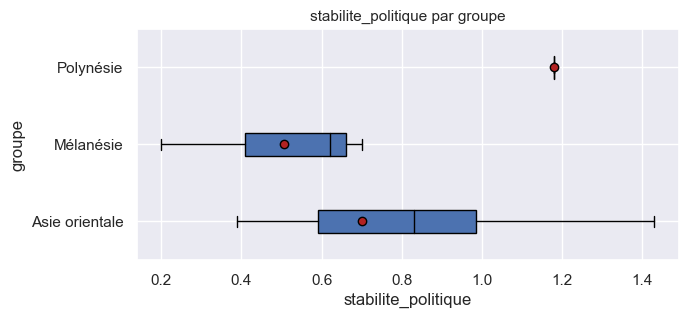

In [137]:
# Définition du dataframe
pays_stab_missing = df_complet.loc[df_complet['stabilite_politique'].isna(),'groupe'].tolist()
data = df_complet.loc[(~df_complet['stabilite_politique'].isna())&(df_complet['groupe'].isin(pays_stab_missing)),:]

# Nombre de pays dans chaque groupe géographique
print(data.groupby('groupe')['zone'].count())

# Boxplot avec les variables :
X = "groupe" # qualitative
Y = "stabilite_politique" # quantitative
l_h=(7,3) # dimensions du graphe
showfliers=False # pas d'affichage des outliers

modalite_boxplot(data,X,Y,l_h,False)               

continent
Asie       41
Océanie     7
Name: zone, dtype: int64


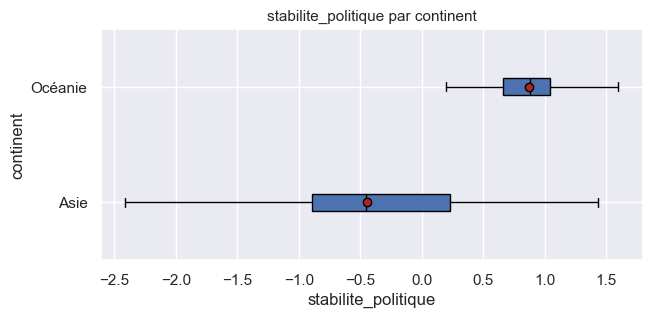

In [138]:
# Définition du dataframe
pays_stab_missing = df_complet.loc[df_complet['stabilite_politique'].isna(),'continent'].tolist()
data = df_complet.loc[(~df_complet['stabilite_politique'].isna())&(df_complet['continent'].isin(pays_stab_missing)),:]

# Nombre de pays dans chaque groupe géographique
print(data.groupby('continent')['zone'].count())

# Boxplot avec les variables :
X = "continent" # qualitative
Y = "stabilite_politique" # quantitative
l_h=(7,3) # dimensions du graphe
showfliers=False # pas d'affichage des outliers

modalite_boxplot(data,X,Y,l_h,False)

Il y a  3  pays appartenant à la Chine qui ont une stabilité politique non null


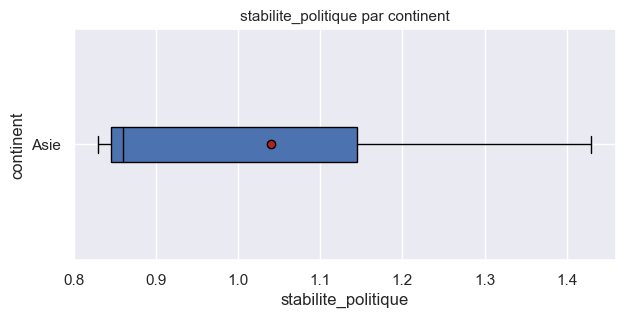

In [139]:
# Définition du dataframe
data = df_complet.loc[(~df_complet['stabilite_politique'].isna())&(df_complet['zone'].str.contains('Chine')==True),:]

# Nombre de pays dans chaque groupe géographique
print("Il y a ",data.shape[0]," pays appartenant à la Chine qui ont une stabilité politique non null")

# Boxplot avec les variables :
X = "continent" # qualitative
Y = "stabilite_politique" # quantitative
l_h=(7,3) # dimensions du graphe
showfliers=False # pas d'affichage des outliers

modalite_boxplot(data,X,Y,l_h,False)

=> Les valeurs manquantes seront remplacées par :
- la moyenne du continent pour Mélanésie et Polynésie (> 3 pays dans le groupe et peu dispersée)
- la moyenne des autres provinces pour la Chine : valeurs les moins dispersées.

In [140]:
# Boucle pour affecter la stabilité moyenne de la zone géographique comme valeur pour les pays hors Chine
stab_missing = df_complet.loc[(df_complet['stabilite_politique'].isna())&(~df_complet['zone'].str.contains('Chine')==True),:]
end = stab_missing.shape[0]

for i in range(0,end):
    c_groupe = stab_missing['c_cont'].iloc[i]
    c_zone = stab_missing['c_zone'].iloc[i]
    df_complet.loc[df_complet['c_zone']==c_zone,'stabilite_politique'] = \
                round(df_complet.loc[df_complet['c_cont']==c_groupe,'stabilite_politique'].mean(),2)

In [141]:
# Affectation de la valeur moyenne des provinces chinoises pour la Chine
stab_chine = round(df_complet.loc[df_complet['zone'].str.contains('Chine')==True,'stabilite_politique'].mean(),2)

df_complet.loc[(df_complet['stabilite_politique'].isna())\
                            &(df_complet['zone'].str.contains('Chine')==True),'stabilite_politique'] = stab_chine

In [142]:
# Pourcentage de valeurs manquantes
na = round(df_complet.isna().mean()*100,2)
na.loc[na>0]

PIB_hab_($)                     0.59
croissance_PIB_(%)              0.59
pop_ss_moyen_alim_saine_(%)    19.41
dtype: float64

#### e. Valeurs manquantes de PIB par habitant

In [143]:
df_complet.loc[df_complet['PIB_hab_($)'].isna(),:]

,c_groupe,groupe,c_zone,zone,code_ISO3,c_cont,continent,c_income,income,produit,...,production_(kt),variation_stock_(kt),pop_2017,Evol_pop_sur_5ans_(%),stabilite_politique,PIB_hab_($),dispo_prot_animale_(g/pers/j),croissance_PIB_(%),emissions_CO2_(kt),pop_ss_moyen_alim_saine_(%)
143,5302,Asie orientale,214,"Chine, Taiwan Province de",TWN,5300,Asie,9010,3_Pays à revenu moyen supérieur,Viande de Volailles,...,652.0,20.0,23674546.0,1.383976,0.86,NaN,42.46,NaN,313835.7726,0.2


=> Exploration des données pour choisir la meilleure option pour remplacer les PIB par hab manquants

income
3_Pays à revenu moyen supérieur    53
Name: zone, dtype: int64


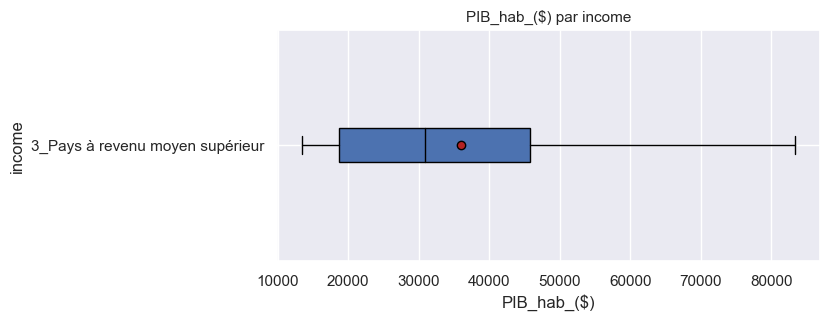

In [144]:
# Définition du dataframe
pays_PIB_missing = df_complet.loc[df_complet['PIB_hab_($)'].isna(),'income'].tolist()
data = df_complet.loc[(~df_complet['PIB_hab_($)'].isna())&(df_complet['income'].isin(pays_PIB_missing)),:]

# Nombre de pays dans chaque groupe géographique
print(data.groupby('income')['zone'].count())

# Boxplot avec les variables :
X = "income" # qualitative
Y = "PIB_hab_($)" # quantitative
l_h=(7,3) # dimensions du graphe
showfliers=False # pas d'affichage des outliers

modalite_boxplot(data,X,Y,l_h,False)

Il y a  3  provinces de la Chine qui ont une 'PIB_hab_($)' non null


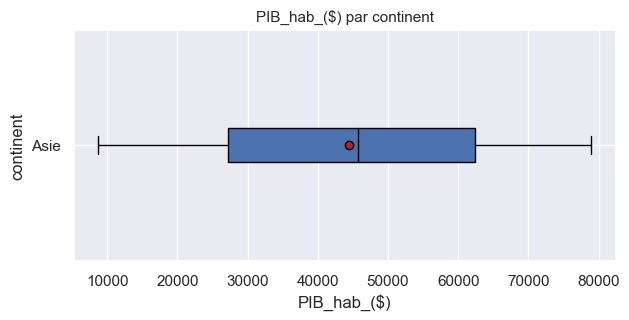

In [145]:
# Définition du dataframe
data = df_complet.loc[(~df_complet['PIB_hab_($)'].isna())&(df_complet['zone'].str.contains('Chine')==True),:]

# Nombre de pays dans chaque groupe géographique
print("Il y a ",data.shape[0]," provinces de la Chine qui ont une 'PIB_hab_($)' non null")

# Boxplot avec les variables :
X = "continent" # qualitative
Y = "PIB_hab_($)" # quantitative
l_h=(7,3) # dimensions du graphe
showfliers=False # pas d'affichage des outliers

modalite_boxplot(data,X,Y,l_h,False)

In [146]:
# Affecter le PIB moyen de la zone de revenus comme valeur
mean_income = round(df_complet.loc[df_complet['c_income']==9010,'PIB_hab_($)'].mean(),1)
df_complet.loc[df_complet['c_zone']==214,'PIB_hab_($)'] = mean_income

In [147]:
# Pourcentage de valeurs manquantes
na = round(df_complet.isna().mean()*100,2)
na.loc[na>0]

croissance_PIB_(%)              0.59
pop_ss_moyen_alim_saine_(%)    19.41
dtype: float64

#### f. Valeurs manquantes de Croissance_PIB

In [148]:
df_complet.loc[df_complet['croissance_PIB_(%)'].isna(),:]

,c_groupe,groupe,c_zone,zone,code_ISO3,c_cont,continent,c_income,income,produit,...,production_(kt),variation_stock_(kt),pop_2017,Evol_pop_sur_5ans_(%),stabilite_politique,PIB_hab_($),dispo_prot_animale_(g/pers/j),croissance_PIB_(%),emissions_CO2_(kt),pop_ss_moyen_alim_saine_(%)
143,5302,Asie orientale,214,"Chine, Taiwan Province de",TWN,5300,Asie,9010,3_Pays à revenu moyen supérieur,Viande de Volailles,...,652.0,20.0,23674546.0,1.383976,0.86,36053.4,42.46,NaN,313835.7726,0.2


Il y a  3  provinces de la Chine qui ont une 'croissance_PIB_(%)' non null


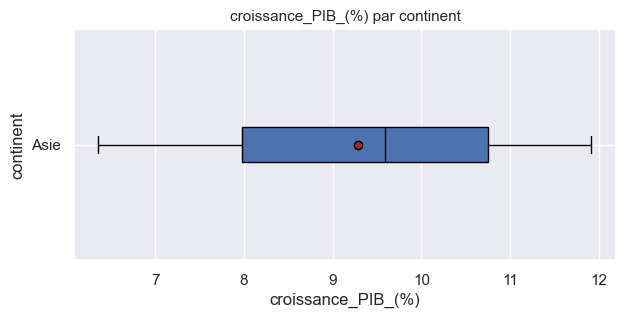

In [149]:
# Définition du dataframe
data = df_complet.loc[(~df_complet['croissance_PIB_(%)'].isna())&(df_complet['zone'].str.contains('Chine')==True),:]

# Nombre de pays dans chaque groupe géographique
print("Il y a ",data.shape[0]," provinces de la Chine qui ont une 'croissance_PIB_(%)' non null")

# Boxplot avec les variables :
X = "continent" # qualitative
Y = "croissance_PIB_(%)" # quantitative
l_h=(7,3) # dimensions du graphe
showfliers=False # pas d'affichage des outliers

modalite_boxplot(data,X,Y,l_h,False)

Il y a  53  pays appartenant au groupe de revenu


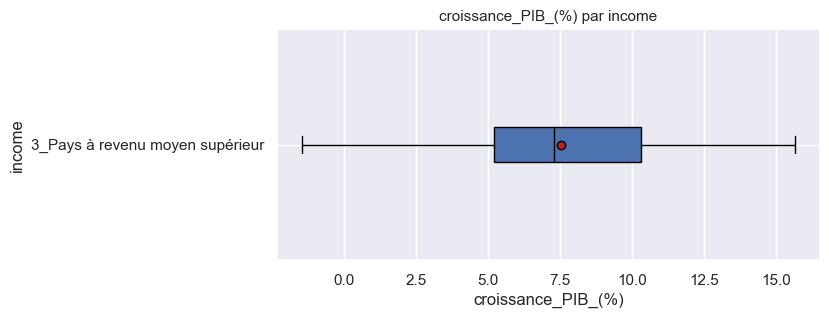

In [150]:
# Définition du dataframe
pays_croissance_missing = df_complet.loc[df_complet['croissance_PIB_(%)'].isna(),'income'].tolist()
data = df_complet.loc[(~df_complet['croissance_PIB_(%)'].isna())&(df_complet['income'].isin(pays_croissance_missing)),:]

# Nombre de pays dans chaque groupe géographique
print("Il y a ",data.shape[0]," pays appartenant au groupe de revenu")

# Boxplot avec les variables :
X = "income" # qualitative
Y = "croissance_PIB_(%)" # quantitative
l_h=(7,3) # dimensions du graphe
showfliers=False # pas d'affichage des outliers

modalite_boxplot(data,X,Y,l_h,False)

In [151]:
# Valeur manquante = imputation de la moyenne de la croissance PIB du groupe de revenus
mean_croissance = round(df_complet.loc[df_complet['c_income']==9010,'croissance_PIB_(%)'].mean(),1)

df_complet.loc[df_complet['c_zone']==214,'croissance_PIB_(%)'] = mean_croissance

In [152]:
# Pourcentage de valeurs manquantes
na = round(df_complet.isna().mean()*100,2)
na.loc[na>0]

pop_ss_moyen_alim_saine_(%)    19.41
dtype: float64

#### g. Valeurs manquantes de % population n'ayant pas les moyens d'avoir une alimentation saine

In [153]:
df_complet.loc[df_complet['pop_ss_moyen_alim_saine_(%)'].isna(),:].shape[0]

33

Beaucoup de valeurs manquantes : un modèle de regression linéaire peut être une solution pour imputer les valeurs manquantes.

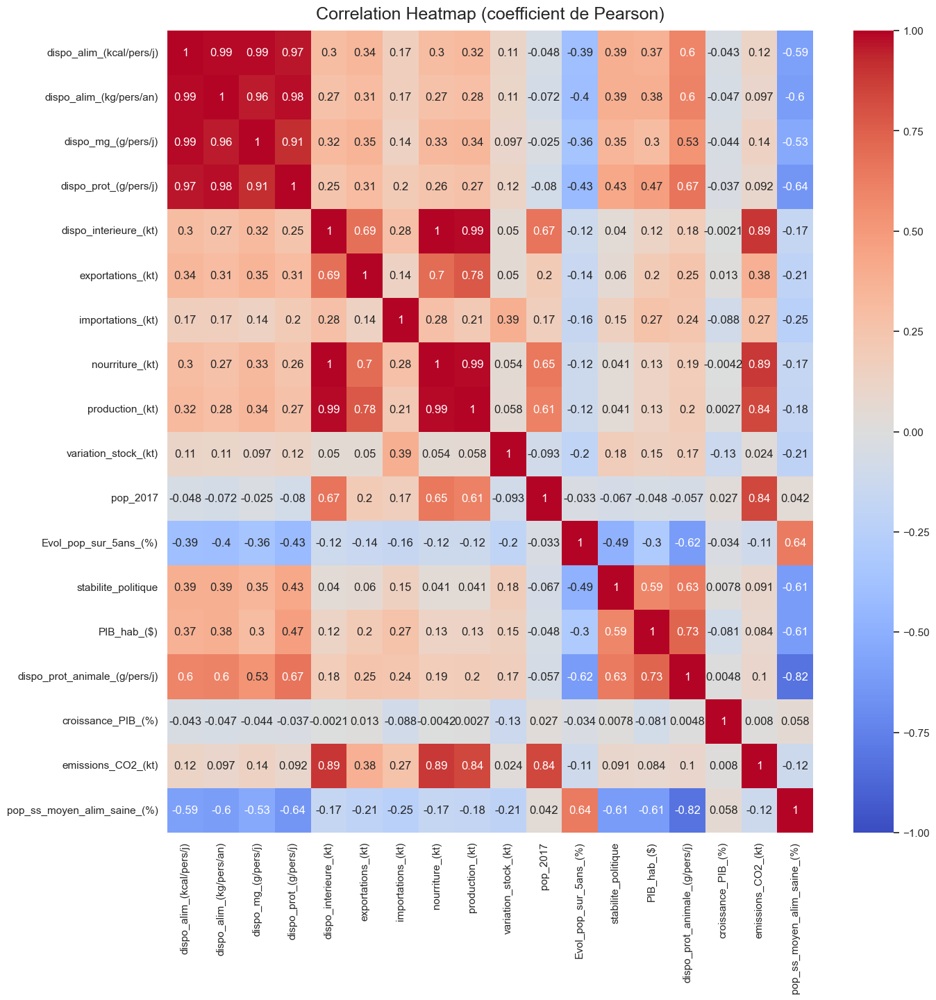

In [154]:
# Calcul du coefficient de corrélation de Pearson et représentation sous forme de heatmap
data_quanti=df_complet.loc[~df_complet['pop_ss_moyen_alim_saine_(%)'].isna(),:].iloc[:,10:]
plt.figure(figsize=(15,15))
heatmap = sns.heatmap(data_quanti.corr(method='pearson'), vmin=-1, vmax=1, annot=True, cmap='coolwarm')
heatmap.set_title('Correlation Heatmap (coefficient de Pearson)', fontdict={'fontsize':18}, pad=12)
plt.show()

Nota : Test de régression réalisé avec dispo_prot_animale_(g/pers/j) :
- r² = 0.6-0.7 avec les pays à très hauts revenus, mais prédiction de valeurs négatives pour les pays à très hauts revenus
- r² = 0.5 sans les pays à très hauts revenus

=> La relation entre PIB par habitant et la part de population ne pouvant s'offrir une nourriture saine est la plus logique et donne de meilleurs résultats à l'évaluation du modèle : c'est celle qui est retenue.

**Modèle de régression linéaire**

Les pays à très haut revenus ont une variablité très faible et un comportement différent d'après le nuage de point.
- Régression linéaire pour les pays à haut revenu : R2 entre 0.2 et 0.1 => modèle non retenu

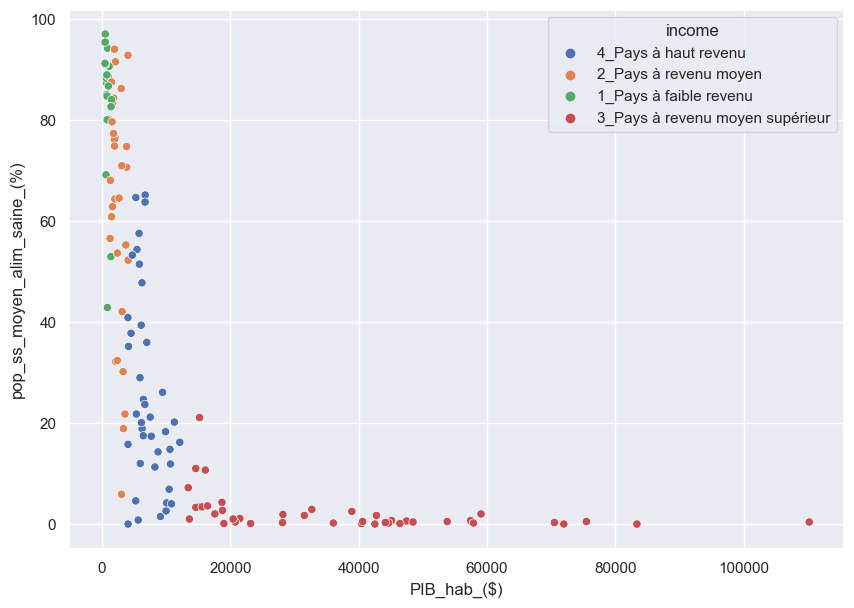

In [155]:
plt.figure(figsize=(10,7))
sns.scatterplot(data=df_complet, x='PIB_hab_($)', y='pop_ss_moyen_alim_saine_(%)',hue='income')
plt.show()

income
1_Pays à faible revenu             23
2_Pays à revenu moyen              32
3_Pays à revenu moyen supérieur    42
4_Pays à haut revenu               40
Name: zone, dtype: int64


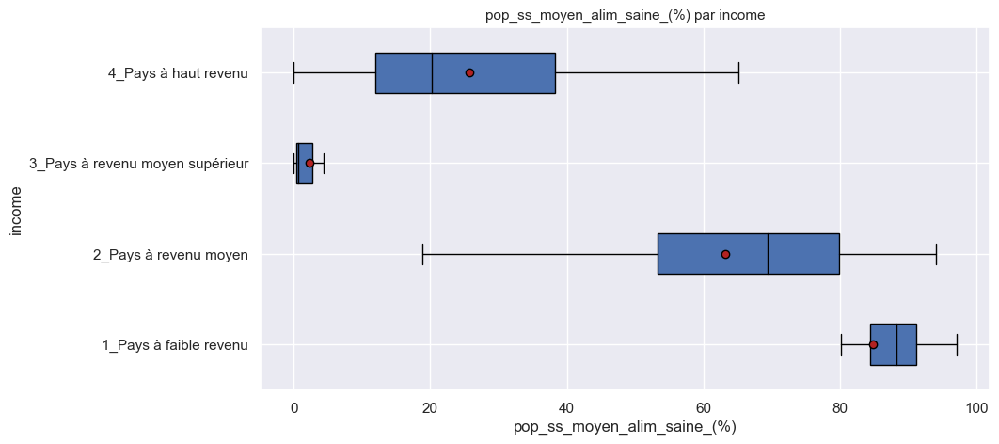

In [156]:
# Définition du dataframe
UAHD_missing = df_complet.loc[df_complet['pop_ss_moyen_alim_saine_(%)'].isna(),'c_zone'].tolist()
data = df_complet.loc[~df_complet['c_zone'].isin(UAHD_missing),:]

# Nombre de pays dans chaque groupe géographique
# Nombre de pays dans chaque groupe géographique
print(data.groupby('income')['zone'].count())

# Boxplot avec les variables :
X = "income" # qualitative
Y = "pop_ss_moyen_alim_saine_(%)" # quantitative
l_h=(10,5) # dimensions du graphe
showfliers=False # pas d'affichage des outliers

modalite_boxplot(data,X,Y,l_h,False)

In [157]:
# Importation des librairies
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

In [158]:
# Modèle pour les pays hors high-income economies
X = df_complet.loc[(~df_complet['c_zone'].isin(UAHD_missing))\
                   &(df_complet['c_income']!=9010),'PIB_hab_($)'].values.reshape((-1, 1))
y = df_complet.loc[(~df_complet['c_zone'].isin(UAHD_missing))\
                   &(df_complet['c_income']!=9010),'pop_ss_moyen_alim_saine_(%)'].values

# Création de l'échantillon d'entraînement et de l'échantillon de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33,random_state=7)

reg1 = LinearRegression()

reg1.fit(X_train,y_train) 

y_train_predict = reg1.predict(X_train) 

r_squared = r2_score(y_train,y_train_predict)
print("Echantillon d'entraînement R2 =",r_squared)

# Evaluation du modèle
y_test_predict = reg1.predict(X_test) 

r_squared = r2_score(y_test,y_test_predict)
print("Echantillon de test R2 =",r_squared)


Echantillon d'entraînement R2 = 0.6207161652150794
Echantillon de test R2 = 0.5812151508880962


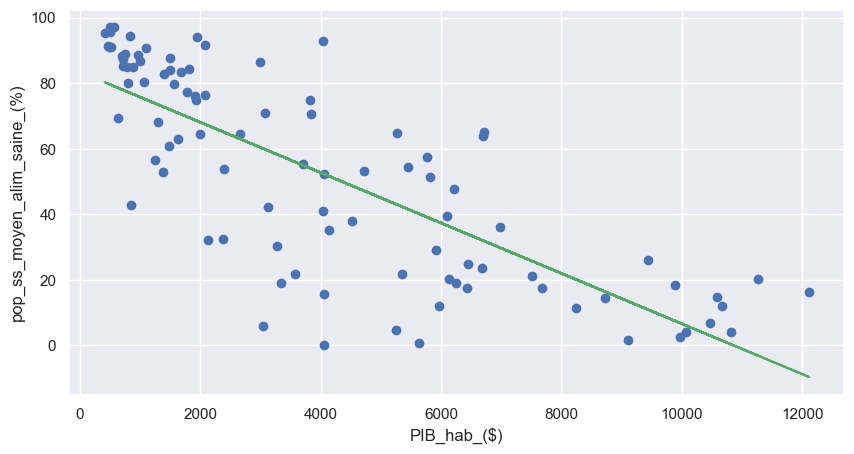

In [159]:
y_predict = reg1.predict(X) 

# Affichage du nuage de point et du modèle de régression linaire
plt.figure(figsize=(10,5))
plt.scatter(X, y)
plt.plot(X, y_predict, color='g')
plt.xlabel("PIB_hab_($)")
plt.ylabel("pop_ss_moyen_alim_saine_(%)")
plt.show()

In [160]:
# Utilisation du modèle reg1 pour compléter les valeurs manquantes des pays hors High-income economy
X = df_complet.loc[(df_complet['c_zone'].isin(UAHD_missing))\
                   &(df_complet['c_income']!=9010),'PIB_hab_($)'].values.reshape((-1, 1))

df_complet.loc[(df_complet['c_zone'].isin(UAHD_missing))\
               &(df_complet['c_income']!=9010),'pop_ss_moyen_alim_saine_(%)'] = reg1.predict(X)

In [161]:
# Pays High-income economy : imputation de la moyenne des pays de la catégorie
UAHD_high_income_mean = round(df_complet.loc[df_complet['c_income']==9010,'pop_ss_moyen_alim_saine_(%)'].mean(),2)
df_complet.loc[(df_complet['c_zone'].isin(UAHD_missing))&(df_complet['c_income']==9010),'pop_ss_moyen_alim_saine_(%)'] = \
    UAHD_high_income_mean

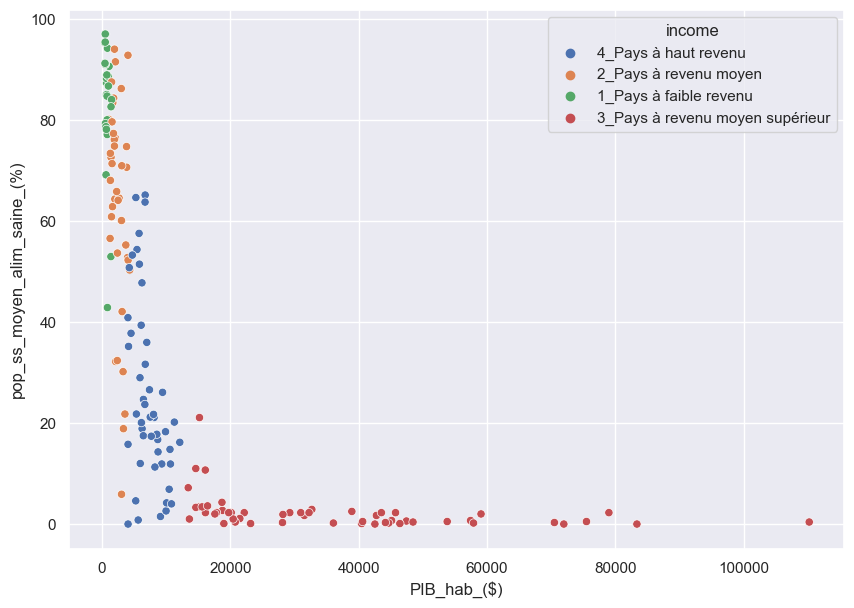

In [162]:
plt.figure(figsize=(10,7))
sns.scatterplot(data=df_complet, x='PIB_hab_($)', y='pop_ss_moyen_alim_saine_(%)',hue='income')
plt.show()

In [163]:
# Pourcentage de valeurs manquantes
na = round(df_complet.isna().mean()*100,2)
na.loc[na>0]

Series([], dtype: float64)

### 2.2. Doublons<a class="anchor" id="2_2_2">

Pas de doublon

In [164]:
# Doublons sur les codes pays FAO
df_complet.loc[df_complet[['c_zone']].duplicated(keep=False),:]

,c_groupe,groupe,c_zone,zone,code_ISO3,c_cont,continent,c_income,income,produit,...,production_(kt),variation_stock_(kt),pop_2017,Evol_pop_sur_5ans_(%),stabilite_politique,PIB_hab_($),dispo_prot_animale_(g/pers/j),croissance_PIB_(%),emissions_CO2_(kt),pop_ss_moyen_alim_saine_(%)


### 2.3. Ajout de variables pour l'analyse<a class="anchor" id="2_2_3">
    

Afin de caractériser au mieux les pays à partir des bilans alimentaires, différents taux sont calculés et ajoutés aux variables :

**TAS**  =  Taux d'autosuffisance du pays, capacité apparente du pays à assurer ses besoins à partir de sa production


$$ TAS = \frac{Production}{Disponibilité~intérieure}\times 100$$ 
- TAS = 0% pas de production
- TAS > 100%, autosuffisance du pays et exportations de l'exédent
 
 
**TDI** = Taux de dépendance aux importations du pays, part des importations dans la consommation intérieure


$$ TDI = \frac{Importations}{Disponibilité~intérieure}\times 100$$ 
- TDI = 0% : pas d'importations
- TDI > 100% : import / export
     
     
**TDC** = taux de dépendance au commerce, 
$$ TDC = \frac{Production-Importations}{Disponibilité~intérieure}\times 100$$ 
- TDC = -100% : TAS = 0%, non existence de la production et utilisations couvertes par les importations seulement
- TDC < - 100% : import / export
- TDC > 100% : export
    
    
**TCC** = Taux de couverture de la consommation par la production nationale, part de la consommation intérieure couverte de fait par la production nationale, le reste de la production étant exporté.


$$ TCC = \frac{Production-Exportations}{Disponibilité~intérieure}\times 100$$ 
- TCC < 0 % : import / export
- TCC > 100 % : pertes, variations de stocks
     
     
**TEX** = Taux d’exportation, la part de la production et des importations qui est exportée, montrant la puissance exportatrice du pays mais aussi la dépendance de la production nationale aux achats des pays importateurs


$$ TEX = \frac{Exportations}{Production + Importations}\times 100$$ 
- TEX = 0 % : pas d'exportations
- TEX = 100% : dispo_intérieure = 0 et variations de stocks = 0, tout est exporté

**Pertes_percent** = Part de la disponibilité intérieure représentée par la variation de stock  


$$ Pertes = \frac{Variations~de~stock}{Disponibilité~intérieure}\times 100$$ 

**Part_volaille_dispo_prot** = Part de la viande de volaille dans la disponibilité totale en protéine animale, c'est-à-dire importance de la viande de volaille dans les apports en protéine

$$ Pertes = \frac{Disponibilité~en~protéine~liée~à~la~viande~de~volaille}{Disponibilité~totale~en~protéine~d'origine~animale}\times 100$$ 

Pour les émissions de CO2, la variable suivante permet de prendre en compte la taille de la population :

**Emissions_CO2_hab** = Emissions de CO2 par habitant

$$ Emission~CO2/hab = \frac{Emissions~CO2~(kt)}{Population}\times 100$$ 

In [165]:
# Ajout de variables pour l'analyse
df_complet = df_complet.assign(
    TAS = round(df_complet['production_(kt)']/df_complet['dispo_interieure_(kt)']*100,2),
    TDI = round(df_complet['importations_(kt)']/df_complet['dispo_interieure_(kt)']*100,2),
    TDC = round((df_complet['production_(kt)'] - df_complet['importations_(kt)'])/df_complet['dispo_interieure_(kt)']*100,2),
    TCC = round((df_complet['production_(kt)']- df_complet['exportations_(kt)'])/df_complet['dispo_interieure_(kt)']*100,2),
    TEX = round(df_complet['exportations_(kt)']/(df_complet['production_(kt)']+df_complet['importations_(kt)'])*100,2),
    pertes_percent = round(df_complet['variation_stock_(kt)']/df_complet['dispo_interieure_(kt)']*100,2),
    part_volaille_dispo_prot = round(df_complet['dispo_prot_(g/pers/j)']/df_complet['dispo_prot_animale_(g/pers/j)']*100,2),
    emission_CO2_hab = round(df_complet['emissions_CO2_(kt)']*1000000/df_complet['pop_2017'],2)
    )

In [166]:
# Sélection des colonnes 
df_complet_ok = df_complet[['c_groupe', 
                       'groupe', 
                       'c_zone',
                       'code_ISO3',
                       'zone', 
                       'c_cont', 
                       'continent',
                       'c_income', 
                       'income', 
                       'dispo_interieure_(kt)',     
                       'production_(kt)',
                       'importations_(kt)',
                       'exportations_(kt)',
                       'variation_stock_(kt)',
                       'TAS', 
                       'TDI',
                       'TDC',
                       'TCC',
                       'TEX',                    
                       'pertes_percent',
                       'dispo_alim_(kg/pers/an)',
                       'dispo_alim_(kcal/pers/j)',
                       'dispo_mg_(g/pers/j)',
                       'dispo_prot_(g/pers/j)',
                       'part_volaille_dispo_prot',
                       'pop_2017', 
                       'Evol_pop_sur_5ans_(%)',
                       'stabilite_politique', 
                       'PIB_hab_($)',
                       'pop_ss_moyen_alim_saine_(%)',
                       'croissance_PIB_(%)', 
                       'emissions_CO2_(kt)',
                       'emission_CO2_hab'
                        ]]

### 2.4. Valeurs aberrantes<a class="anchor" id="2_2_4">

L'objectif est d'identifier les éventuels valeurs aberrantes et de les traiter.

In [167]:
# Données statistiques 
df_complet_ok.iloc[:,9:].describe(include='all')

,dispo_interieure_(kt),production_(kt),importations_(kt),exportations_(kt),variation_stock_(kt),TAS,TDI,TDC,TCC,TEX,...,dispo_prot_(g/pers/j),part_volaille_dispo_prot,pop_2017,Evol_pop_sur_5ans_(%),stabilite_politique,PIB_hab_($),pop_ss_moyen_alim_saine_(%),croissance_PIB_(%),emissions_CO2_(kt),emission_CO2_hab
count,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,...,170.000000,170.000000,1.700000e+02,170.000000,170.000000,170.000000,170.000000,170.000000,1.700000e+02,170.000000
mean,687.594118,716.658824,89.529412,105.000000,13.588235,77.103647,45.803765,31.299706,62.210941,7.087294,...,7.180235,18.551529,4.311688e+07,6.207292,-0.048412,14232.521421,36.454913,7.802562,2.342821e+05,6262.901353
std,2187.184747,2487.847959,186.669983,460.622013,75.148893,49.466209,51.850276,86.781261,48.037555,14.364670,...,5.607475,11.011906,1.539395e+08,5.601534,0.907089,19342.350474,34.086773,6.591143,9.606834e+05,8352.814599
min,2.000000,0.000000,0.000000,0.000000,-119.000000,0.000000,0.000000,-315.360000,-228.210000,0.000000,...,0.040000,0.680000,5.204500e+04,-7.562140,-2.940000,414.740323,0.000000,-27.795932,-7.282727e+03,-250.080000
25%,30.500000,13.000000,3.000000,0.000000,0.000000,36.875000,4.230000,-43.062500,26.377500,0.000000,...,2.237500,10.032500,2.855103e+06,2.170203,-0.627500,1956.062189,2.260000,5.274030,7.764436e+03,1549.900000
50%,100.000000,68.000000,16.000000,1.000000,0.000000,87.365000,24.750000,63.185000,81.220000,0.095000,...,6.585000,17.615000,9.757833e+06,5.491577,0.030000,6118.822152,22.750000,7.496697,3.064506e+04,3985.575000
75%,368.250000,384.250000,81.250000,12.000000,7.000000,100.000000,80.637500,97.510000,97.915000,8.607500,...,10.415000,26.415000,2.971320e+07,10.349028,0.697500,17748.061002,70.325000,10.302271,1.135416e+05,7452.467500
max,18266.000000,21914.000000,1069.000000,4223.000000,859.000000,304.610000,323.930000,198.620000,132.650000,83.020000,...,27.870000,51.770000,1.421022e+09,25.030369,1.600000,110203.008202,97.100000,36.133401,1.076949e+07,71951.410000


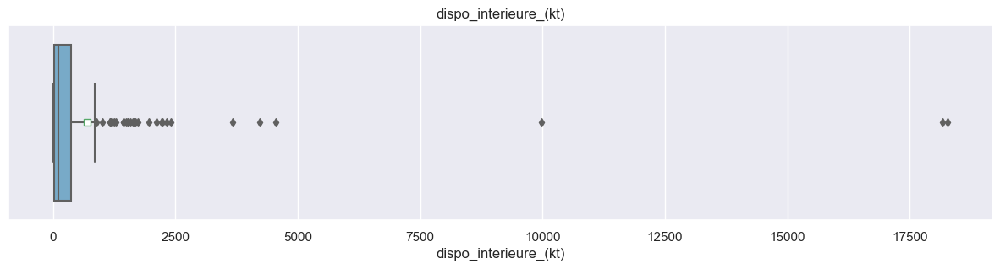


Nombre d'outliers détectés => 3
                      zone  dispo_interieure_(kt)
74                  Brésil                 9982.0
142    Chine, continentale                18161.0
91   États-Unis d'Amérique                18266.0


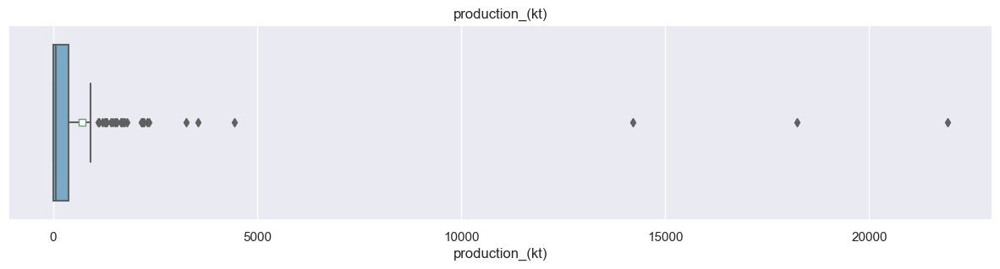


Nombre d'outliers détectés => 3
                      zone  production_(kt)
74                  Brésil          14201.0
142    Chine, continentale          18236.0
91   États-Unis d'Amérique          21914.0


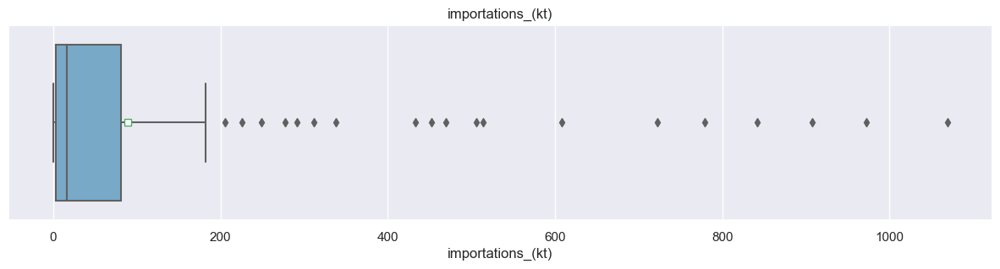


Nombre d'outliers détectés => 6
                                                  zone  importations_(kt)
119                                    Arabie saoudite              722.0
243  Royaume-Uni de Grande-Bretagne et d'Irlande du...              779.0
204                                          Allemagne              842.0
140                           Chine - RAS de Hong-Kong              907.0
68                                             Mexique              972.0
144                                              Japon             1069.0


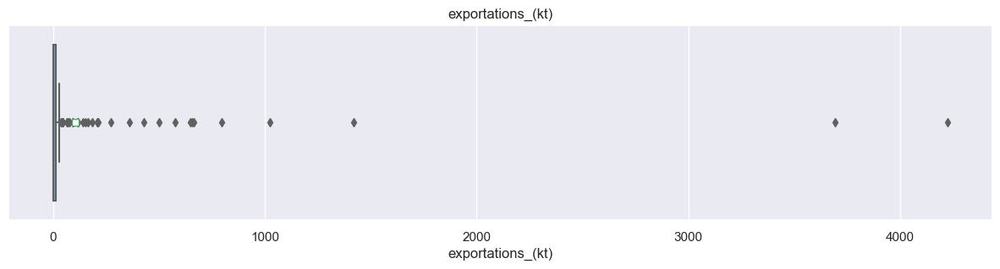


Nombre d'outliers détectés => 2
                     zone  exportations_(kt)
91  États-Unis d'Amérique             3692.0
74                 Brésil             4223.0


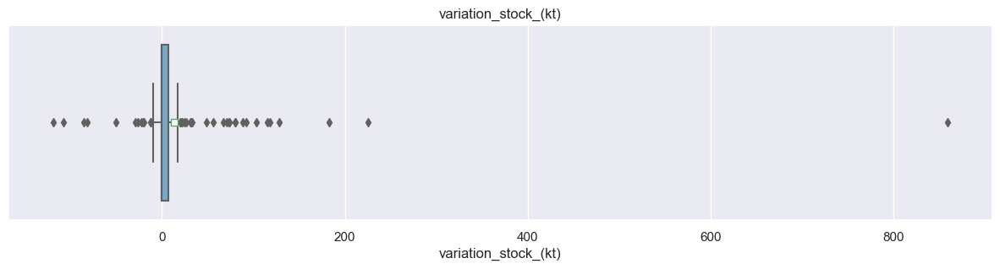


Nombre d'outliers détectés => 1
      zone  variation_stock_(kt)
144  Japon                 859.0


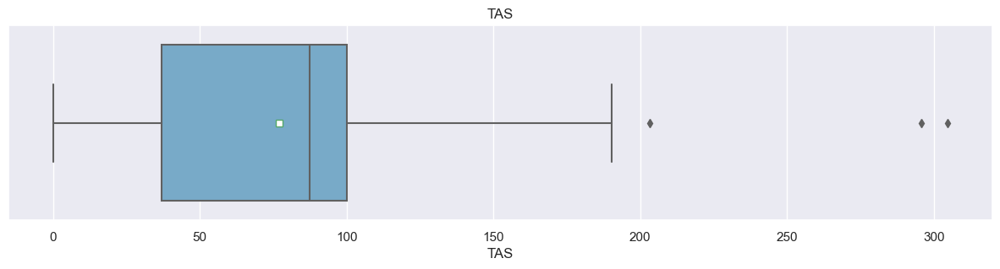


Nombre d'outliers détectés => 2
         zone     TAS
213  Pays-Bas  295.70
206  Belgique  304.61


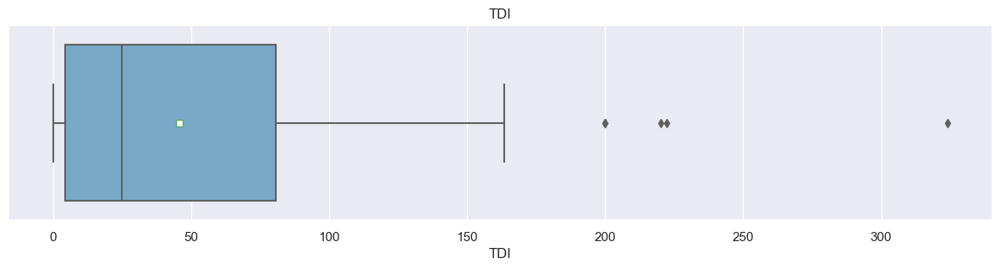


Nombre d'outliers détectés => 3
                         zone     TDI
108               Timor-Leste  220.00
206                  Belgique  222.37
140  Chine - RAS de Hong-Kong  323.93


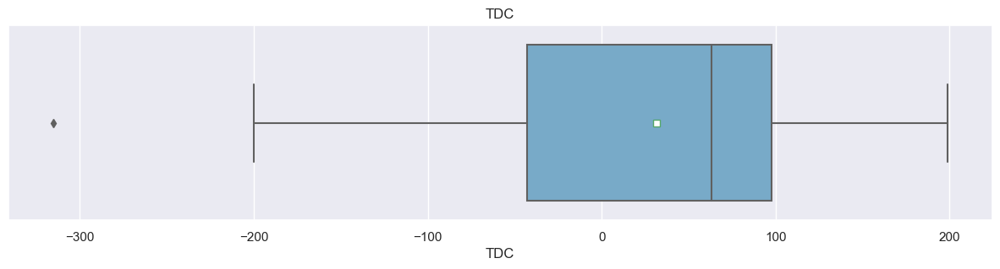


Nombre d'outliers détectés => 1
                         zone     TDC
140  Chine - RAS de Hong-Kong -315.36


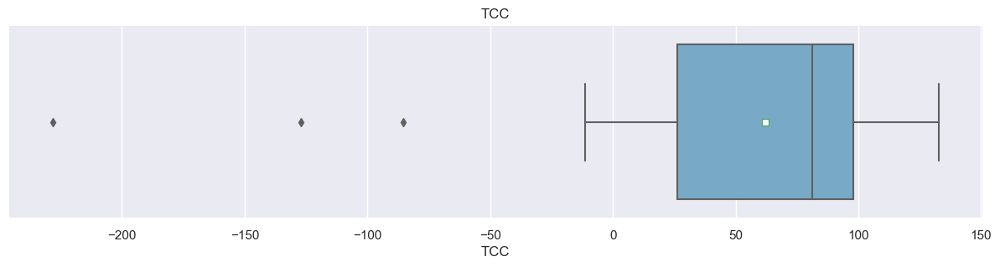


Nombre d'outliers détectés => 3
                         zone     TCC
140  Chine - RAS de Hong-Kong -228.21
206                  Belgique -126.97
213                  Pays-Bas  -85.48


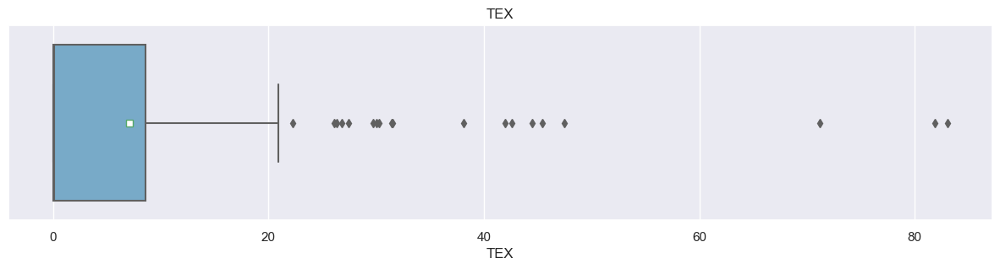


Nombre d'outliers détectés => 3
                         zone    TEX
140  Chine - RAS de Hong-Kong  71.21
206                  Belgique  81.90
213                  Pays-Bas  83.02


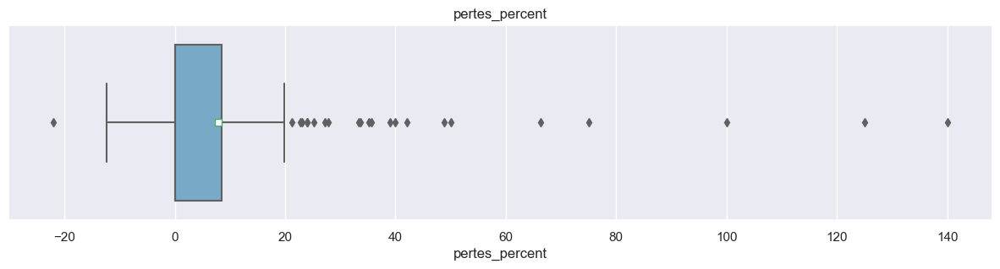


Nombre d'outliers détectés => 4
              zone  pertes_percent
22   Guinée-Bissau            75.0
246   Îles Salomon           100.0
19          Gambie           125.0
108    Timor-Leste           140.0


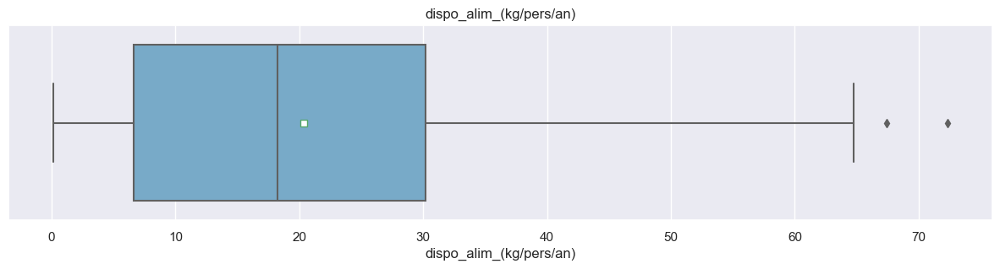


Nombre d'outliers détectés => 1
                                zone  dispo_alim_(kg/pers/an)
181  Saint-Vincent-et-les Grenadines                    72.31


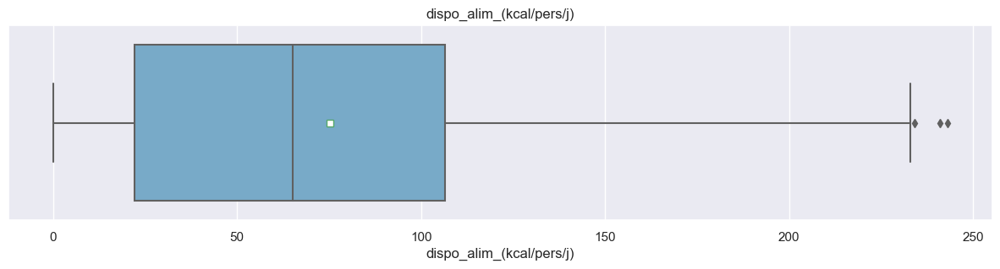


Nombre d'outliers détectés => 0
Empty DataFrame
Columns: [zone, dispo_alim_(kcal/pers/j)]
Index: []


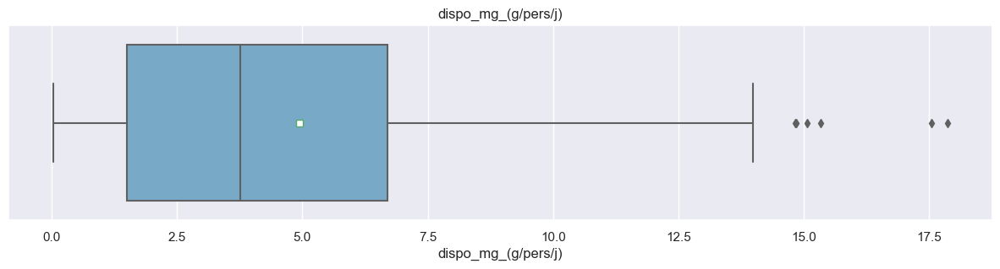


Nombre d'outliers détectés => 2
                   zone  dispo_mg_(g/pers/j)
155  Antigua-et-Barbuda                17.55
178        Sainte-Lucie                17.86


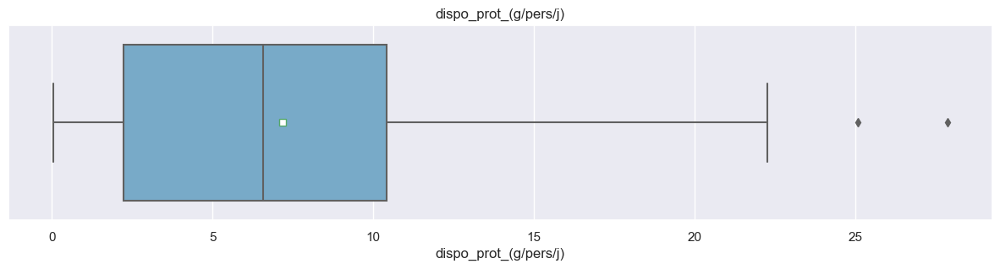


Nombre d'outliers détectés => 2
                                zone  dispo_prot_(g/pers/j)
181  Saint-Vincent-et-les Grenadines                  25.10
127                           Israël                  27.87


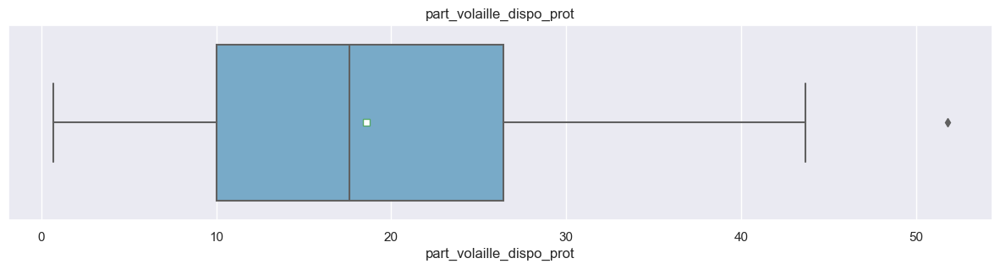


Nombre d'outliers détectés => 1
                                zone  part_volaille_dispo_prot
181  Saint-Vincent-et-les Grenadines                     51.77


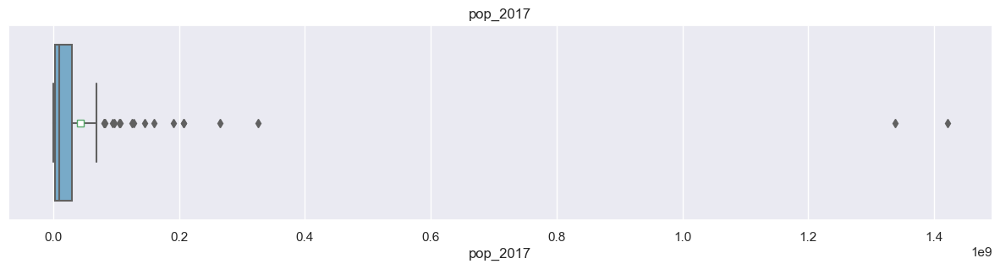


Nombre d'outliers détectés => 2
                    zone      pop_2017
113                 Inde  1.338677e+09
142  Chine, continentale  1.421022e+09


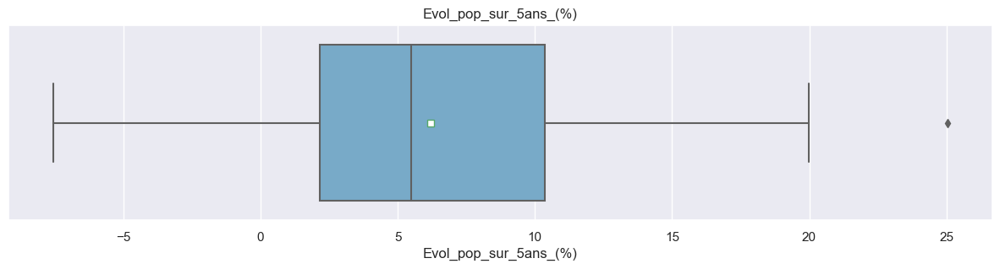


Nombre d'outliers détectés => 1
     zone  Evol_pop_sur_5ans_(%)
131  Oman              25.030369


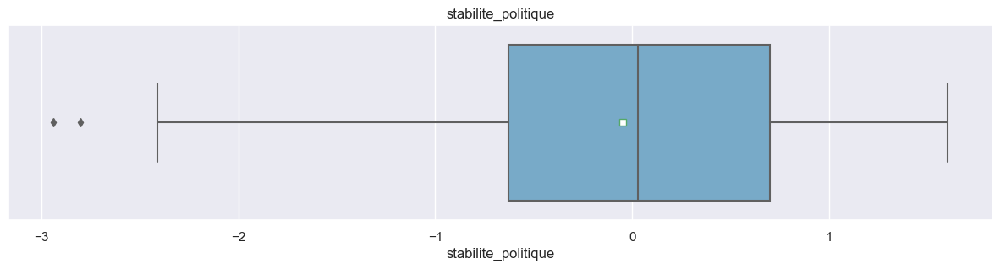


Nombre d'outliers détectés => 2
            zone  stabilite_politique
136        Yémen                -2.94
110  Afghanistan                -2.80


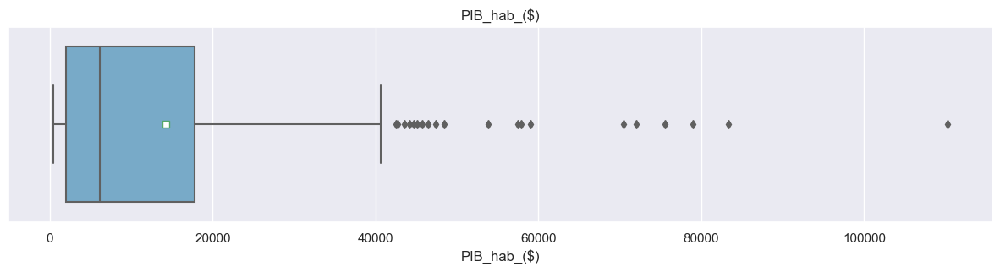


Nombre d'outliers détectés => 4
                     zone    PIB_hab_($)
242               Norvège   75490.688450
141  Chine - RAS de Macao   78985.632288
214                Suisse   83353.597572
211            Luxembourg  110203.008202


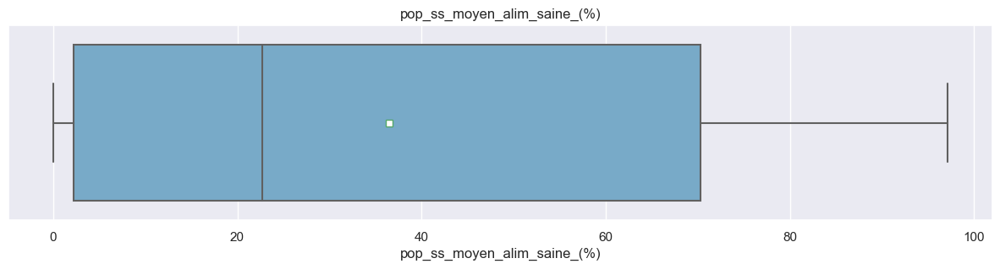


Nombre d'outliers détectés => 0
Empty DataFrame
Columns: [zone, pop_ss_moyen_alim_saine_(%)]
Index: []


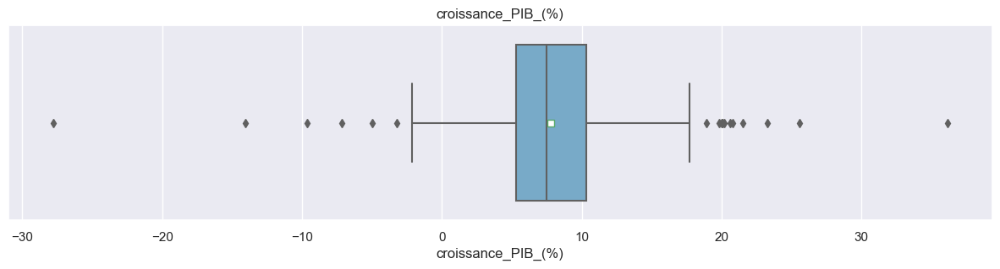


Nombre d'outliers détectés => 3
                                      zone  croissance_PIB_(%)
56                                  Égypte          -27.795932
87  Venezuela (République bolivarienne du)          -14.069328
60                                  Soudan           36.133401


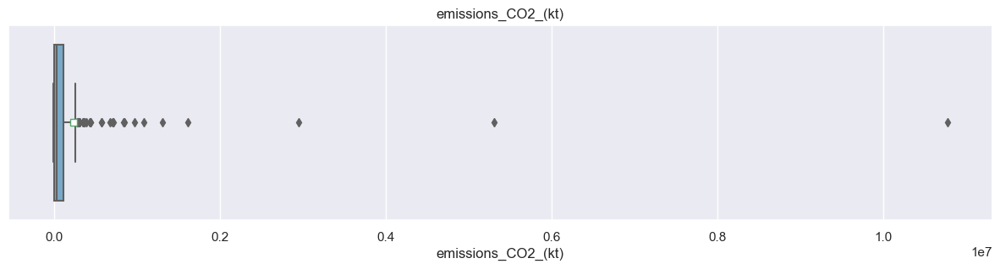


Nombre d'outliers détectés => 2
                      zone  emissions_CO2_(kt)
91   États-Unis d'Amérique        5.305304e+06
142    Chine, continentale        1.076949e+07


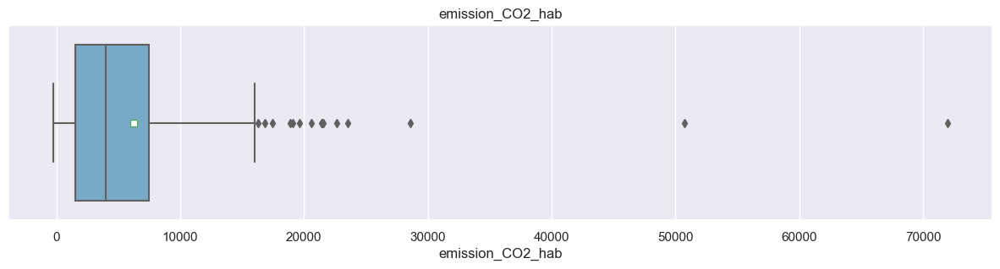


Nombre d'outliers détectés => 2
                  zone  emission_CO2_hab
183  Trinité-et-Tobago          50710.04
246       Îles Salomon          71951.41


In [168]:
# Boxplots et outliers pour les différentes colonnes du df 
data=df_complet_ok
column = data.columns.tolist()[9:]


for col in column:
    plt.figure(figsize=(15,3))
    sns.boxplot(data=data, x=col, 
                orient='h', 
                showmeans=True, 
                palette="Blues", 
                meanprops={"marker":"s","markerfacecolor":"white"})
    plt.title(col)
    plt.show()
      
    #Application de la fonction à la série subset
    subset = data[col]
    outliers = detectOutlier(subset,3)
    df=data.loc[data[col].isin(outliers),['zone',col]].sort_values(col)
    #affichage des outliers détectés
    print()
    print("Nombre d'outliers détectés => " + str(len(outliers)))
    print(df)

### <font color='red'>Principaux outliers : Chine continentale, Inde, Brésil, Etats-Unis, Belgique, Pays-bas, Hong-Kong</a></font>
* Population : Chine contnentale, Inde
* Production, disponibilité intérieure : Chine continentale, Brésil, Etats-Unis
* Exportations : Brésil, Etats-Unis
* Capacité d'exportations : Belgique, Pays-bas, Hong-Kong
* Taux d'autosuffisance : Belgique, Pays-bas
* Taux de dépendance aux importations : Hong-kong,  Belgique

# <font color='blue'>Partie 3 - Analyse exploratoire (hors ACP)<a class="anchor" id="partie3"></a></font>

## <font color='green'>1. Localisation des pays retenus pour l'étude<a class="anchor" id="3_1"></a></font>

Tous les continents sont réprésentés

In [169]:
# Représentation géographique des pays
fig = px.choropleth(df_complet_ok, locations="code_ISO3",
                    color="continent", 
                    hover_name="zone")
fig.show()

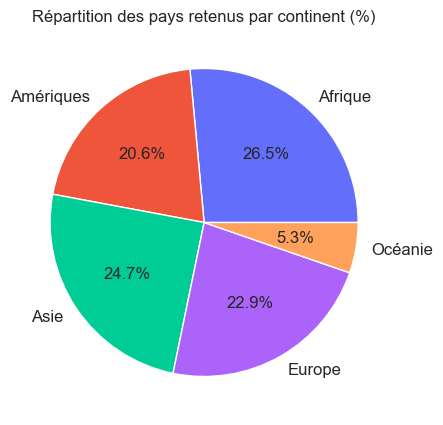

In [170]:
# Répartition des pays par continent (%)
data = df_complet_ok.groupby('continent')['zone'].count().reset_index()

plt.figure(figsize=(10,5))
plt.pie(x=data['zone'],                                   
        colors = px.colors.qualitative.Plotly,
        labels = data['continent'],
        autopct='%.1f%%',
        textprops={'fontsize': 12})
plt.title("Répartition des pays retenus par continent (%)")                                                                                     
plt.show()

## <font color='green'>2. Analyse univariée<a class="anchor" id="3_2"></a></font> 


* Variance 
   * très grandes variances pour les variables : 'dispo_interieure_(kt)', 'production_(kt)', 'importations_(kt)', 'exportations_(kt)', 'variation_stock_(kt)', 'pop_2017', 'PIB_hab_($)', 'emissions_CO2_(kt)'
    
* Distribution : histogramme et densité
   * TAS : 
       * il y a moins de 50 pays qui ont un taux d'autosuffisance inférieur à 50%, plus de 25% des pays sont autosuffisants. 
       * Au moins 4 pics sont observés sur la distribution
    * TDI : 
        * moins de 30 pays sont totalement dépendants des importations
        * Au moins 4 pics sont observés sur la distribution
    * Part de la volaille dans les apport en protéine animale
        * pour 75% des pays la volaille représente moins de 25% des apports en protéine
    * Stabilité politique :
        * 50% de pays ont une stabilité politique > 0
    * Part de la population n'ayant pas les moyens de s'offrir une alimentation saine
        * 50% des pays ont moins de 20% de la population n'ayant pas les moyens de s'offrir une alimentation saine
    * PIB par hab 
        * 75% des pays ont un PIB par habitant inférieur à 20 000 $
        
* Inégalité de production, importations et exportations (Courbe de Lorenz)
    * 5% des pays produisent 60% de la volaille 
    * 20% des pays représentent 80% des importations en volume
    * 5% des pays représentent 80% des exportations en volume

In [171]:
import scipy.stats as st

In [172]:
# Data frame contenant les variables quantitatives
column = df_complet_ok.columns.tolist()[9:]
data_quanti=df_complet_ok[column]


--------------------
Variable : dispo_interieure_(kt)
variance =4755637.25


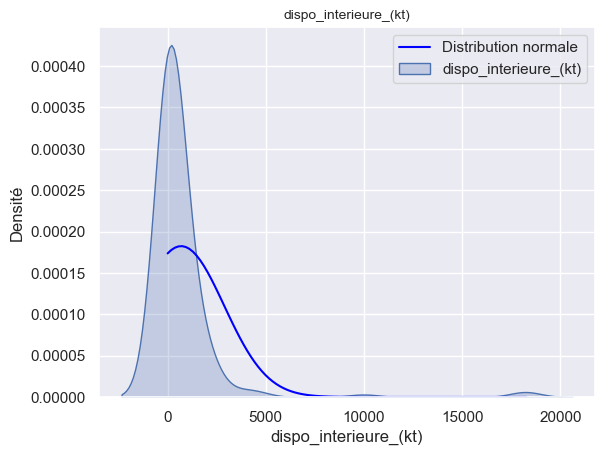

p =  9.233655923683224e-56
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : production_(kt)
variance =6152979.31


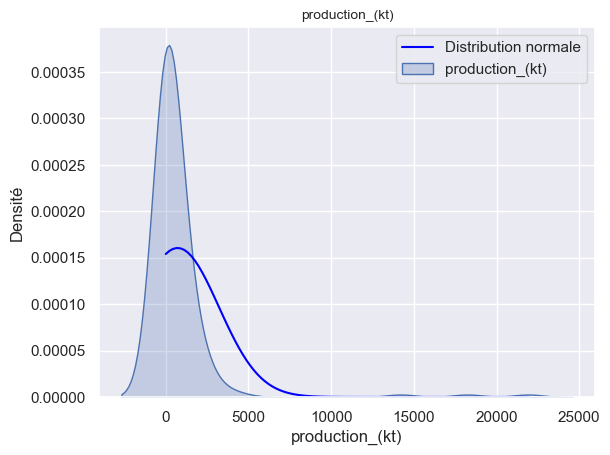

p =  4.109782174418341e-56
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : importations_(kt)
variance =34640.71


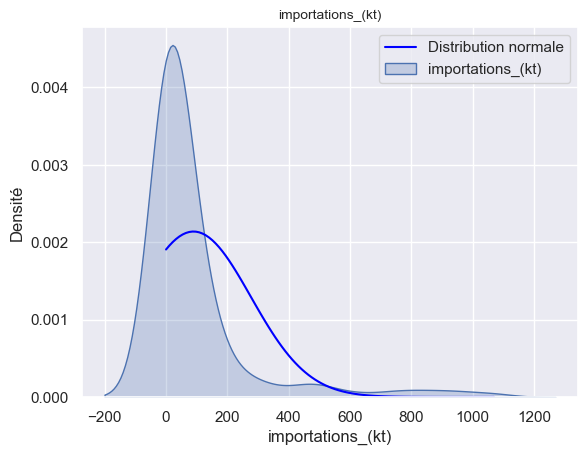

p =  2.0512976088995065e-31
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : exportations_(kt)
variance =210924.56


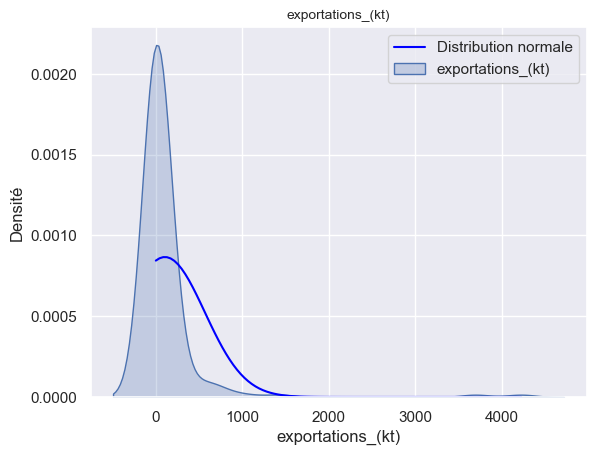

p =  3.2653031846572764e-59
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : variation_stock_(kt)
variance =5614.14


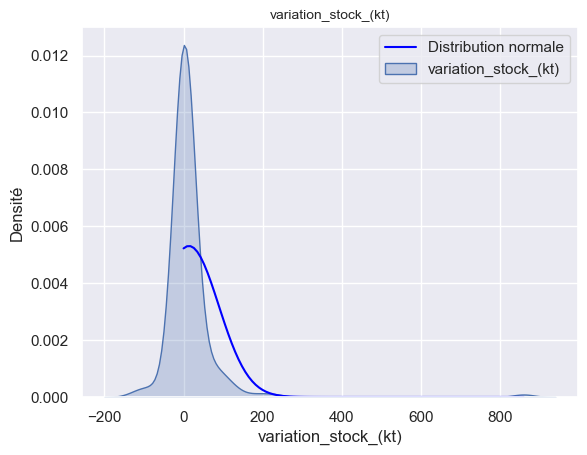

p =  1.856742491097266e-66
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : TAS
variance =2432.51


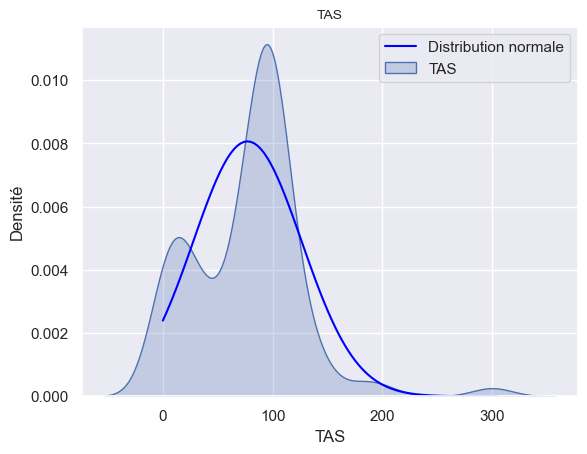

p =  3.617144685799198e-09
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : TDI
variance =2672.64


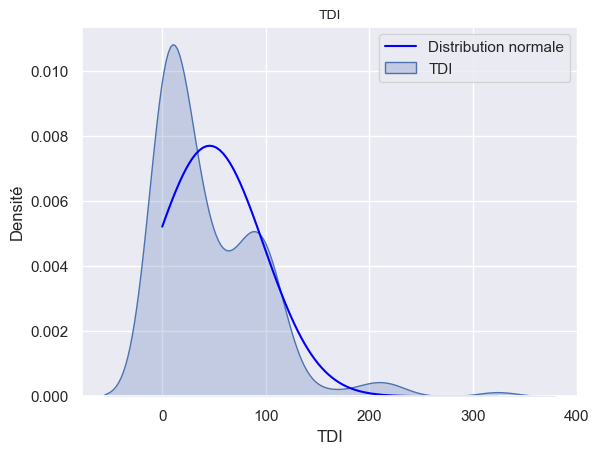

p =  1.2966147322422888e-17
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : TDC
variance =7486.69


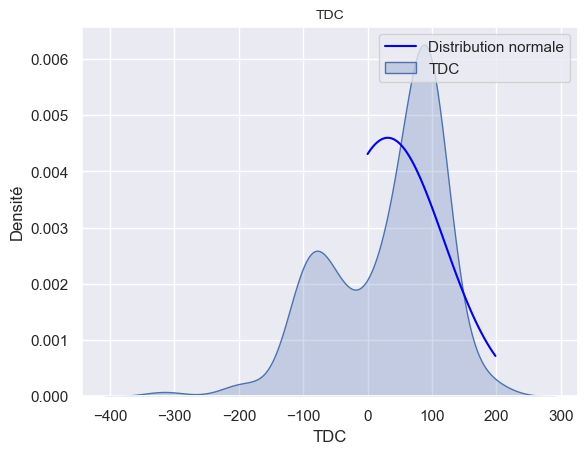

p =  1.7003252210861194e-05
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : TCC
variance =2294.03


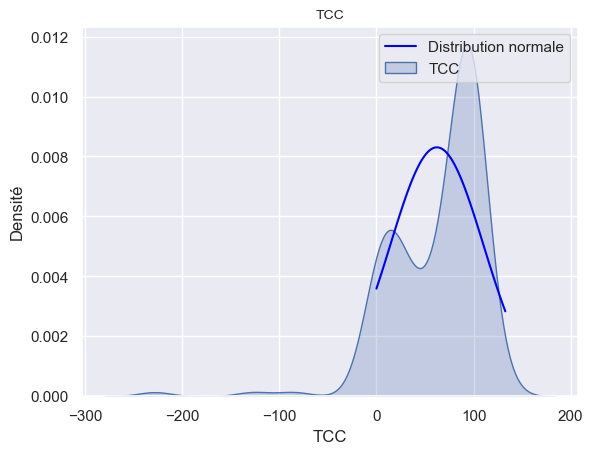

p =  8.7520087127297e-21
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : TEX
variance =205.13


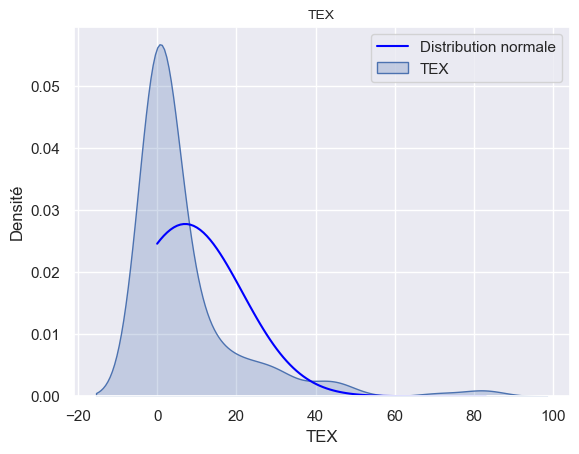

p =  4.220183463992892e-29
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : pertes_percent
variance =411.78


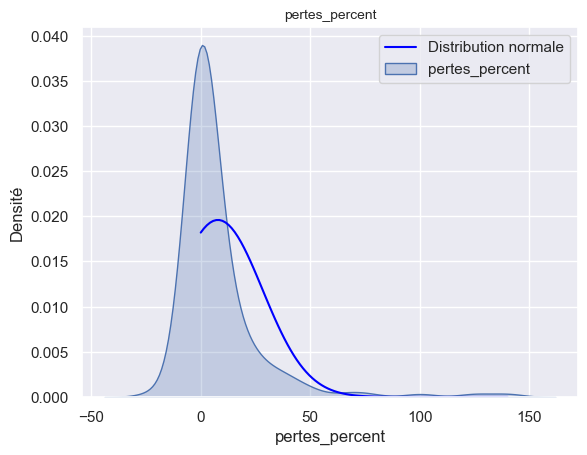

p =  2.7904300898016166e-37
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : dispo_alim_(kg/pers/an)
variance =250.53


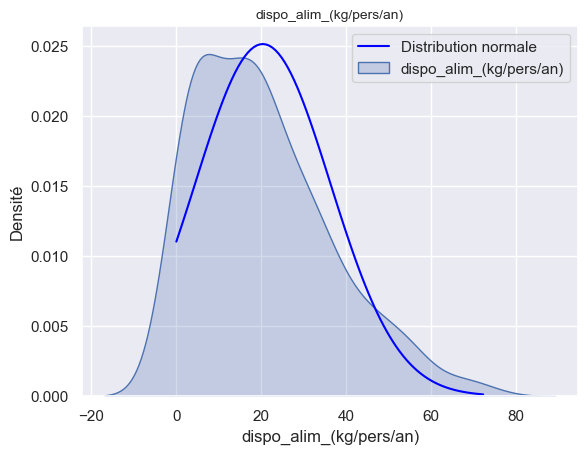

p =  6.717315790007083e-05
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : dispo_alim_(kcal/pers/j)
variance =3655.83


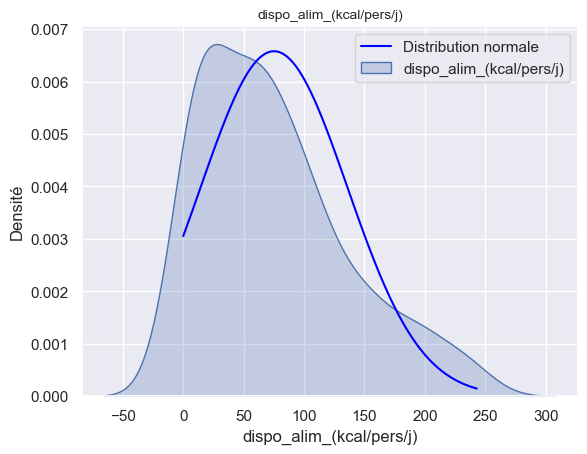

p =  9.875606425445321e-05
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : dispo_mg_(g/pers/j)
variance =17.52


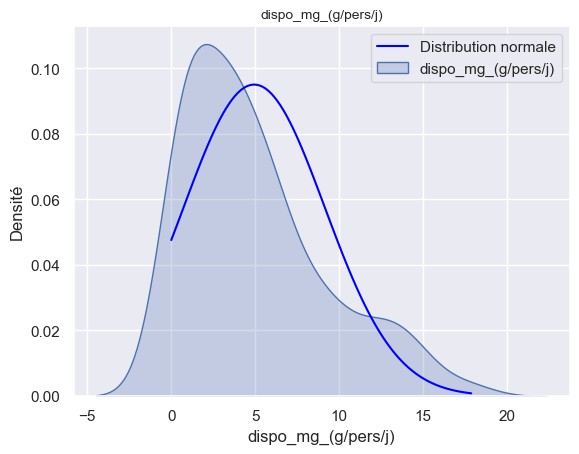

p =  5.992966731469757e-06
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : dispo_prot_(g/pers/j)
variance =31.26


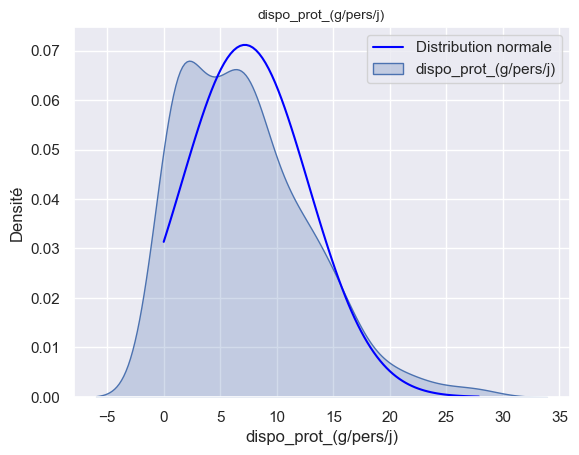

p =  1.2368710964408063e-05
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : part_volaille_dispo_prot
variance =120.55


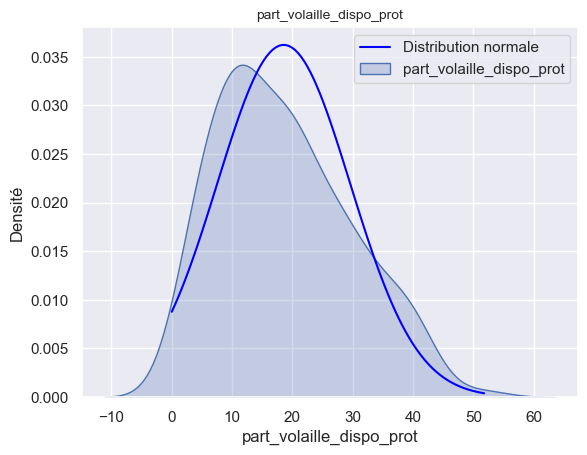

p =  0.00808868762108705
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : pop_2017
variance =2.3557966046813452e+16


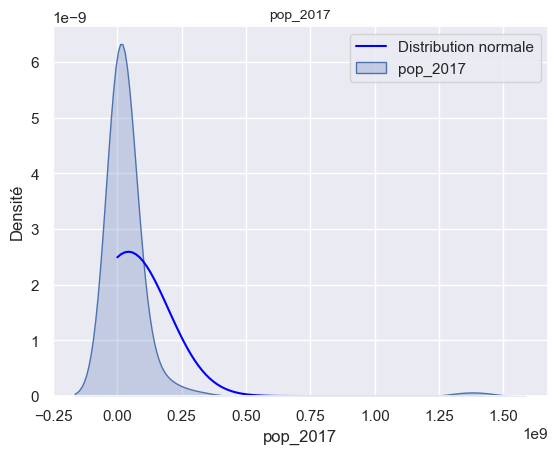

p =  5.106879962984772e-62
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : Evol_pop_sur_5ans_(%)
variance =31.19


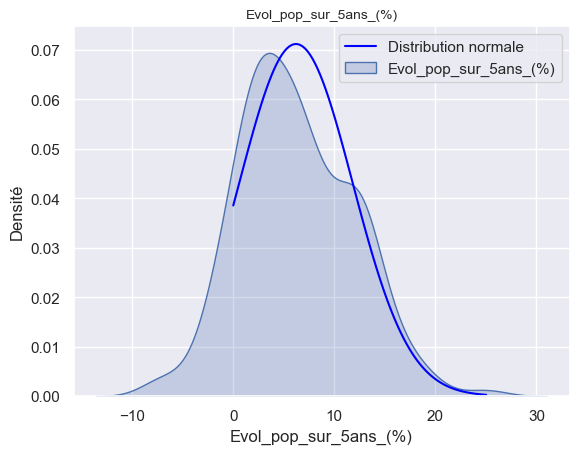

p =  0.1821909080247557
H0 est acceptée : la distribution suit la loi normale

--------------------
Variable : stabilite_politique
variance =0.82


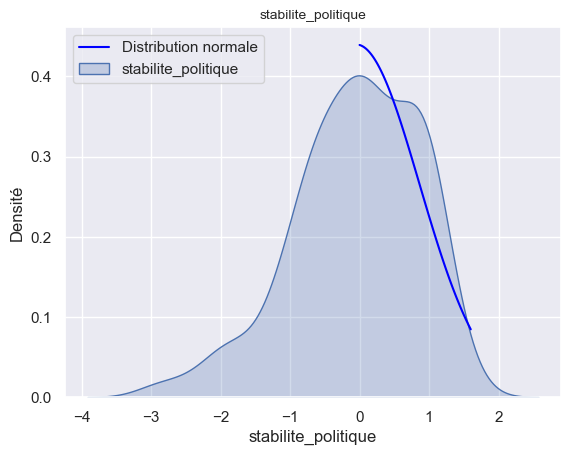

p =  0.0020088853853257797
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : PIB_hab_($)
variance =371925777.6


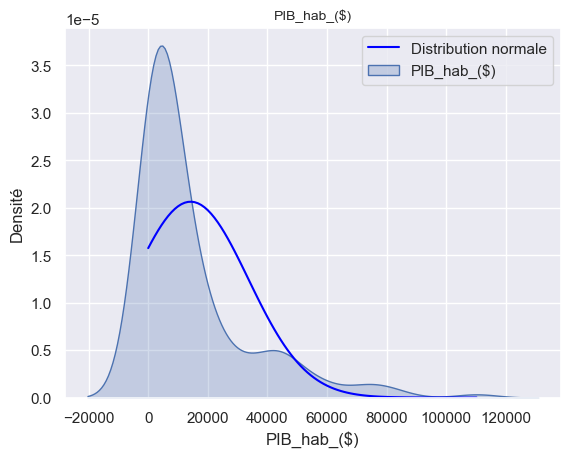

p =  4.787499860289308e-20
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : pop_ss_moyen_alim_saine_(%)
variance =1155.07


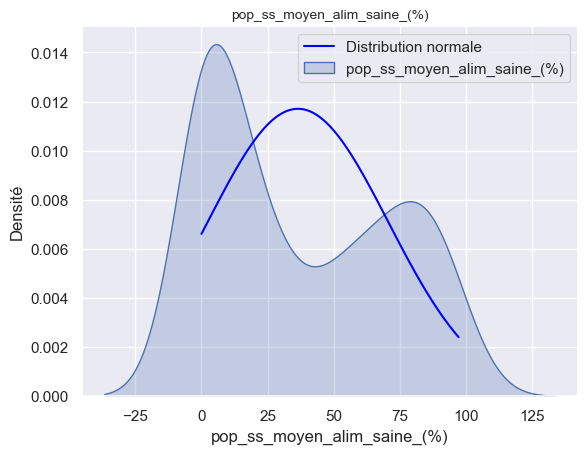

p =  2.710433506633354e-88
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : croissance_PIB_(%)
variance =43.19


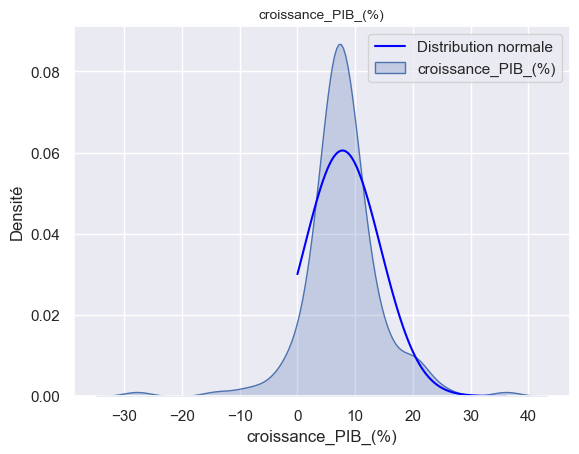

p =  3.536639170161998e-09
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : emissions_CO2_(kt)
variance =917483771090.2


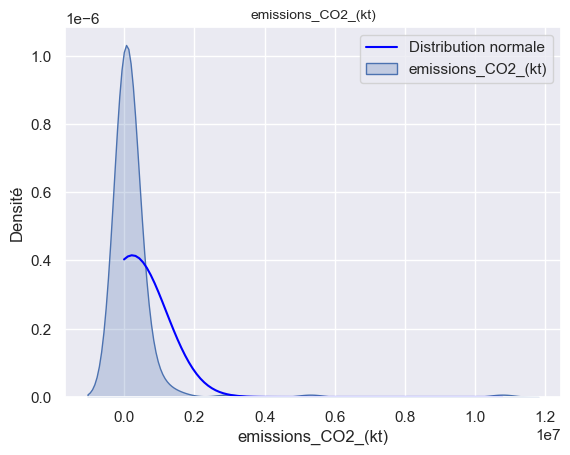

p =  5.917937446194987e-67
H0 peut être rejetée : la distribution ne suit pas la loi normale.

--------------------
Variable : emission_CO2_hab
variance =69359102.83


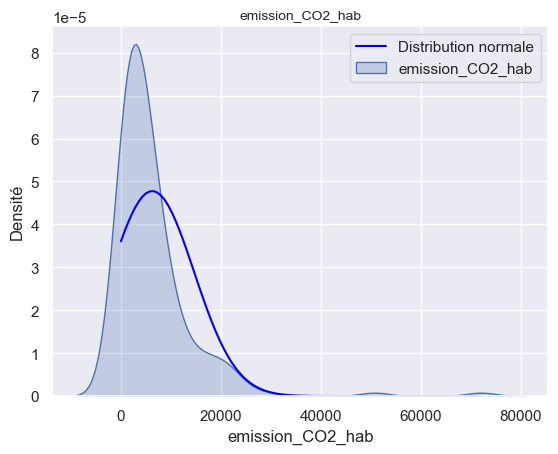

p =  5.122927584053633e-41
H0 peut être rejetée : la distribution ne suit pas la loi normale.


In [173]:
# Test de normalité (K squared D'Agostino) et diagramme de densité
for col in column:
    print('')
    print('-'*20)
    print('Variable :',col)
    print('variance ='+str(round(np.var(data_quanti[col]),2)))
    
    # Distribution de la variable (diagramme de densité) et comparaison avec une distribution normale
    X=data_quanti[col]
    x_min = 0.0
    x_max = max(X)
    mean = X.mean()
    std = X.std()
    
    x = np.linspace(x_min, x_max, 100)
    y = st.norm.pdf(x,mean,std)
    
    plt.plot(x,y, color='blue',label='Distribution normale')
    plt.title(col,fontsize=10)
    plt.xlabel(col)
    plt.ylabel('Densité')
    sns.kdeplot(X,fill=True,label=col)
    plt.legend()
    plt.show()
    
    # Test K squared D'Agostino
    k2, p = st.normaltest(data_quanti[col])
    alpha = 0.05
    print("p = ",p)
    if p < alpha:  # H0 : la variable suit la loi normale de distribution
        print("H0 peut être rejetée : la distribution ne suit pas la loi normale.")
    else:
        print("H0 est acceptée : la distribution suit la loi normale")

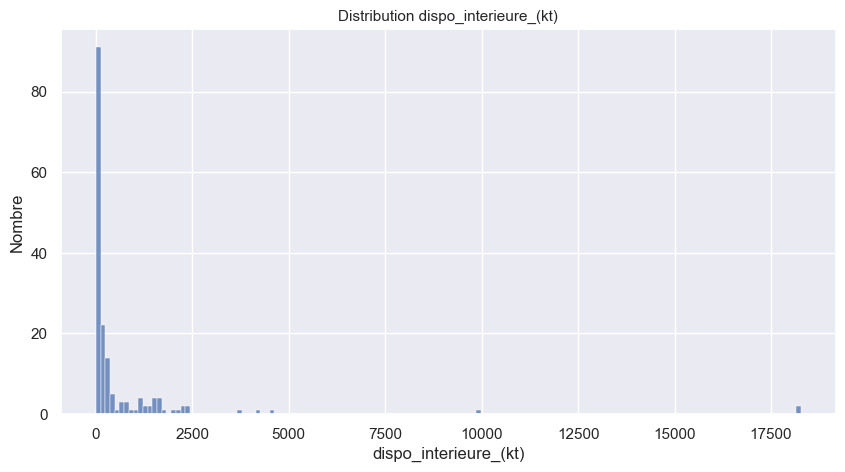

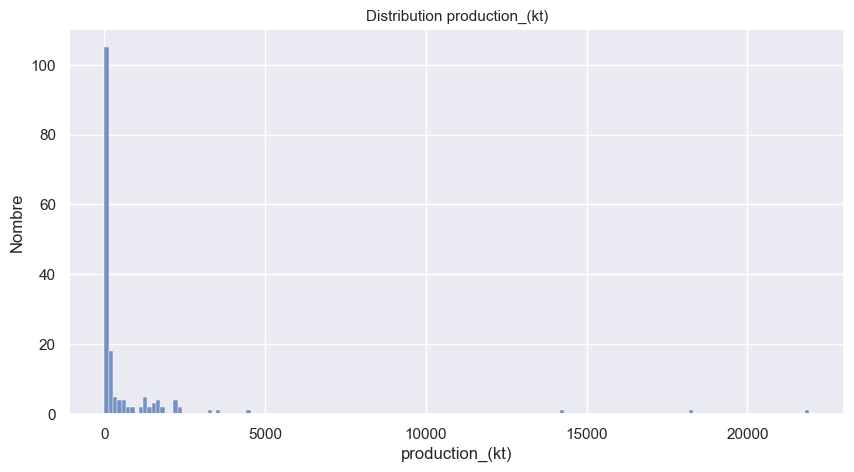

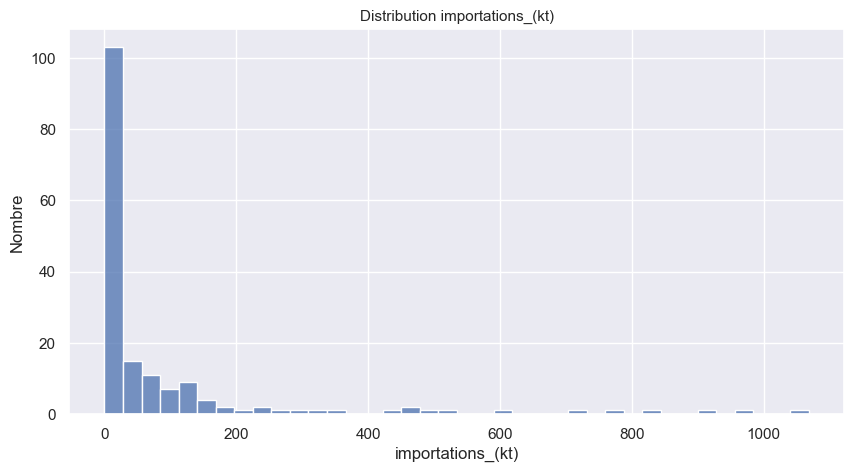

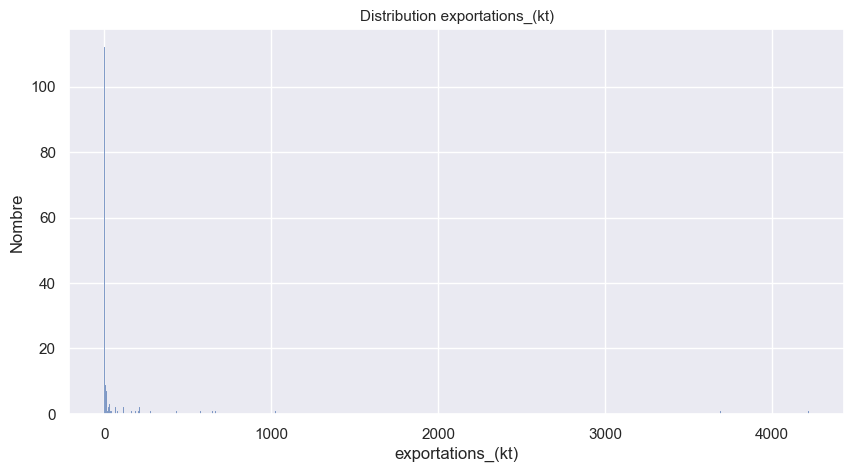

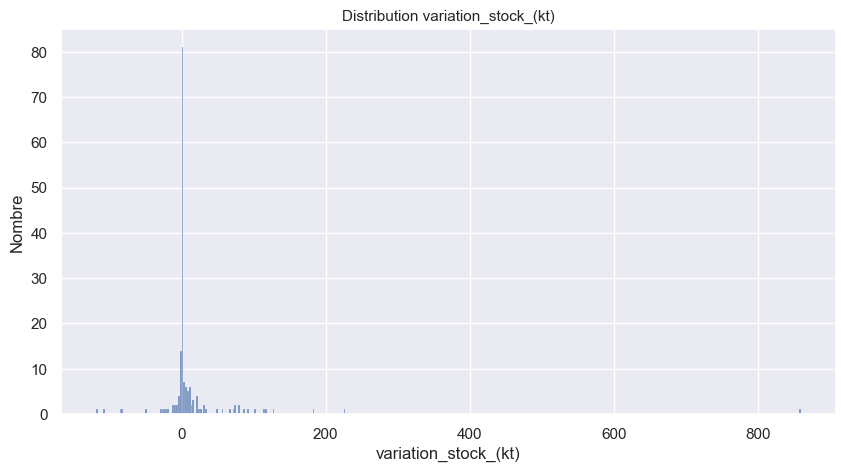

...

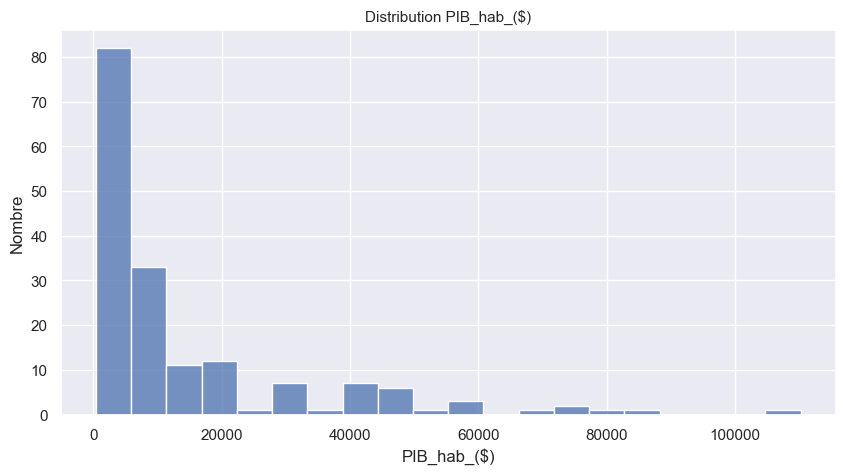

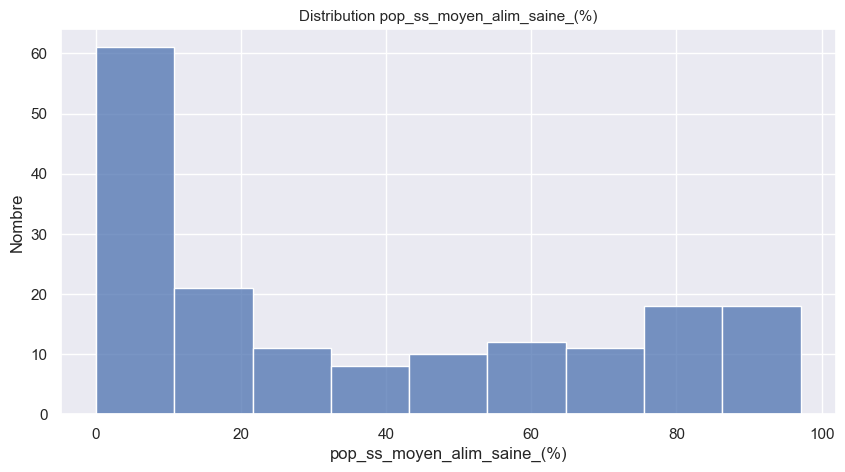

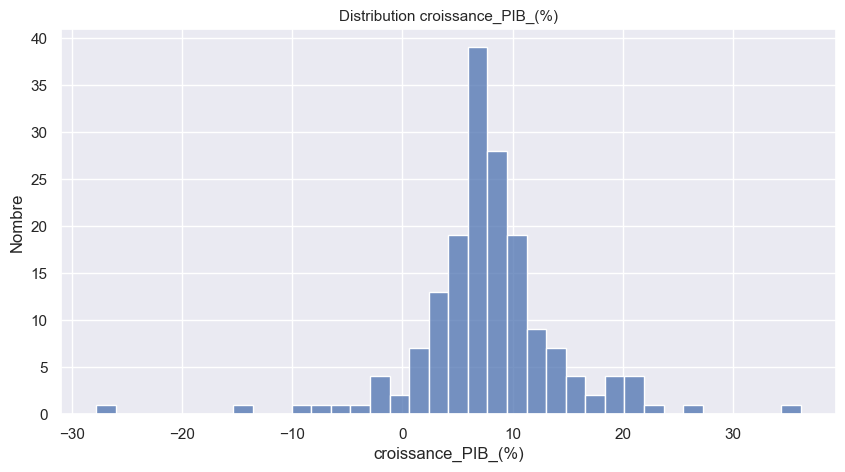

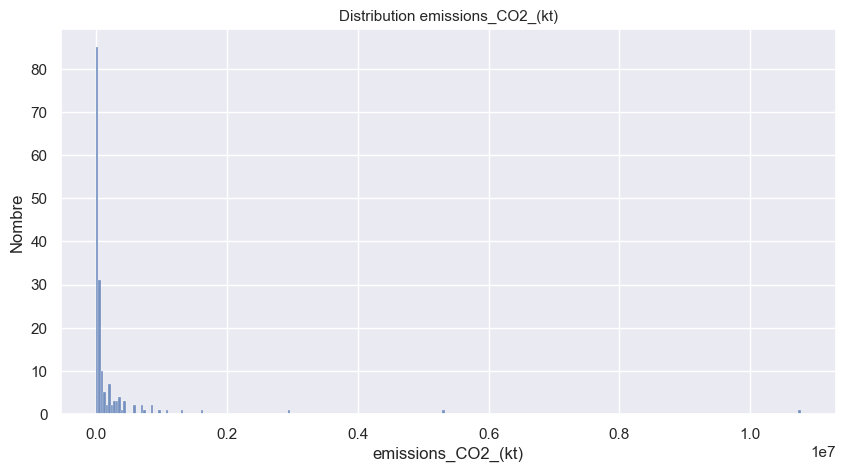

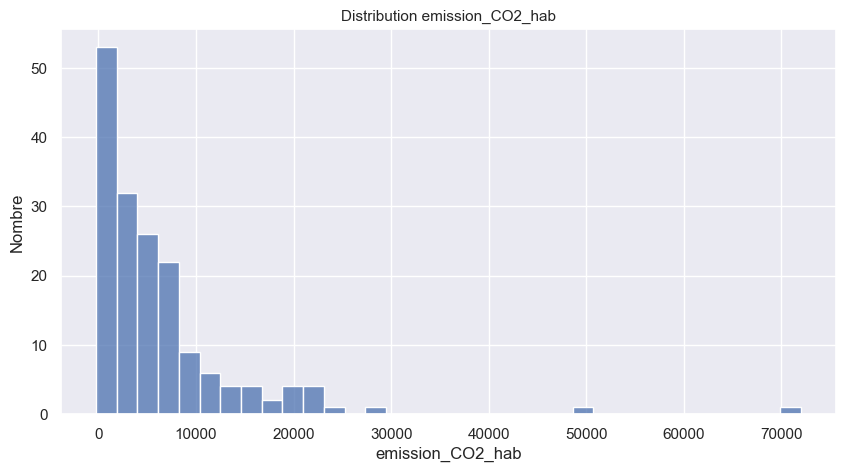

In [174]:
# Boucle pour afficher les histogrammes de chaque variable
for col in data_quanti:
    plt.figure(figsize=(10,5))
    sns.histplot(data=df_complet_ok,x=col)
    plt.xlabel(col)
    plt.ylabel("Nombre")
    plt.title("Distribution "+str(col),fontsize=11)
    plt.show()

##### Inégalité de production, importations, exportations

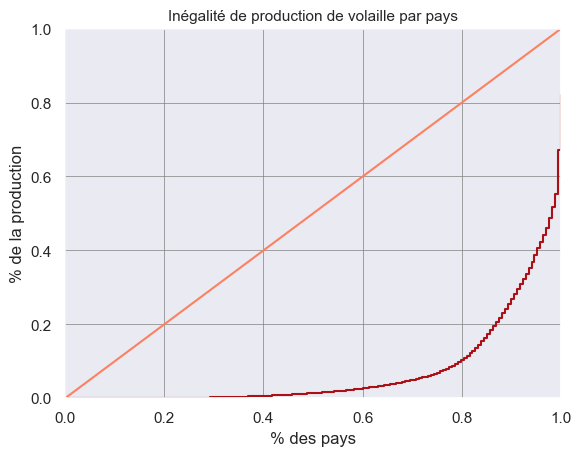

In [175]:
# Courbe de Lorenz
production = df_complet_ok['production_(kt)'].values
n = len(production)
lorenz = np.cumsum(np.sort(production)) / production.sum()
lorenz = np.append([0],lorenz) # La courbe de Lorenz commence à 0

xaxis = np.linspace(0-1/n,1+1/n,n+1) #Il y a un segment de taille n pour chaque individu, plus 1 segment supplémentaire d'ordonnée 0. Le premier segment commence à 0-1/n, et le dernier termine à 1+1/n.
plt.plot(xaxis,lorenz,drawstyle='steps-post',color='#aa1016')
plt.plot([0,1], [0,1],color='#fc8161') #tracer la bisséctrice
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel("% des pays")
plt.ylabel("% de la production")
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.title("Inégalité de production de volaille par pays",fontsize=11)
plt.show()

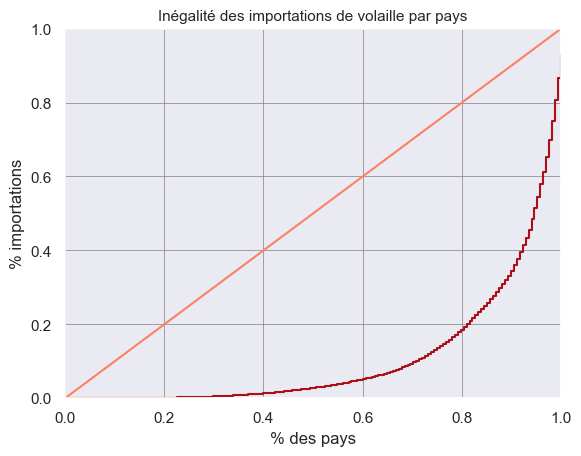

In [176]:
# Courbe de Lorenz
importations = df_complet_ok['importations_(kt)'].values
n = len(importations)
lorenz = np.cumsum(np.sort(importations)) / importations.sum()
lorenz = np.append([0],lorenz) # La courbe de Lorenz commence à 0

xaxis = np.linspace(0-1/n,1+1/n,n+1) 
plt.plot(xaxis,lorenz,drawstyle='steps-post',color='#aa1016')
plt.plot([0,1], [0,1],color='#fc8161') #tracer la bisséctrice
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel("% des pays")
plt.ylabel("% importations")
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.title("Inégalité des importations de volaille par pays",fontsize=11)
plt.show()

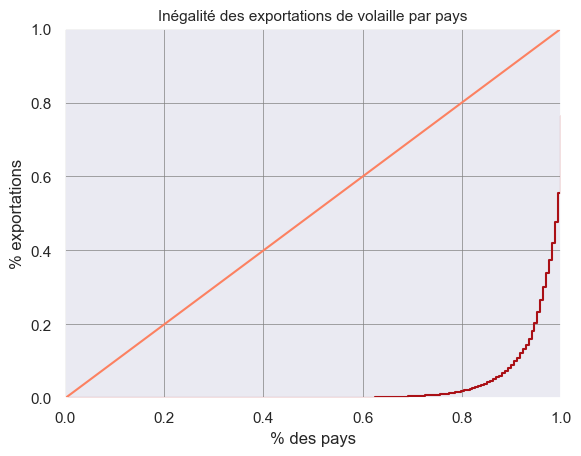

In [177]:
# Courbe de Lorenz
exportations = df_complet_ok['exportations_(kt)'].values
n = len(importations)
lorenz = np.cumsum(np.sort(exportations)) / exportations.sum()
lorenz = np.append([0],lorenz) # La courbe de Lorenz commence à 0

xaxis = np.linspace(0-1/n,1+1/n,n+1) 
plt.plot(xaxis,lorenz,drawstyle='steps-post',color='#aa1016')
plt.plot([0,1], [0,1],color='#fc8161') #tracer la bisséctrice
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel("% des pays")
plt.ylabel("% exportations")
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.title("Inégalité des exportations de volaille par pays",fontsize=11)
plt.show()

## <font color='green'>3. Corrélations entre les variables<a class="anchor" id="3_3"></a></font> 

=> Les variables 'dispo_alim_(kg/pers/an)', 'dispo_alim_(kcal/pers/j)','dispo_mg_(g/pers/j)','dispo_prot_(g/pers/j)' sont très fortement corrélées ( heatmap ci-dessus et graphiques ci-dessous) : seule la variable 'dispo_alim_(kg/pers/an)' sera conservée pour l'analyse.

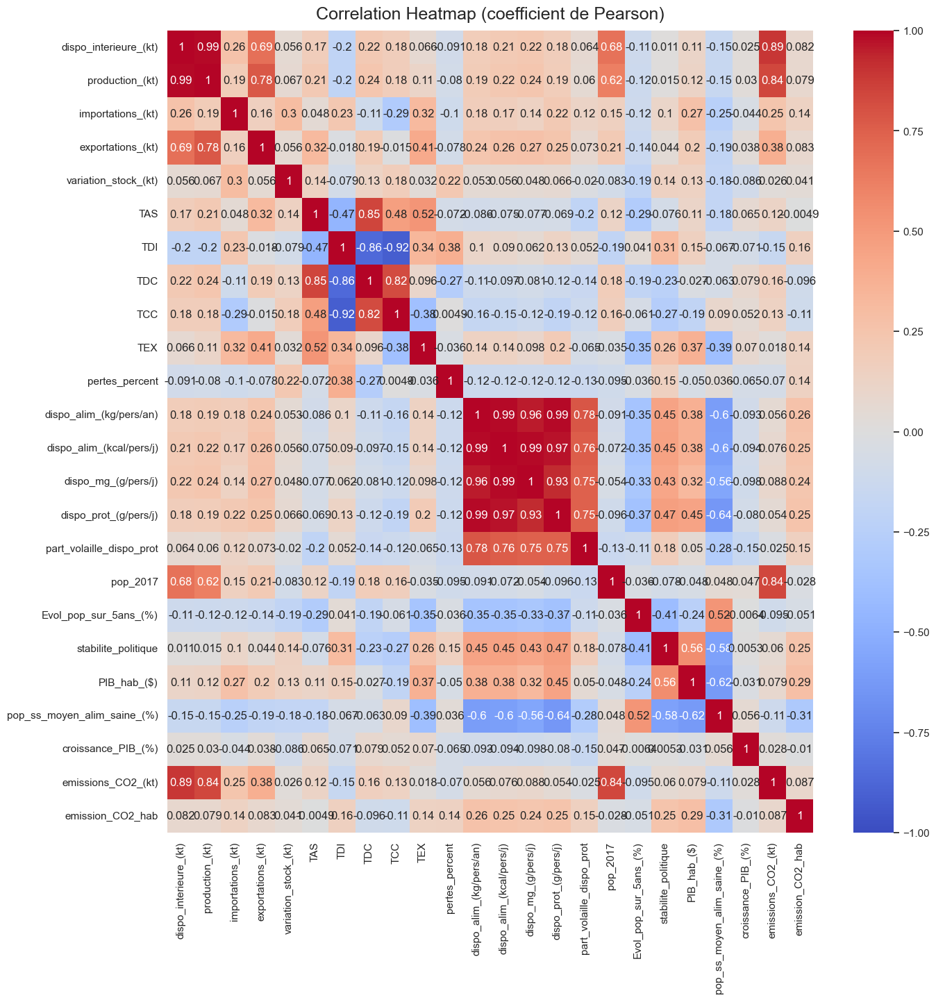

In [178]:
# Calcul du coefficient de corrélation de Pearson et représentation sous forme de heatmap
plt.figure(figsize=(15,15))
heatmap = sns.heatmap(data_quanti.corr(method='pearson'), vmin=-1, vmax=1, annot=True, cmap='coolwarm')
heatmap.set_title('Correlation Heatmap (coefficient de Pearson)', fontdict={'fontsize':18}, pad=12)
plt.show()

In [179]:
# Observation graphiques des vraiables très fortement corrélées
selection =['dispo_alim_(kg/pers/an)', 
            'dispo_alim_(kcal/pers/j)',
            'dispo_mg_(g/pers/j)', 
            'dispo_prot_(g/pers/j)']

import plotly.express as px

fig = px.scatter_matrix(df_complet_ok, dimensions=selection)
fig.update_traces(diagonal_visible=False)
fig.show()

C:\Users\Adeline\anaconda3\lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



In [180]:
# Sélection des colonnes 
selection = ['TAS', 
             'TDI',
             'TDC',
             'TCC',
             'TEX']

fig = px.scatter_matrix(df_complet_ok, dimensions=selection)
fig.update_traces(diagonal_visible=False)
fig.show()

C:\Users\Adeline\anaconda3\lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



## <font color='green'>4. Analyse bi-variée<a class="anchor" id="3_4"></a></font> 

* Analyse par continent :
    * L'Océanie est le continent le moins autosuffisant
    * L'Europe est le continent le plus autosuffisant
    * L'Océanie et l'Afrique sont les continents les plus dépendants des importations
    * L'Europe est le continent qui a les capacité d'exportation les plus élevées
* Analyse par revenu :
    * les pays à revenu moyen supérieur sont ceux qui exportent le plus

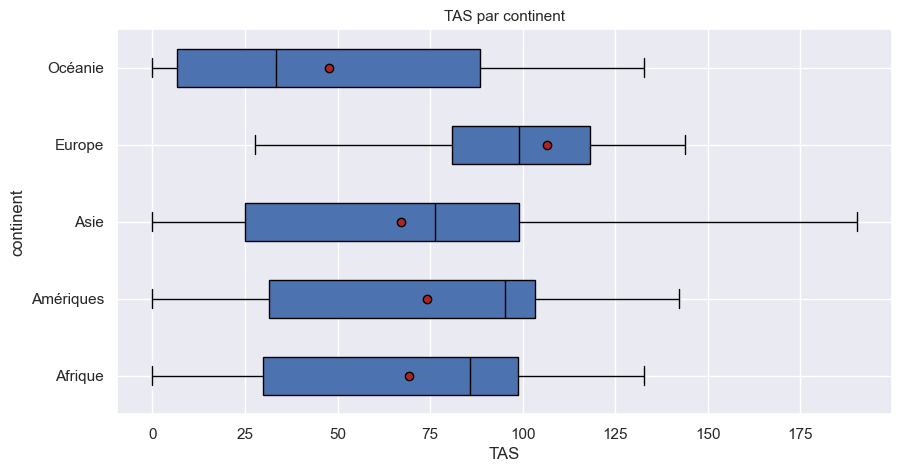

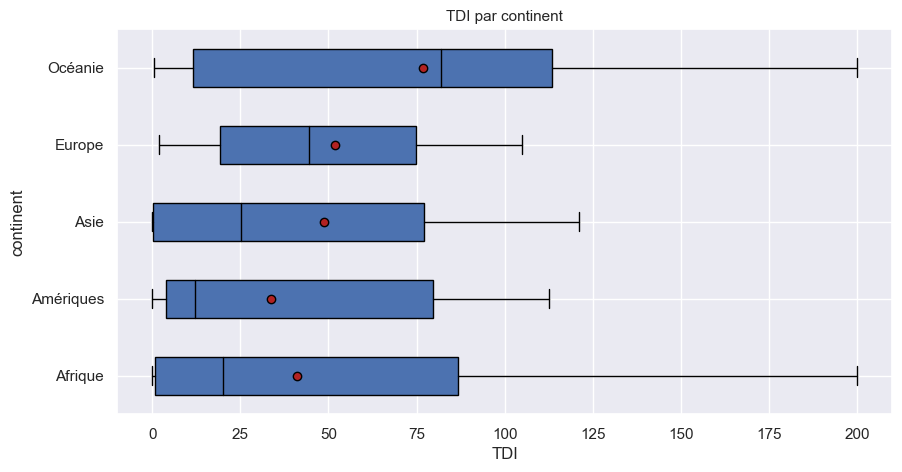

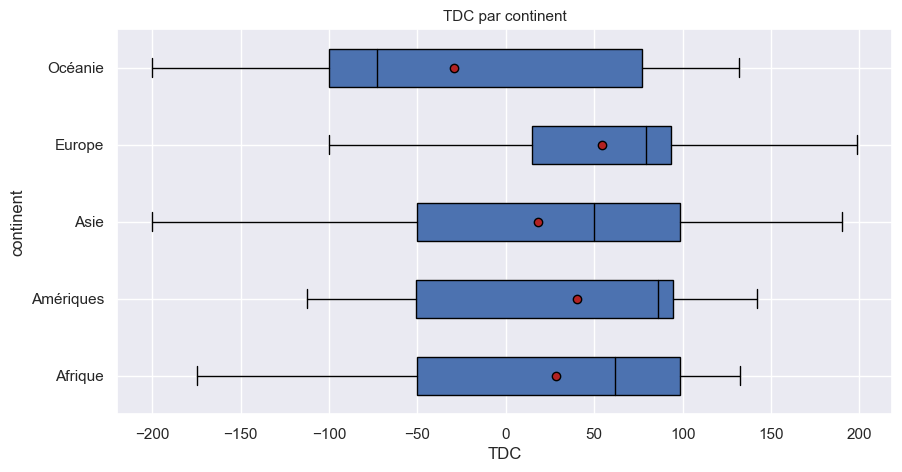

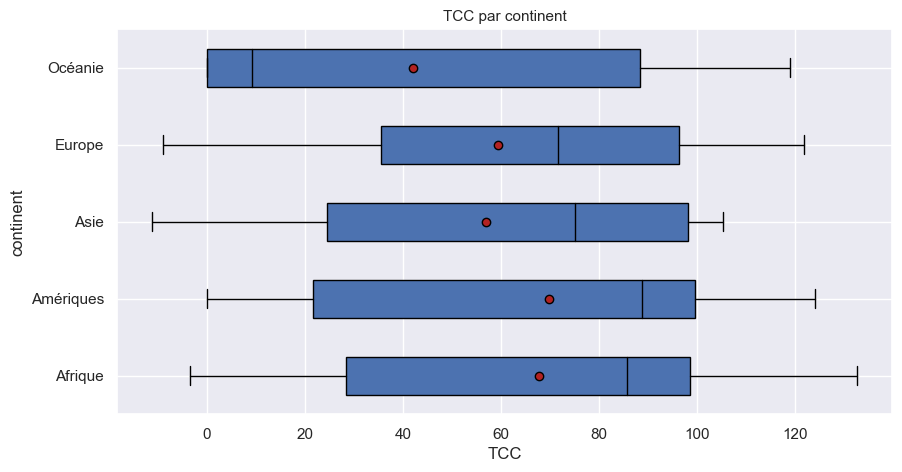

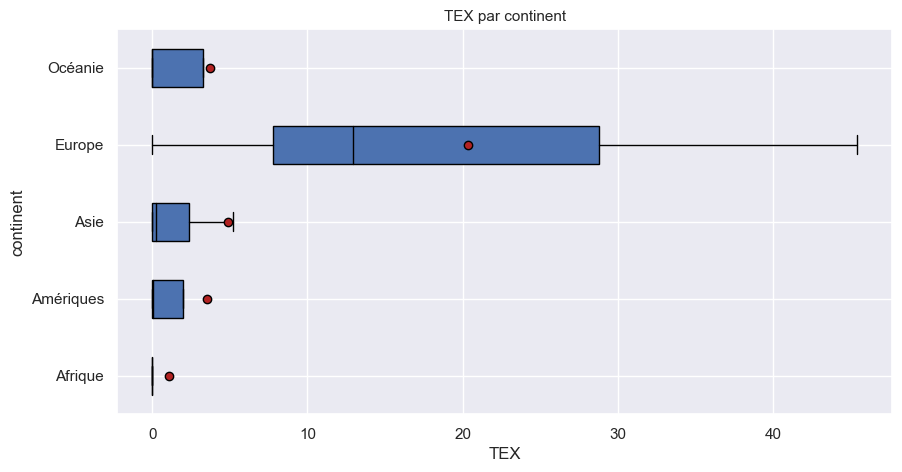

In [181]:
# Boucle pour afficher les boxplots de chaque variable par continent
for col in selection:    
    X = "continent" # qualitative
    Y = col # quantitative
    l_h=(10,5) # dimensions du graphe
    showfliers=False # pas d'affichage des outliers

    modalite_boxplot(df_complet_ok,X,Y,l_h,showfliers)  

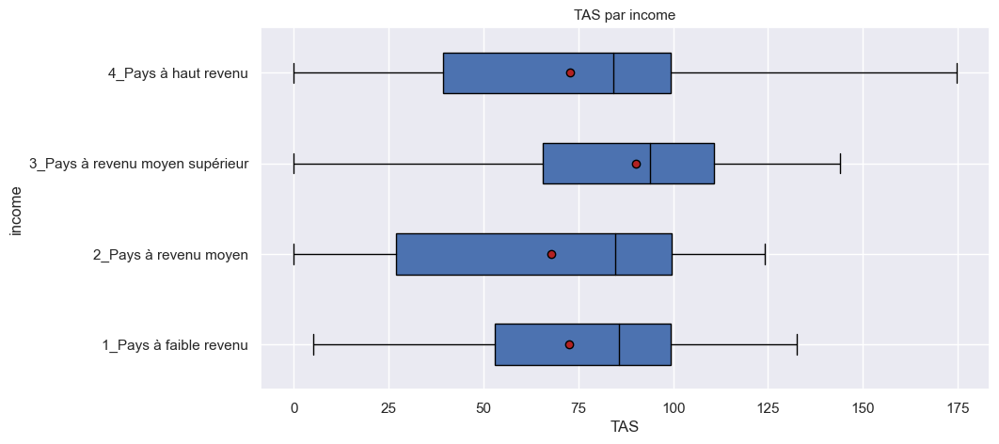

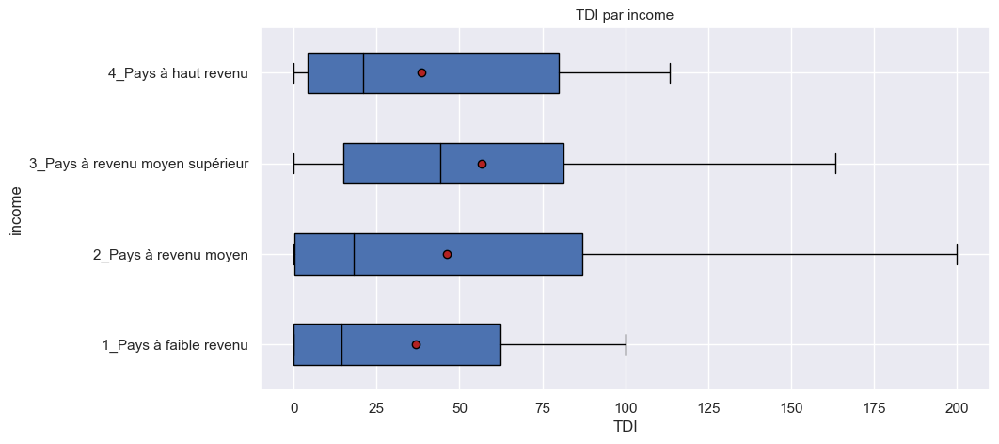

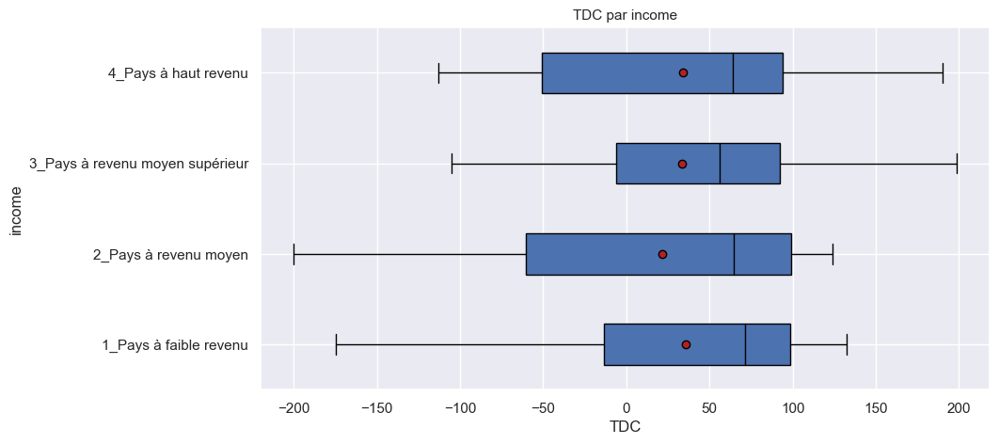

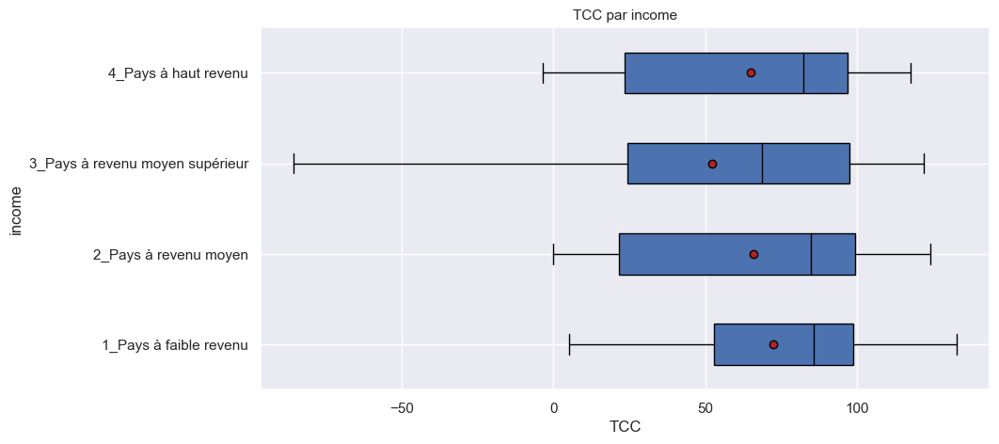

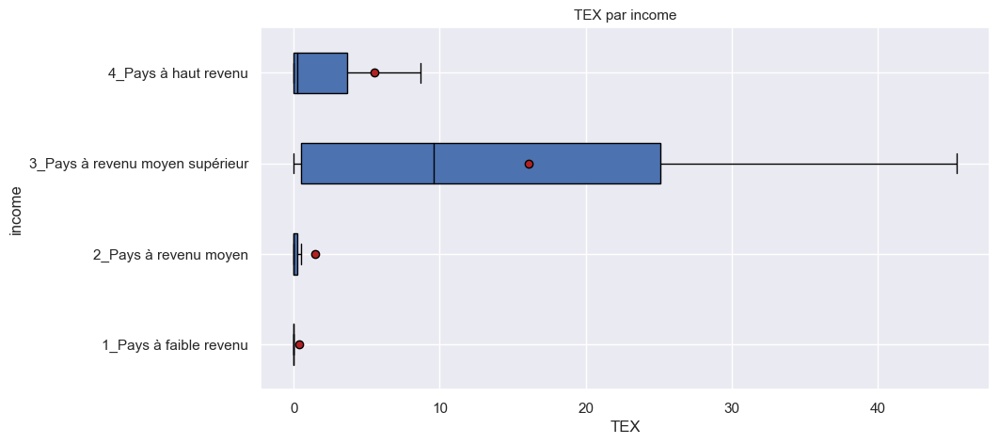

In [182]:
# Boucle pour afficher les boxplots de chaque variable par groupe income
for col in selection:    
    X = "income" # qualitative
    Y = col # quantitative
    l_h=(10,5) # dimensions du graphe
    showfliers=False # pas d'affichage des outliers

    modalite_boxplot(df_complet_ok,X,Y,l_h,False)  

## <font color='green'>5. Top et flop<a class="anchor" id="3_5"></a></font> 

In [183]:
# Boucle pour afficher les extrêmes de chaque variable
for col in selection:  
    print('')
    print('-'*60)
    print(str(col)+' : 10 premiers')
    print(df_complet_ok[['zone',col]].sort_values(col,ascending=False).head(10))
    print('')
    print(str(col)+' : 10 derniers')
    print(df_complet_ok[['zone',col]].sort_values(col,ascending=False).tail(10))


------------------------------------------------------------
TAS : 10 premiers
          zone     TAS
206   Belgique  304.61
213   Pays-Bas  295.70
219    Pologne  203.37
107  Thaïlande  190.24
218    Hongrie  185.34
215    Bélarus  174.72
241   Lituanie  143.90
74      Brésil  142.27
203   Slovénie  138.46
191      Grèce  138.20

TAS : 10 derniers
                                zone  TAS
145                         Mongolie  0.0
246                     Îles Salomon  0.0
35                          Djibouti  0.0
155               Antigua-et-Barbuda  0.0
211                       Luxembourg  0.0
164                        Dominique  0.0
179             Saint-Kitts-et-Nevis  0.0
181  Saint-Vincent-et-les Grenadines  0.0
115                         Maldives  0.0
267                            Samoa  0.0

------------------------------------------------------------
TDI : 10 premiers
                         zone     TDI
140  Chine - RAS de Hong-Kong  323.93
206                  Belgique 

# <font color='blue'>Partie 4 - Analyse en composantes principales (ACP)<a class="anchor" id="partie4"></a></font>

## <font color='green'>1. Différents cas testés<a class="anchor" id="4_1"></a></font>

Plusieurs tests ont été réalisés pour trouver la meileure projection des individus :
* avec les variables initiales
* suppression des variables très fortement corrélées (dispo alim / pers)
* en normalisant des variables : 
    * transformation de la population 
    * ratio par habitant
    * utilisation de taux (TAS, TDI, TEX, TDC et TDI)
* utilisation de RobustScaler au lieu de StandardScaler


**Cas retenu =**
* Variables : 
    * 'TAS', 
    * 'TDI',
    * 'TDC',
    * 'TCC',
    * 'TEX',
    * 'dispo_alim_(kg/pers/an)',
    * 'part_volaille_dispo_prot',
    * 'pop_2017' avec transformation log 
    * 'Evol_pop_sur_5ans_(%)',
    * 'stabilite_politique', 
    * 'PIB_hab_($)',
    * 'pop_ss_moyen_alim_saine_(%)',
    * 'croissance_PIB_(%)', 
    * 'emission_CO2_hab
* StandardScaler

In [184]:
df_acp = df_complet_ok[['zone',                           
                        'TAS', 
                        'TDI',
                        'TDC',
                        'TCC',
                        'TEX',
                        'dispo_alim_(kg/pers/an)',
                        'part_volaille_dispo_prot',
                        'pop_2017', 
                        'Evol_pop_sur_5ans_(%)',
                        'stabilite_politique', 
                        'PIB_hab_($)',
                        'pop_ss_moyen_alim_saine_(%)',
                        'croissance_PIB_(%)', 
                        'emission_CO2_hab' 
                        ]].copy()

In [185]:
# Mettre la colonne 'zone' en index
df_acp = df_acp.set_index('zone')

In [186]:
df_acp = df_acp.assign(pop_log = np.log(df_acp['pop_2017']))

In [187]:
df_acp.drop(columns=['pop_2017'],inplace = True)

In [188]:
df_acp.shape

(170, 14)

In [189]:
df_acp.head()

,TAS,TDI,TDC,TCC,TEX,dispo_alim_(kg/pers/an),part_volaille_dispo_prot,Evol_pop_sur_5ans_(%),stabilite_politique,PIB_hab_($),pop_ss_moyen_alim_saine_(%),croissance_PIB_(%),emission_CO2_hab,pop_log
zone,,,,,,,,,,,,,,
Afrique du Sud,78.71,24.27,54.44,75.73,2.89,35.69,40.83,7.326988,-0.28,6723.928582,65.2,17.703800,10137.44,17.858733
Botswana,71.43,42.86,28.57,71.43,0.00,3.39,4.50,7.506485,1.02,6705.339802,63.8,6.779399,22671.74,14.606274
Eswatini,85.71,28.57,57.14,85.71,0.00,6.46,12.32,4.046657,-0.27,3822.793411,74.8,15.343500,1581.85,13.933120
Lesotho,11.76,88.24,-76.47,11.76,0.00,7.93,22.26,3.659515,-0.19,1061.916962,80.2,9.013723,1361.71,14.553408
Namibie,39.29,103.57,-64.29,-3.57,30.00,11.53,18.67,8.650926,0.63,5450.334514,54.4,20.196593,7066.95,14.692076


## <font color='green'>2. ACP sur le cas retenu<a class="anchor" id="4_2"></a></font>

### 2.1. Séparation des données<a class="anchor" id="4_2_1">

In [190]:
# Matrice des données 
X = df_acp.values

In [191]:
# Vérifier la dimension
X.shape

(170, 14)

In [192]:
# Noms des individus
names = df_acp.index

In [193]:
# Noms des variables
features = df_acp.columns

In [194]:
p = df_acp.shape[1] # nb de variables

### 2.2 Détermination du nombre de composantes<a class="anchor" id="4_2_2">

#### a. Scaling (centrage-reduction)

In [195]:
# Instanciation
scaler = StandardScaler()

# Fit and transform
X_scaled = scaler.fit_transform(X)

# Visualisation de la moyenne et de l'écart-type : attendu moy = 0 et std =1
idx = ["mean", "std"]
pd.DataFrame(X_scaled).describe().round(2).loc[idx, :]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
mean,-0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


#### b. ACP

In [196]:
# Instanciation de l'ACP
pca2 = PCA()

# Entraînement sur les données scalées
pca2.fit(X_scaled)

PCA()

#### c. Valeurs propres

Les 6 premières composantes permettent d'expliquer plus de 80% de la variance.

In [197]:
scree = pd.DataFrame(
    {
        "Dimension" : ["Dim" + str(x + 1) for x in range(p)], 
        "Variance expliquée" : pca2.explained_variance_,
        "% variance expliquée" : np.round(pca2.explained_variance_ratio_ * 100),
        "% cum. var. expliquée" : np.round(np.cumsum(pca2.explained_variance_ratio_) * 100)
    }
)
scree

,Dimension,Variance expliquée,% variance expliquée,% cum. var. expliquée
0,Dim1,4.190556e+00,30.0,30.0
1,Dim2,3.182702e+00,23.0,52.0
2,Dim3,1.773282e+00,13.0,65.0
3,Dim4,1.025421e+00,7.0,72.0
4,Dim5,9.904096e-01,7.0,79.0
5,Dim6,9.226194e-01,7.0,86.0
6,Dim7,6.749770e-01,5.0,91.0
7,Dim8,5.001376e-01,4.0,94.0
8,Dim9,2.802677e-01,2.0,96.0
9,Dim10,2.601951e-01,2.0,98.0


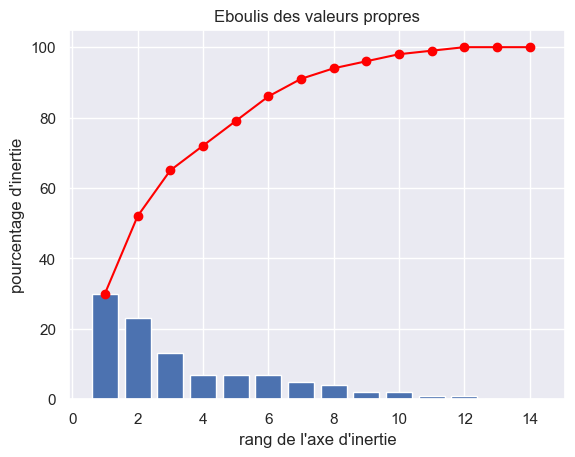

In [198]:
# liste des composants (indice des composantes)
x_list = range(1, p+1)
list(x_list)

# Représentation graphiques des valeurs propres
plt.bar(x_list, scree['% variance expliquée'])
plt.plot(x_list, scree['% cum. var. expliquée'],c="red",marker='o')
plt.xlabel("rang de l'axe d'inertie")
plt.ylabel("pourcentage d'inertie")
plt.title("Eboulis des valeurs propres")
plt.show(block=False)

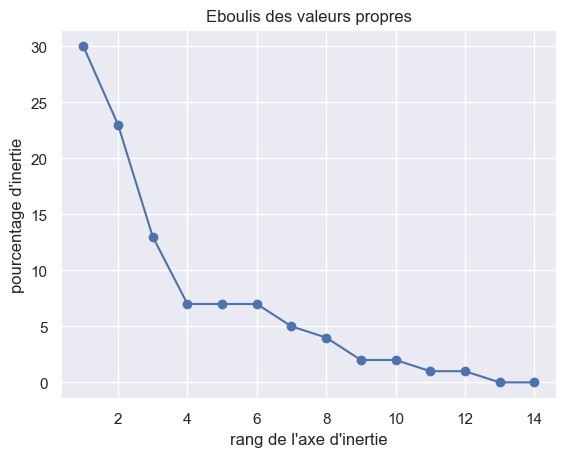

In [199]:
# Représentation graphiques des valeurs propres - méthode du coude
plt.plot(x_list, scree['% variance expliquée'],marker='o')
plt.xlabel("rang de l'axe d'inertie")
plt.ylabel("pourcentage d'inertie")
plt.title("Eboulis des valeurs propres")
plt.show(block=False)

### 2.3. Composantes principales<a class="anchor" id="4_2_3">

In [200]:
# Nombre de composantes principales 
n_components = 6

# Instanciation de l'ACP
pca = PCA(n_components=n_components)

# Entraînement sur les données scalées
pca.fit(X_scaled)

PCA(n_components=6)

In [201]:
# Principal Components = PCs
pcs = pd.DataFrame(pca.components_)

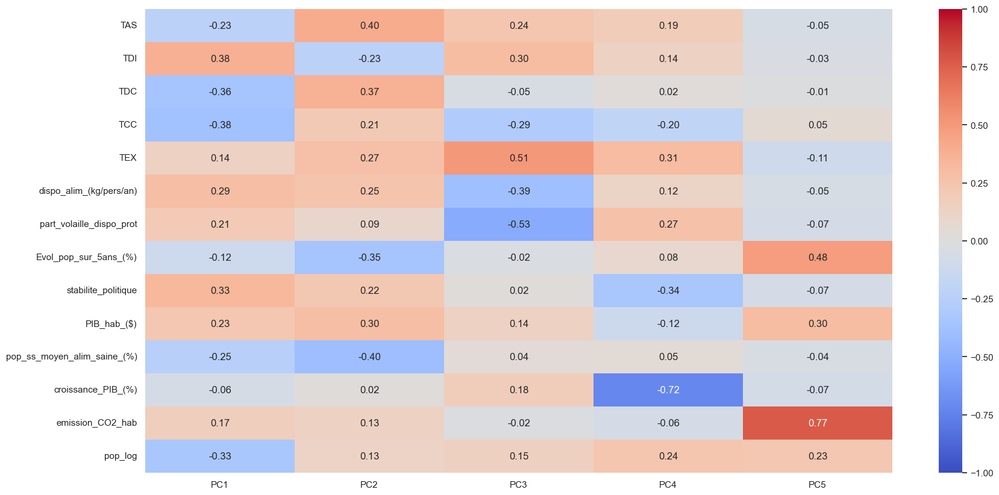

In [202]:
# affichage de 'features' pour les colonnes et Fi en index
pcs.columns = features

# liste des composants (indice des composantes)
x_list = range(1, n_components+1)
list(x_list)

pcs.index = [f"PC{i}" for i in x_list]
pcs.round(2)

# Représentation sous forme de heatmap des 5 premières composantes
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(pcs.T.iloc[:,:5], vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")
plt.show()

### 2.4. Représentation graphique de l'ACP <a class="anchor" id="4_2_4">

#### a. Graphe des corrélations

##### Interprétation des composantes
| PC  | Variables les mieux représentées (par qualité de représentation décroissante) |
|:---:|:---------------------------------------------------------------------------------------|
| PC1 | TDI, TCC, TDC, stabilité politique, pop_log                                            |
| PC2 | TAS, pop_ss_moyen_alim_saine_(%), TDC, Evol_pop_5_ans_(%), PIB_hab_($)                 |
| PC3 | part_volaille_dispo_prot, TEX, dispo_alim_(kg/pers/j)                                  |
| PC4 | croissance_PIB_(%), stabilité politique                                                |

Première composante PC1 : 
* Plus le pays est dépendant des importations
    * plus les taux de couverture de la consommation par la production diminue
    * plus le taux de dépendance au commerce diminue
    * Plus la stabilité politique augmente, 
    * Plus la taille de la population diminue

Deuxième composante PC2 :
* Plus le pays est autosuffisant :
    * plus l'alimentation est abordable pour la population nationale
    * plus le taux de dépendance au commerce augmente
    * moins la population croît
    * plus le PIB par habitant augmente
    
Troisième composante PC3
* Plus la part de la volaille dans les apports en protéine d'origine animale diminue, 
    * plus le taux d'exportations augmente
    * plus la disponibilité alimentaire en volaille diminue

Quatrième composante PC4
* Plus la croissance du PIB diminue, plus la stabilité politique diminue


##### Premier plan factoriel

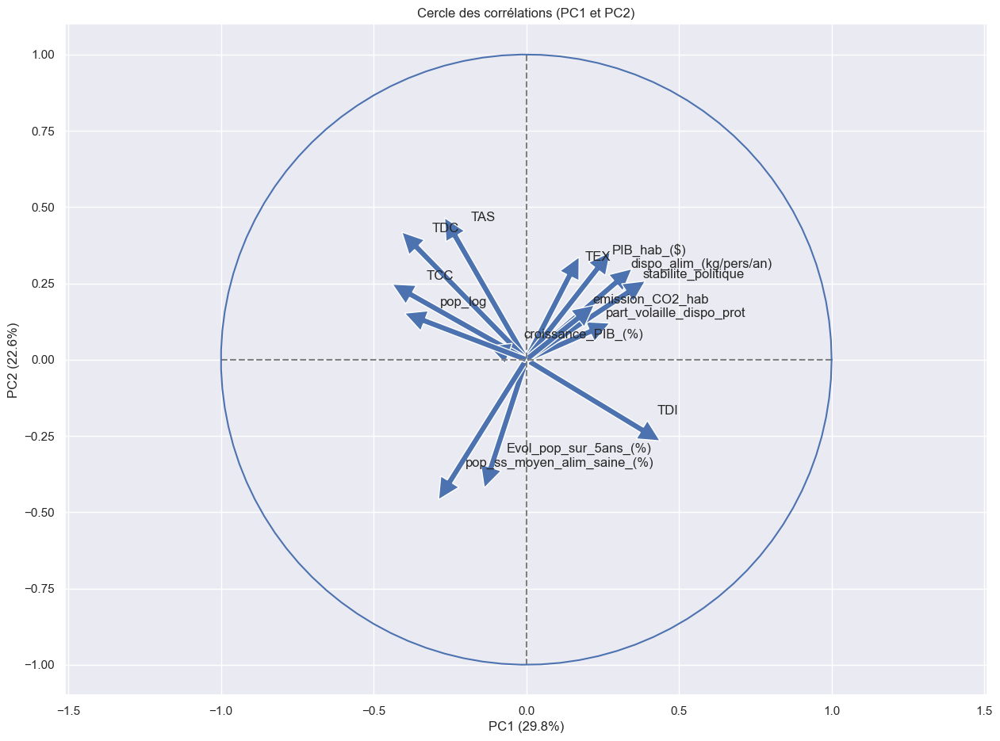

In [203]:
# Graphe de corrélation pour PC1 et PC2
correlation_graph(pca, (0,1), features)

##### Deuxième plan factoriel

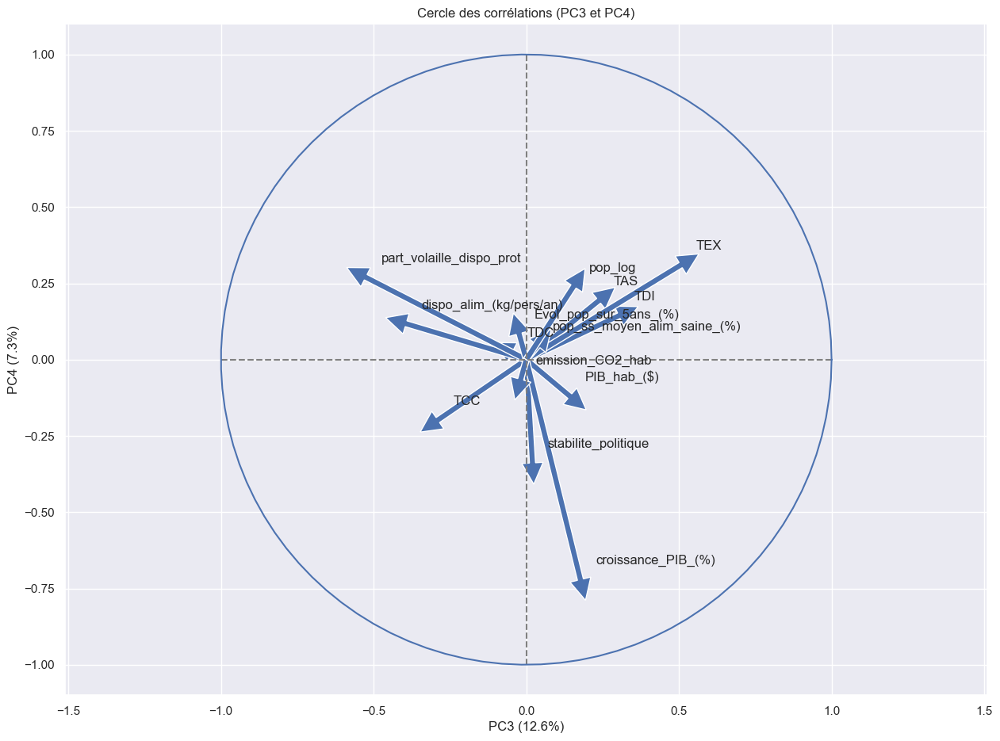

In [204]:
# Graphe de corrélation pour F3 et F4
correlation_graph(pca, (2,3), features)

##### Qualité de représentation des variables sur les composantes principales

* Qualité de représentation de chaque variable = coefficients cosinus² = (coordonnées des variables)² 
* Les variables les mieux représentées : taux de représentation supérieur à la moyenne sur chaque composante

In [205]:
n = df_acp.shape[0] # nb individus
p = df_acp.shape[1] # nb de variables
pc = n_components # nb de composantes

eigval = (n-1) / n * pca.explained_variance_ # valeurs propres
sqrt_eigval = np.sqrt(eigval) # racine carrée des valeurs propres

corvar = np.zeros((p,pc)) # matrice vide pour avoir les coordonnées

for k in range(pc):
    corvar[:,k] = pca.components_[k,:] * sqrt_eigval[k]

In [206]:
#cosinus carré des variables
cos2var = corvar**2

COS = [] # création liste vide
for k in range(1,pc+1): # boucle pour créer la liste de noms des colonnes (COS2_1, ...)
    COS_num = "COS2_"+str(k)
    COS.append(COS_num)

# Dataframe avec les coefficients cos² des variables pour toutes les composantes principales   
df_ctr_variables = pd.DataFrame(cos2var, columns = COS, index = features)

In [207]:
# Variables contribuant à la première composante
df_ctr_variables[df_ctr_variables['COS2_1'] > df_ctr_variables['COS2_1'].mean()]\
        .sort_values('COS2_1', ascending = False)\
        .index

Index(['TDI', 'TCC', 'TDC', 'pop_log', 'stabilite_politique',
       'dispo_alim_(kg/pers/an)'],
      dtype='object')

In [208]:
df_ctr_variables[df_ctr_variables['COS2_2'] > df_ctr_variables['COS2_2'].mean()]\
        .sort_values('COS2_2', ascending = False)\
        .index

Index(['TAS', 'pop_ss_moyen_alim_saine_(%)', 'TDC', 'Evol_pop_sur_5ans_(%)',
       'PIB_hab_($)', 'TEX'],
      dtype='object')

In [209]:
df_ctr_variables[df_ctr_variables['COS2_3'] > df_ctr_variables['COS2_3'].mean()]\
        .sort_values('COS2_3', ascending = False)\
        .index

Index(['part_volaille_dispo_prot', 'TEX', 'dispo_alim_(kg/pers/an)', 'TDI',
       'TCC'],
      dtype='object')

In [210]:
df_ctr_variables[df_ctr_variables['COS2_4'] > df_ctr_variables['COS2_4'].mean()]\
        .sort_values('COS2_4', ascending = False)\
        .index

Index(['croissance_PIB_(%)', 'stabilite_politique', 'TEX',
       'part_volaille_dispo_prot'],
      dtype='object')

#### b. Projection des individus

In [211]:
X_proj = pca.transform(X_scaled)
X_proj[:5]

array([[-0.45557513,  0.25745017, -1.42833912, -0.21846918,  0.30569575,
        -2.449765  ],
       [-0.07402858, -0.61088158,  0.57305164, -1.16533664,  1.4620924 ,
         1.10446127],
       [-1.17311459, -0.75646005,  0.20544458, -1.38126309, -0.96718022,
        -0.07979001],
       [ 0.87449499, -2.4627979 ,  0.07398473, -0.21915233, -1.02612663,
        -0.11160459],
       [ 1.65453229, -1.32982114,  1.82589333, -0.96177119, -0.41432114,
        -1.62809267]])

##### Premier plan factoriel

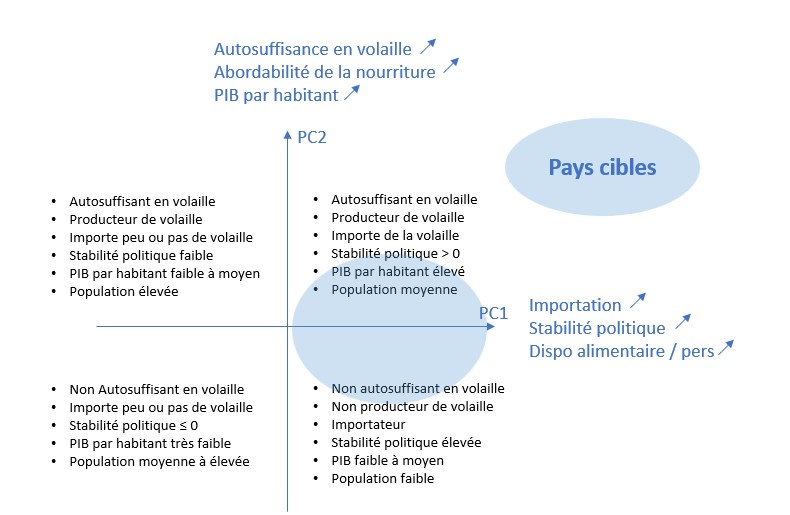

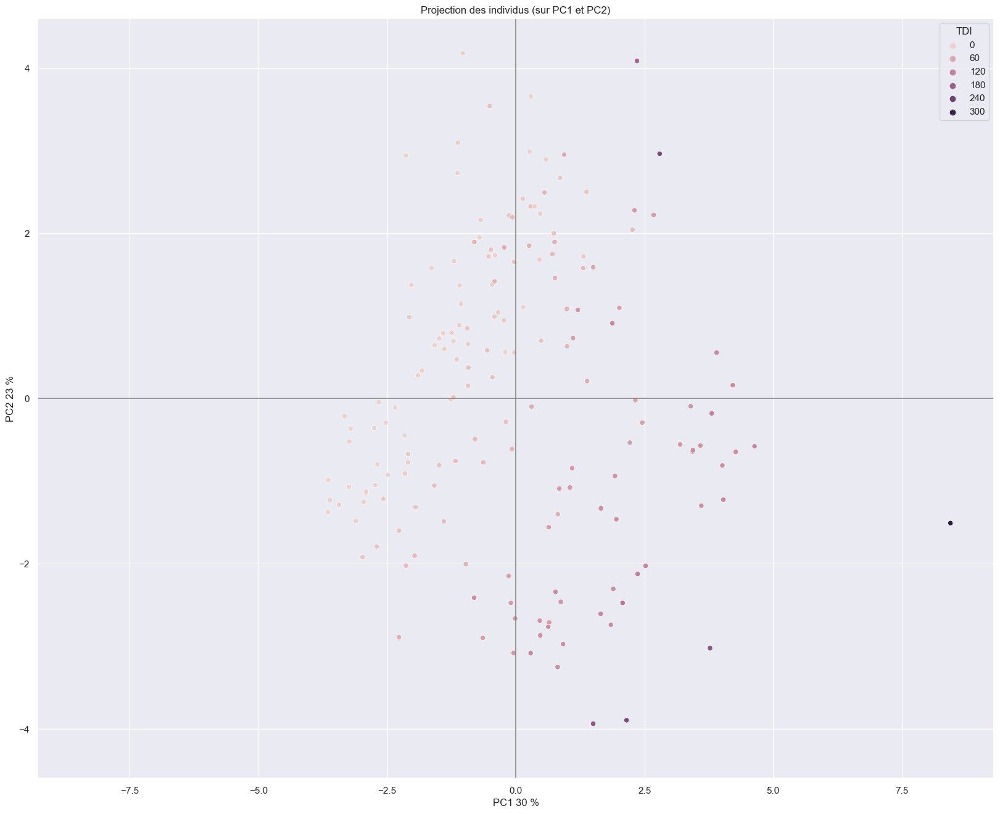

In [212]:
display_factorial_planes(X_proj, 
                         [0,1], 
                         pca, 
                         figsize=(20,16), 
                         clusters=df_acp['TDI'], 
                         marker="o"
                        )

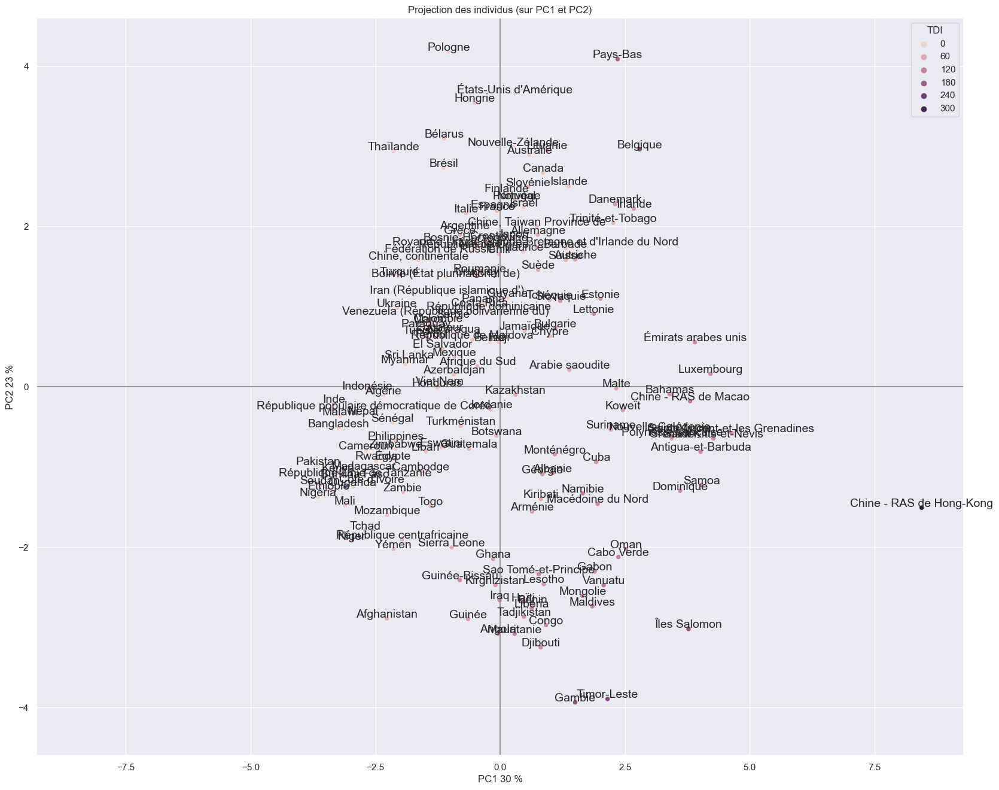

In [213]:
display_factorial_planes(X_proj, 
                         [0,1], 
                         pca, 
                         labels=names, 
                         figsize=(20,16), 
                         clusters=df_acp['TDI'], 
                         marker="o"
                        )

##### Deuxième plan factoriel

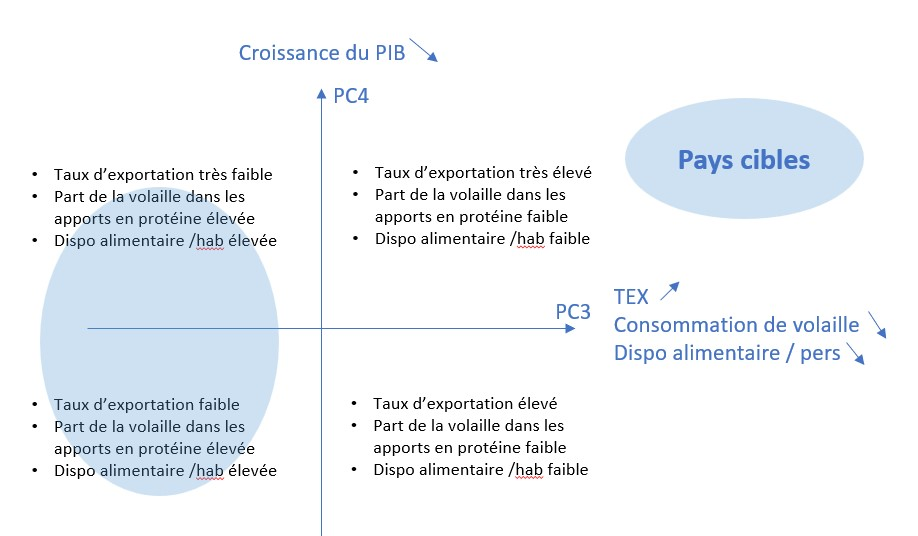

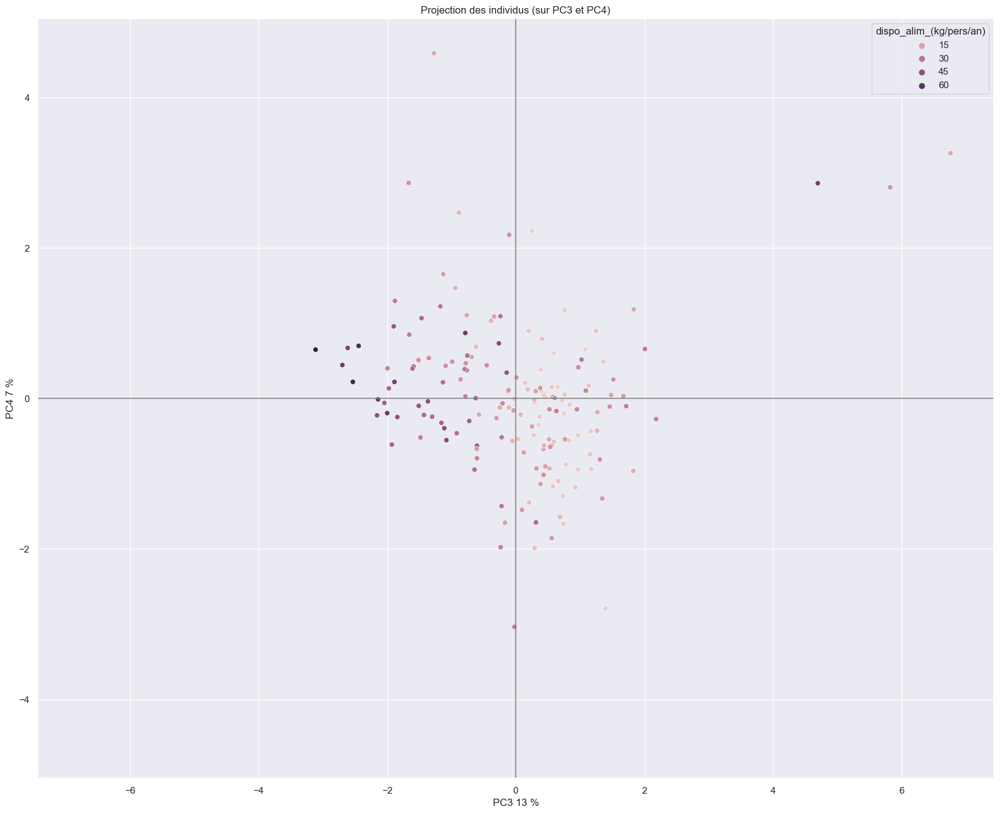

In [214]:
display_factorial_planes(X_proj, 
                         [2,3], 
                         pca, 
                         figsize=(20,16), 
                         clusters=df_acp['dispo_alim_(kg/pers/an)'], 
                         marker="o"
                        )

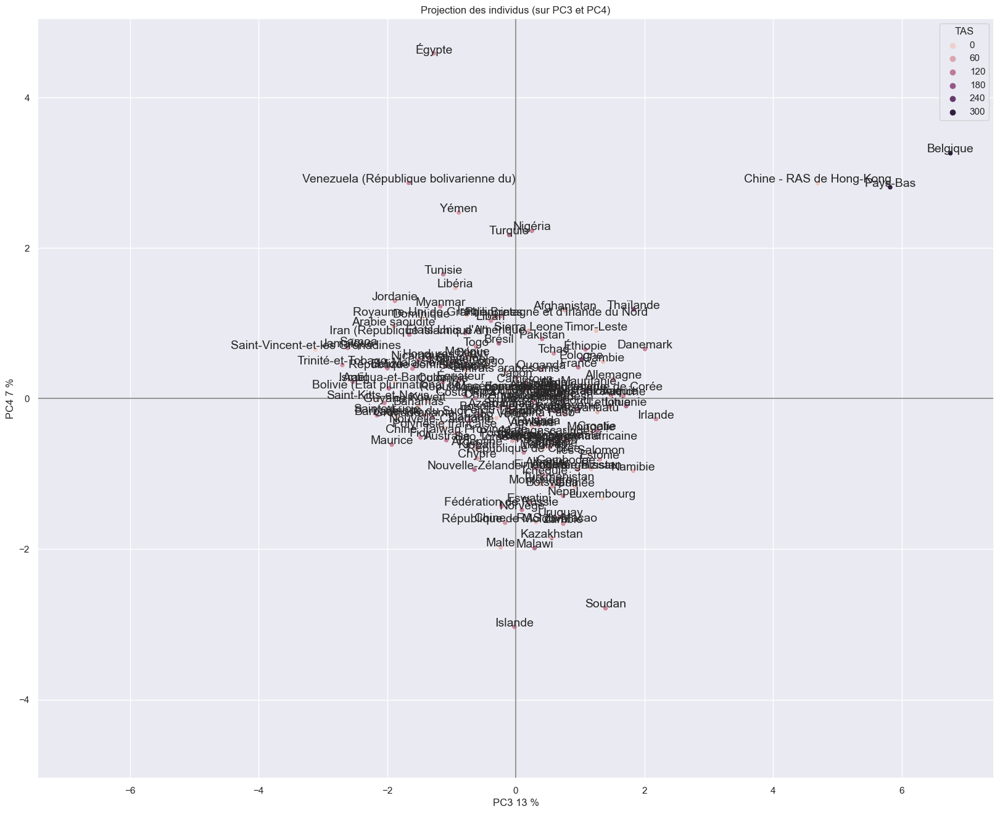

In [215]:
display_factorial_planes(X_proj, 
                         [2,3], 
                         pca, 
                         labels=names, 
                         figsize=(20,16), 
                         clusters=df_acp['TAS'], 
                         marker="o"
                        )

##### Sauvegarde des données pour Clustering et analyses (Notebook 2)

In [216]:
# Enregistrement du dataframe complet en .csv
df_complet_ok.to_csv('df_complet_ok.csv')

In [217]:
# Enregistrement du dataframe complet en .csv
df_acp.to_csv('df_acp.csv')